### 📋 Index

* [1. Business Understanding](#1)

* [2. Data Understanding](#2)
    * [2.1. Loading and Collecting Data](#2.1)
         * [2.1.1. Sales Data](#2.1.1)
         * [2.1.2. CPI Data ](#2.1.2)
         * [2.1.3. Interest Rates Data ](#2.1.3)
         * [2.1.4. Foreign Exchange Data](#2.1.4)
         * [2.1.5. Business Confidence Data](#2.1.5)
         * [2.1.6. US Exclusive Data ](#2.1.6)
         * [2.1.7. Manufacturing Business Confidence Data ](#2.1.7)
         * [2.1.8. Suppliers Data](#2.1.8)
    * [2.2. Describing Data](#2.2)
    * [2.3. Exploring Data](#2.3)
    * [2.4. Data Relationships](#2.5)
* [3. Data Preperation](#3)
    * [3.1. Data Cleaning](#3.1)
         * [3.1.1. Removing Anomalies](#3.1.1)   
    * [3.2. Feature Engineering](#3.2)
* [4. Modeling](#4)
    * [4.1. P1 Forecast](#4.1)
    * [4.2. P3 Forecast](#4.2)
    * [4.3. P4 Forecast](#4.3)
    * [4.4. P5 Forecast](#4.4)
    * [4.5. P6 Forecast](#4.5)
    * [4.6. P8 Forecast](#4.6)
    * [4.7. P9 Forecast](#4.7)
    * [4.8. P11 Forecast](#4.8)
    * [4.9. P12 Forecast](#4.9)
    * [4.10. P13 Forecast](#4.10)
    * [4.11. P14 Forecast](#4.11)
    * [4.12. P16 Forecast](#4.12)
    * [4.13. P20 Forecast](#4.13)
    * [4.14. P36 Forecast](#4.14)
    * [4.15. Total Sales Forecast](#4.15)      
* [5. Conculsion](#5)
     * [5.1 Product Specific Conclusion](#5.1)
     * [5.2. Total Sales High Level Conclusion](#5.2)
     * [5.3. Presentation Metrics References](#5.3)

## Imports

In [389]:
import csv
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
import plotly.express as px
from xgboost import XGBRegressor


import logging
tf.get_logger().setLevel(logging.ERROR)

from sklearn.metrics import mean_squared_error

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.api import VAR
from statsmodels.tsa.arima_model import ARIMA
from sklearn.feature_selection import RFE
from sklearn.feature_selection import mutual_info_regression
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from math import sqrt
from sklearn.preprocessing import StandardScaler, MinMaxScaler


from lightgbm import LGBMRegressor

from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import RANSACRegressor,PassiveAggressiveRegressor,Lars,LinearRegression,RidgeCV,SGDRegressor,HuberRegressor,OrthogonalMatchingPursuitCV,BayesianRidge
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer
from sklearn import metrics
from sklearn.ensemble import ExtraTreesRegressor,RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR,NuSVR,LinearSVR
from sklearn.tree import DecisionTreeRegressor,ExtraTreeRegressor

from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense, LSTM, GRU,Conv1D, MaxPooling1D, Flatten, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from lazypredict.Supervised import LazyRegressor

from skforecast.ForecasterAutoregMultiSeries import ForecasterAutoregMultiSeries
from skforecast.model_selection_multiseries import backtesting_forecaster_multiseries
from skforecast.model_selection_multiseries import grid_search_forecaster_multiseries

import itertools
import time

In [390]:
#precautions
%autosave 90

# Setting global variables
pd.set_option('display.max_columns', 30)

# Ignoring warnings
import warnings
warnings.filterwarnings('ignore')


#Nicosia colour palette
palette = ['#ffffff', '#f6c30b', '#035f99']


Autosaving every 90 seconds


# Functions

In [391]:
# Define a function to create a Pandas DataFrame with performance metrics
def performanceMetricsDF(metricsObj, yTrain, yPredTrain, yTest, yPredTest,set1='Train', set2='Test'):
    # List of performance measures to calculate
    measures_list = ['MAE','RMSE', 'R^2','MAPE (%)','MAX Error']
    
    # Calculate performance measures for the training set and store in train_results list
    train_results = [metricsObj.mean_absolute_error(yTrain, yPredTrain),
                     np.sqrt(metricsObj.mean_squared_error(yTrain, yPredTrain)),
                     metricsObj.r2_score(yTrain, yPredTrain),
                     metricsObj.mean_absolute_percentage_error(yTrain, yPredTrain),
                     metricsObj.max_error(yTrain, yPredTrain)]
    
    # Calculate performance measures for the test set and store in test_results list
    test_results = [metricsObj.mean_absolute_error(yTest, yPredTest),
                    np.sqrt(metricsObj.mean_squared_error(yTest, yPredTest)),
                    metricsObj.r2_score(yTest, yPredTest),
                    metricsObj.mean_absolute_percentage_error(yTest, yPredTest),
                    metricsObj.max_error(yTest, yPredTest)]
    
    # Create a Pandas DataFrame to store the performance metrics
    resultsDF = pd.DataFrame({'Measure': measures_list, set1: train_results, set2:test_results})
    
    # Return the results DataFrame
    return(resultsDF)

<a class="anchor" id="1">
    
# <font color='SeaGreen'> Business Understanding </font>

<font color='SeaGreen'> __Understand the problem to be solved, define the objectives and the success criteria, and develop a plan to achieve those objectives.__

#### Siemens Annual Report Notes: Smart Infrastructure Understanding
    
### Channels:
    
The Operating Company serves its customers through a broad variety of channels, including its global product and systems sales organization, distributors, panel builders, original equipment manufacturers (OEM), value added resellers and installers, as well as by direct sales through the branch offices of its regional solutions and services units worldwide.

### Customer Base:
    
It encompasses infrastructure developers, construction companies and contractors; owners, operators and tenants of both public and commercial buildings including hospitals, campuses, airports and data centers; utilities and power distribution network operators; companies in heavy industries such as oil and gas, mining and chemicals; and companies in discrete manufacturing industries such as automotive and machine building.

### Demand Volability:
    
While customer demand in discrete manufacturing industries changes quickly and strongly with macroeconomic cycles, demand in infrastructure, construction, heavy industries and the utilities sector reacts more slowly to economic cycles. Smart Infrastructure is affected by changes in the non-residential building construction markets with a time lag of two to four quarters.

### Causal Trends:

Key trends include rising population and urbanization, increasing need for safe, secure and sustainable environments with interactive, comfortable spaces and low energy, operating and maintenance costs. These trends lead to cross-sector coupling, such as electrification of heat and transportation to optimize energy efficiency. Decarbonization is changing the energy generation mix towards renewable energy sources, which fluctuate with time of day and weather conditions. In fiscal 2021, Smart Infrastructure acquired C&S Electric Limited (C&S Electric), India, a provider of electrical and electronic equipment for infrastructure, power generation, transmission and distribution to strengthen its position in India as a supplier of low-voltage power distribution and electrical installation technology.
    
### 2019:

#### ORDERS:
 Order growth was strongest in the solutions and services business on a sharply higher volume from large orders in:

    - Americas
    - Europe
    - Russia and Soviet Countries
    - Africa
    - Middle East
 
#### REVENUE:
Revenue rose most strongly in the systems and software and the solutions and services busi- nesses, particularly in:

    - Americas

Revenue growth in the product business was due to low voltage products, while revenue in the other products businesses came in close to prior-year levels due partly to less favorable conditions in shortcycle markets.

MACRO: The grid markets benefited from the need for intelligent and flexible energy networks and for automation, particularly in Asia, Australia and the Americas. Heavy industries and the infrastructure industry also developed favorably during fiscal 2019, driven by investments in oil and gas markets, in data centers and in transportation infrastructure, such as for e-mobility. Discrete industries, which started strong in fiscal 2019, experienced a downturn in the second half of the fiscal year. Construction markets continued their stable growth during the fiscal year, particularly in the U.S. and China and in the non-residential construction market overall. Growth in the important building electrification and automation market was driven by demand for building performance and sustainability offerings, including strong demand for energy efficiency and digital services.

#### KEY MARKETS/CAUSAL FOR 2019:

     - Grid markets/Demandfor intelligent and flexible energy networks and for automation
     - Heavy industries and the infrastructure industry/investments in oil and gas markets
     - Construction market?
     - Building electrification and automation market/sustainability & digital services
 
### 2020:

#### ORDERS:
Orders in the products business decreased only moderately year-over-year, despite an adverse market environment for the short-cycle activities at the beginning of fiscal 2020 that rapidly became significantly worse due to COVID-19.

#### REVENUE:
On a geographic basis, the decline in orders and revenue was due to the regions Europe, C.I.S., Africa, Middle East and Asia, Australia, while volume in the Americas remained largely stable.

MACRO: Demand in the markets served by Smart Infrastructure declined moderately in fiscal 2020 due primarily to effects related to COVID-19. The strongest declines in market volume came from the automotive, oil and gas and machine-building industries. In the chemicals industry, demand declined moderately. Grid markets remained relatively stable, as utilities continued to prioritize investment in making legacy networks more automated, intelligent, flexible and reliable. Despite a moderate decline in demand in the construction market overall, the important segment of that market for Smart Infratructure – energy performance services – continued to grow, benefiting from persistent demand for energy efficiency and digital services.

On a geographic basis, European markets were most strongly impacted by effects related to COVID-19, followed by the markets in the Asia, Australia region, while impacts on the U.S. markets were less severe.

#### Declines:

    - Automotive
    - Oil and Gas
    - Machine-building Industries
    - Chemicals Industry
    - Legacy Construction Market

#### Stable:

    - Grid markets/Utiities
    - Sustainable Construction Market

### 2021:

#### ORDERS: 
The strongest growth contributions came from the products business, which saw a clear recovery in demand from industrial customers, and from the systems business, which won a number of significant contracts including orders from semiconductor manufacturers in the U.S. Orders in the solutions and services business grew slightly as the business saw first signs of recovery in relevant markets towards the end of the fiscal year.

#### REVENUE: 
Revenue growth also was driven mainly by the products business and the systems business, despite more challenging supply conditions, smart infrastructure maintained its delivery capacity by successfully avoiding major supply chain disruptions. On a geographic basis, orders and revenue were up in all regions, with double-digit volume growth in:

    - Region Asia, Australia including a particularly strong contribution from China.
    - Volume growth in the Americas included strong demand from residential markets in the U.S. Overall
    

MACRO: Industrial markets developed well, with strong growth in the machine building and pharmaceutical industries, followed by the automotive, food and beverage, oil and gas and chemicals industries. Grid markets grew clearly as utilities continued to prioritize investments in making legacy networks more automated, intelligent, flexible and reliable.

#### Growth Industries:

    - Machine Building
    - Pharmaceutical Industries
    - Automotive
    - Food and Beverage (retail?)
    - Oil and Gas and Chemicals Industries
    - Grid Markets/Utiities
    

### 2022:

#### ORDERS: 
Rose by double-digits in all businesses, led by the electrical products business and the electrification business including a number of larger contract wins. Order growth was highlighted by strong demand from industrial customers.

#### REVENUE: 
Rose in all businesses led by the electrical products business, which operated in strong customer markets. Smart Infrastructure successfully avoided major disruptions from challenging supply chain conditions. On a geographic basis, orders and revenue rose in all three reporting regions. The strongest growth contribution came from the Americas region, driven by the U.S., while growth in the Asia, Australia region was held back by impacts related to COVID-19 in China. Both order and revenue development included positive currency translation effects Profit and profitability rose in all businesses, with the strongest increases coming from the electrical products business and the buildings business. The increases were due mainly to higher capacity utilization, pricing measures to offset cost inflation and cost savings.

MACRO: Market dynamics were influenced by a further recovery from COVID-19-related effects, severe supply chain and logistics constraints, strong price inflation and effects from the war in Ukraine. On a geographic basis, all reporting regions contributed to growth. Price inflation affected all regions and came in particularly high in the U.S. In China, growth was held back by lockdown measures, which also impacted growth dynamics in other countries, while Europe was most strongly affected by the war in Ukraine. Grid markets grew above average with market growth driven by demand for integration of energy from renewable resources. Industrial markets grew nearly as fast as grid markets, driven by growth in the automotive industry among other factors. Growth in the buildings market came in somewhat lower mainly due to weaker growth momentum in commercial building markets.

#### Markets:

Below Expectations:

    - Buildings Market
    
Growth:

    - Sustainable Grid Markets
    - Industrial Markets/Automotive Industry


### 2023:

In fiscal 2023, markets served by Smart Infrastructure are expected to grow slightly slower than in fiscal 2022. While growth in residential and commercial building markets and some industrial markets is expected to slow down somewhat, demand for data centers and power distribution is expected to be robust. Price inflation is expected to contribute to market growth in fiscal 2023. Overall, market development in fiscal 2023 is expected to continue to be influenced by supply chain constraints and effects from the war in Ukraine, including on energy prices. Further impacts could arise from potential lockdown measures in China and geopolitical tensions.

    - Slow down in Real Estate
    - Slow down Sustainable Grid Markets (not sure)
    - Nominal gross Market growth
    - Supply Chains could be a determining factor
    - War on Ukraine (How can Smart Infrastructe gain and lose from it?)
      

<a class="anchor" id="2">

# <font color='SeaGreen'> Data Understanding </font>

<font color='SeaGreen'> __Collect and explore the data to be used in the project, identify data quality issues, and determine which data is relevant to the analysis.__

<a class="anchor" id="2.1">

## Load and Collecting Data
    
    

<a class="anchor" id="2.1.1">

### Sales Data

In [392]:
df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Case3_Sales data.csv', delimiter = ';')


#df_pivot = df.pivot(index='DATE', columns='Mapped_GCK', values='Sales_EUR').reset_index()
#df_pivot['month_year'] = pd.to_datetime(df['DATE'], format='%d.%m.%Y').dt.to_period('M')
#df = pd.DataFrame(df_pivot.groupby('month_year')['Sales_EUR'].sum())

# convert DATE to datetime format
df['month_year'] = pd.to_datetime(df['DATE'], format='%d.%m.%Y').dt.to_period('M')
# Get unique values of 'Mapped_GCK'
unique_values = df['Mapped_GCK'].unique()

# Create individual dataframes for each unique value of 'Mapped_GCK'
for val in unique_values:
    new_val = val.replace("#", "")
    globals()['df_' + str(new_val)] = df[df['Mapped_GCK'] == val].reset_index(drop=True)
    

# Convert DATE to datetime format
df_1['month_year'] = pd.to_datetime(df_1['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_1 = pd.DataFrame(df_1.groupby('month_year')['Sales_EUR'].sum())
df_1 = df_1.rename(columns={'Sales_EUR': 'P1'})

df_3['month_year'] = pd.to_datetime(df_3['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_3 = pd.DataFrame(df_3.groupby('month_year')['Sales_EUR'].sum())
df_3 = df_3.rename(columns={'Sales_EUR': 'P3'})

df_4['month_year'] = pd.to_datetime(df_4['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_4 = pd.DataFrame(df_4.groupby('month_year')['Sales_EUR'].sum())
df_4 = df_4.rename(columns={'Sales_EUR': 'P4'})

df_5['month_year'] = pd.to_datetime(df_5['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_5 = pd.DataFrame(df_5.groupby('month_year')['Sales_EUR'].sum())
df_5 = df_5.rename(columns={'Sales_EUR': 'P5'})

df_6['month_year'] = pd.to_datetime(df_6['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_6 = pd.DataFrame(df_6.groupby('month_year')['Sales_EUR'].sum())
df_6 = df_6.rename(columns={'Sales_EUR': 'P6'})

df_8['month_year'] = pd.to_datetime(df_8['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_8 = pd.DataFrame(df_8.groupby('month_year')['Sales_EUR'].sum())
df_8 = df_8.rename(columns={'Sales_EUR': 'P8'})

df_9['month_year'] = pd.to_datetime(df_9['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_9 = pd.DataFrame(df_9.groupby('month_year')['Sales_EUR'].sum())
df_9 = df_9.rename(columns={'Sales_EUR': 'P9'})

df_11['month_year'] = pd.to_datetime(df_11['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_11 = pd.DataFrame(df_11.groupby('month_year')['Sales_EUR'].sum())
df_11 = df_11.rename(columns={'Sales_EUR': 'P11'})

df_12['month_year'] = pd.to_datetime(df_12['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_12 = pd.DataFrame(df_12.groupby('month_year')['Sales_EUR'].sum())
df_12 = df_12.rename(columns={'Sales_EUR': 'P12'})

df_13['month_year'] = pd.to_datetime(df_13['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_13 = pd.DataFrame(df_13.groupby('month_year')['Sales_EUR'].sum())
df_13 = df_13.rename(columns={'Sales_EUR': 'P13'})

df_14['month_year'] = pd.to_datetime(df_14['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_14 = pd.DataFrame(df_14.groupby('month_year')['Sales_EUR'].sum())
df_14 = df_14.rename(columns={'Sales_EUR': 'P14'})

df_16['month_year'] = pd.to_datetime(df_16['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_16 = pd.DataFrame(df_16.groupby('month_year')['Sales_EUR'].sum())
df_16 = df_16.rename(columns={'Sales_EUR': 'P16'})

df_20['month_year'] = pd.to_datetime(df_20['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_20 = pd.DataFrame(df_20.groupby('month_year')['Sales_EUR'].sum())
df_20 = df_20.rename(columns={'Sales_EUR': 'P20'})

df_36['month_year'] = pd.to_datetime(df_36['DATE'], format='%d.%m.%Y').dt.to_period('M')
df_36 = pd.DataFrame(df_36.groupby('month_year')['Sales_EUR'].sum())
df_36 = df_36.rename(columns={'Sales_EUR': 'P36'})

#Assign the values of each dataframe to the main dataframe
df = df_1
df['P3'] = df_3['P3']
df['P4'] = df_4['P4']
df['P5'] = df_5['P5']
df['P6'] = df_6['P6']
df['P8'] = df_8['P8']
df['P9'] = df_9['P9']
df['P11'] = df_11['P11']
df['P12'] = df_12['P12']
df['P13'] = df_13['P13']
df['P14'] = df_14['P14']
df['P16'] = df_16['P16']
df['P20'] = df_20['P20']
df['P36'] = df_36['P36']

# Calculate the sum of each row in df and assign it to a new column 'Sales_EUR'
df['Sales_EUR'] = df.sum(axis=1)

# Replace all 0 values in df with 1
df = df.replace(0, 1)

# Create a list of the column names of df
nominal_prod_list = list(df.columns)

# Initialize an empty list to store the names of the columns containing percent changes
percent_change_prod_list = []

# For each column in the DataFrame 'df', calculate the percent change and add a new column with the suffix '%Change'
for col in df.columns:
    df[col + '%Change'] = df[col].pct_change()
    
    # Append the name of the new column to the percent_change_prod_list
    percent_change_prod_list.append(col + '%Change')

# Replace all 1 values in columns specified in 'nominal_prod_list' with 0
df[nominal_prod_list] = df[nominal_prod_list].replace(1, 0)

# Display the first few rows of the modified DataFrame
df.head()

#target = df['Sales%Change'][1:]
## Get the mean and variance of the target variable
#target_mean = target.mean()
#target_var = target.var()

,P1,P3,P4,P5,P6,P8,P9,P11,P12,P13,P14,P16,P20,P36,Sales_EUR,P1%Change,P3%Change,P4%Change,P5%Change,P6%Change,P8%Change,P9%Change,P11%Change,P12%Change,P13%Change,P14%Change,P16%Change,P20%Change,P36%Change,Sales_EUR%Change
month_year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,6474.60,49471370.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-11,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.00,1377694.32,5798.14,21617.61,30760578.47,-0.86,0.47,-0.07,2.60,0.28,-0.10,-0.42,0.86,-0.96,1.46,1.97,3.13,0.27,2.34,-0.38
2018-12,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,0.00,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,13924.52,61312068.79,6.37,-0.26,0.16,-0.23,1.11,-0.48,-1.00,-0.35,15.71,-0.77,-1.00,2.46,-0.84,-0.36,0.99
2019-01,27728148.35,10705300.63,484173.88,8233205.07,598874.10,381400.15,1487.00,2216391.74,21484.00,27198.29,1686.40,942957.19,2398.04,15444.39,51360149.23,-0.27,0.23,0.13,0.19,-0.40,0.40,1486.00,0.81,0.20,0.74,1685.40,-0.80,1.61,0.11,-0.16
2019-02,34793163.53,10167796.86,620031.80,6879250.99,542037.52,368475.57,3234.28,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,8051.15,54336933.67,0.25,-0.05,0.28,-0.16,-0.09,-0.03,1.18,-0.72,0.59,0.20,10.38,-0.73,-0.74,-0.48,0.06


<a class="anchor" id="2.1.2">

### CPI Data

In [393]:
# Read in an Excel file containing data on Consumer Price Indexes (CPIs) for various countries
cpi_df = pd.read_excel('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Worlds CPIs.xlsx', skiprows=1)

# Set the 'Country' column as the index of the DataFrame
cpi_df = cpi_df.set_index('Country')

# Rename the index to 'month-year'
cpi_df.index.name = 'month-year'

# Transpose the DataFrame so that each row represents a different month-year
cpi_df = cpi_df.T

# Convert the index to datetime format with the format string '%b-%Y', and then convert to '%Y-%m'
cpi_df.index = pd.to_datetime(cpi_df.index, format='%b-%Y').strftime('%Y-%m')

# Create a list of countries to filter the DataFrame by
countries = ['Euro area (20 countries)',
             'Russia',
             'United Kingdom',
             'United States',
             'China',
             'Brazil',
             'Saudi Arabia',
             'India']

# Replace empty strings with NaN values in the DataFrame
cpi_df.replace("", np.nan, inplace=True)

# Define a list of strange values to replace with NaN in the DataFrame
strange_values = ['!', '$', '%', '?', '*', '+', '_', '@', '€', ' ', '{','..']

# Replace the strange values with NaN in the DataFrame
cpi_df.replace(strange_values, np.nan, inplace=True)

# Create a new DataFrame containing CPI data for the specified countries, and convert all values to float
cpi_df_lag = cpi_df[countries].astype(float)[:'2022-04']

# Create a new DataFrame containing CPI data for the specified countries, and convert all values to float, while setting a time range
cpi_df = cpi_df[countries].astype(float)['2017-10':'2022-04']

# Calculate the mean CPI change for each month and store the result in a new column 'Avg CPI Change'
cpi_df['Avg CPI Change'] = cpi_df.mean(axis=1)

# Calculate the mean CPI change for each month in the lag DataFrame and store the result in a new column 'Avg CPI Change'
cpi_df_lag['Avg CPI Change'] = cpi_df_lag.mean(axis=1)


<a class="anchor" id="2.1.3">

### Interest Rates Data

In [394]:
# Read in a CSV file containing data on world interest rates
ir_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/World Interest Rates.csv')

# Print a list of unique countries in the DataFrame
list(ir_df['Country'].unique())

# Define a list of countries to filter the DataFrame by
countries = ['Euro area (19 countries)',
             'Russia',
             'United Kingdom',
             'United States',
             'China',
             'Brazil',
             'India']

# Filter the DataFrame to only include data for the specified countries
ir_df_countries = ir_df.loc[ir_df['Country'].isin(countries)]

# Drop unnecessary columns from the DataFrame
ir_df_countries = ir_df_countries.drop(['SUBJECT',
                                        'Subject',
                                        'LOCATION',
                                        'FREQUENCY',
                                        'Frequency',
                                        'Time',
                                        'Unit Code',
                                        'Unit',
                                        'PowerCode Code',
                                        'PowerCode',
                                        'Reference Period Code',
                                        'Reference Period',
                                        'Flag Codes',
                                        'Flags'],
                                        axis = 1)


In [395]:
# Create a new DataFrame by pivoting the 'ir_df_countries' DataFrame so that each row represents a different month-year and each column represents a different country
ir_pivot = ir_df_countries.pivot(index='TIME', columns='Country', values='Value')

# Filter the DataFrame to only include data from September 2017 to April 2022
ir_pivot = ir_pivot.loc['2017-09':'2022-04']

# Rename the index to 'month-year'
ir_pivot.index.name = 'month-year'

# Calculate the percent change from the previous period for each column in the DataFrame
ir_pct = ir_pivot.pct_change(periods=1)*100

# For each column in the DataFrame, add a new column with the suffix 'IR%Change'
for col in ir_pct.columns:
    ir_pivot[f"{col} IR%Change"] = ir_pct[col]

# Create a new DataFrame by dropping the columns for Russia and its corresponding IR%Change column from 'ir_pivot', and then filter it to only include data from October 2017 to April 2022. Fill any missing values with 2.9, due to mean
rates_df_lag = ir_pivot.drop(['Russia','Russia IR%Change'], axis = 1)['2017-10':].fillna(2.9)

# Create a new DataFrame by dropping the columns for Russia and its corresponding IR%Change column from 'ir_pivot', and then filter it to only include data from October 2017 to April 2022. Fill any missing values with 2.9, due to mean
rates_df = ir_pivot.drop(['Russia','Russia IR%Change'], axis = 1)['2017-10':].fillna(2.9)


In [396]:
# Define a list of column names to use for calculating the average interest rate change
avg_list = ['Brazil IR%Change',
            'Euro area (19 countries) IR%Change',
            'India IR%Change',
            'United Kingdom IR%Change',
            'United States IR%Change']

# Calculate the average interest rate change for each month and store the result in a new column 'Avg_IR%Change'
rates_df['Avg_IR%Change'] = rates_df[avg_list].mean(axis=1)

# Calculate the average interest rate change for each month in the lag DataFrame and store the result in a new column 'Avg_IR%Change'
rates_df_lag['Avg_IR%Change'] = rates_df_lag[avg_list].mean(axis=1)


<a class="anchor" id="2.1.4">

### Foreign Exchange Data

In [397]:
# Read in a CSV file containing data on world foreign exchange (FX) rates
fx_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Worlds FX.csv')

# Replace the country name "China (People's Republic of)" with "China"
fx_df['Country'] = fx_df['Country'].replace("China (People's Republic of)", 'China')

# Define a list of countries to filter the DataFrame by
countries = ['Euro area (19 countries)',
             'United Kingdom',
             'United States',
             'China',
             'Brazil',
             'India']

# Filter the DataFrame to only include data for the specified countries
fx_df = fx_df.loc[fx_df['Country'].isin(countries)]

# Drop unnecessary columns from the DataFrame
fx_df = fx_df.drop(['SUBJECT',
                    'Subject',
                    'LOCATION',
                    'FREQUENCY',
                    'Frequency',
                    'Time',
                    'Unit Code',
                    'Unit',
                    'PowerCode Code',
                    'PowerCode',
                    'Reference Period Code',
                    'Reference Period',
                    'Flag Codes',
                    'Flags'],
                    axis = 1)

# Create a new DataFrame by pivoting the 'fx_df' DataFrame so that each row represents a different month-year and each column represents a different country
fx_df_pivot = fx_df.pivot(index='TIME', columns='Country', values='Value')

# Filter the DataFrame to only include data from September 2017 to April 2022
fx_df_pivot = fx_df_pivot.loc['2017-09':'2022-04']

# Rename the index to 'month-year'
fx_df_pivot.index.name = 'month-year'

# Calculate the percent change from the previous period for each column in the DataFrame
fx_df_pct = fx_df_pivot.pct_change(periods=1)*100

# For each column in the DataFrame, add a new column with the suffix 'FX%Change'
for col in fx_df_pct.columns:
    fx_df_pivot[f"{col} FX%Change"] = fx_df_pct[col]

# Drop any rows with missing values from the DataFrame
forex_df = fx_df_pivot.dropna()


In [398]:
# Create a new DataFrame by pivoting the 'fx_df' DataFrame so that each row represents a different month-year and each column represents a different country
fx_df_pivot = fx_df.pivot(index='TIME', columns='Country', values='Value')

# Filter the DataFrame to include all data up to April 2022
fx_df_pivot = fx_df_pivot.loc[:'2022-04']

# Rename the index to 'month-year'
fx_df_pivot.index.name = 'month-year'

# Calculate the percent change from the previous period for each column in the DataFrame
fx_df_pct = fx_df_pivot.pct_change(periods=1)*100

# For each column in the DataFrame, add a new column with the suffix 'FX%Change'
for col in fx_df_pct.columns:
    fx_df_pivot[f"{col} FX%Change"] = fx_df_pct[col]

# Create a new DataFrame containing only the 'Euro area (19 countries) FX%Change' column from 'fx_df_pivot'
forex_df_lag = fx_df_pivot['Euro area (19 countries) FX%Change']


<a class="anchor" id="2.1.5">

### Business Confidence Data

In [399]:
# Read in a CSV file containing data on business confidence
bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Business Confidence.csv')

# Create a new DataFrame by pivoting the 'bi_df' DataFrame so that each row represents a different month-year and each column represents a different location
bi_df = bi_df.pivot(index='TIME', columns='LOCATION', values='Value')

# Filter the DataFrame to include all data up to April 2022
bi_df = bi_df.loc[:'2022-04']

# Calculate the percent change from the previous period for each column in the DataFrame
bi_df_pct = bi_df.pct_change(periods=1)*100

# For each column in the DataFrame, add a new column with the suffix 'BI%Change'
for col in bi_df_pct.columns:
    bi_df[f"{col} BI%Change"] = bi_df_pct[col]

# Filter the DataFrame to include all data up to April 2022
bi_df = bi_df.loc[:'2022-04']


In [400]:
# Define a list of column names to use for calculating the average business confidence change
avg_list = ['BRA BI%Change', 'CHN BI%Change', 'EA19 BI%Change', 'GBR BI%Change',
            'IND BI%Change', 'OECD BI%Change', 'USA BI%Change']

# Calculate the average business confidence change for each month and store the result in a new column 'Avg_BI%Change'
bi_df['Avg_BI%Change'] = bi_df[avg_list].mean(axis=1)

# Create a copy of 'bi_df' and assign it to 'bi_df_lag'
bi_df_lag = bi_df.copy()

# Filter the DataFrame to only include data from October 2017 to April 2022
bi_df = bi_df.loc['2017-10':'2022-04']


<a class="anchor" id="2.1.6">

### US Exclusive Data



Manufacturers New Orders: 
Construction Machinery Manufacturing

In [401]:
# Read in a CSV file containing data on US manufacturers new orders for construction machinery manufacturing
us_MNO_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/US Manufacturers New Orders- Construction Machinery Manufacturing.csv')

# Set the 'DATE' column as the index of the DataFrame
us_MNO_df = us_MNO_df.set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
us_MNO_df.index = pd.to_datetime(us_MNO_df.index).to_period('M')

# Rename the 'U33CNO' column to 'US_MNO' and filter the DataFrame to only include data from January 2002 onwards
us_MNO_df = us_MNO_df.rename(columns={'U33CNO': 'US_MNO'})['2002-01':]


US Total Construction Spending for Manufacturing in the United States

In [402]:
# Read in a CSV file containing data on US total construction spending for manufacturing in the United States
us_TCSM_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/US Total Construction Spending- Manufacturing in the United States.csv')

# Set the 'DATE' column as the index of the DataFrame
us_TCSM_df = us_TCSM_df.set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
us_TCSM_df.index = pd.to_datetime(us_TCSM_df.index).to_period('M')

# Rename the 'TLMFGCON' column to 'US_TCSM' and filter the DataFrame to only include data from January 2002 onwards
us_TCSM_df = us_TCSM_df.rename(columns={'TLMFGCON': 'US_TCSM'})['2002-01':]


In [403]:
# Combine the 'US_MNO' and 'US_TCSM' columns from 'us_MNO_df' and 'us_TCSM_df' DataFrames into a single DataFrame called 'us_exc_df'
us_exc_df = pd.concat([us_MNO_df['US_MNO'], us_TCSM_df['US_TCSM']], axis=1)

# Calculate the percent change from the previous period for each column in the DataFrame
us_exc_df_pct = us_exc_df.pct_change(periods=1)*100

# For each column in the DataFrame, add a new column with the suffix 'BI%Change'
for col in us_exc_df_pct.columns:
    us_exc_df[f"{col} BI%Change"] = us_exc_df_pct[col]

# Drop any rows that contain missing values
us_exc_df = us_exc_df.dropna()


,US_MNO,US_TCSM,US_MNO BI%Change,US_TCSM BI%Change
DATE,,,,
2002-02,1545.00,1972,-1.65,-7.59
2002-03,1807.00,1994,16.96,1.12
2002-04,2000.00,1971,10.68,-1.15
2002-05,1739.00,1976,-13.05,0.25
2002-06,1521.00,2027,-12.54,2.58
...,...,...,...,...
2022-10,3902.00,10611,8.12,-2.07
2022-11,3721.00,11882,-4.64,11.98
2022-12,3666.00,11213,-1.48,-5.63


<a class="anchor" id="2.1.7">

### Manufactoring Business Confidence Data


Brazil

In [404]:
# Read in a CSV file containing data on manufacturing business confidence in Brazil
brazil_manu_bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Manufacturing BI/Brazil.csv')

# Rename the 'BSCICP03BRM665S' column to 'Brazi_Manu_BI' and set the 'DATE' column as the index of the DataFrame
brazil_manu_bi_df = brazil_manu_bi_df.rename(columns={'BSCICP03BRM665S': 'Brazi_Manu_BI'}).set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
brazil_manu_bi_df.index = pd.to_datetime(brazil_manu_bi_df.index).to_period('M')

# Set the index name to 'month_year' and filter the DataFrame to only include data up until April 2022
brazil_manu_bi_df.index.name = 'month_year'
brazil_manu_bi_df = brazil_manu_bi_df[:'2022-04']


Russia

In [405]:
# Read in a CSV file containing data on manufacturing business confidence in Russia
russia_manu_bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Manufacturing BI/Russia.csv')

# Rename the 'BSCICP03RUM665S' column to 'Russia_Manu_BI' and set the 'DATE' column as the index of the DataFrame
russia_manu_bi_df = russia_manu_bi_df.rename(columns={'BSCICP03RUM665S': 'Russia_Manu_BI'}).set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
russia_manu_bi_df.index = pd.to_datetime(russia_manu_bi_df.index).to_period('M')

# Set the index name to 'month_year' and filter the DataFrame to only include data up until April 2022
russia_manu_bi_df.index.name = 'month_year'
russia_manu_bi_df = russia_manu_bi_df[:'2022-04']


__Notes:__

Issue: 3 months are non-available (most likely due to the Ukraine War)

US

In [406]:
# Read in a CSV file containing data on manufacturing business confidence in the US
usa_manu_bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Manufacturing BI/US.csv')

# Rename the 'BSCICP03USM665S' column to 'US_Manu_BI' and set the 'DATE' column as the index of the DataFrame
usa_manu_bi_df = usa_manu_bi_df.rename(columns={'BSCICP03USM665S': 'US_Manu_BI'}).set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
usa_manu_bi_df.index = pd.to_datetime(usa_manu_bi_df.index).to_period('M')

# Set the index name to 'month_year' and filter the DataFrame to only include data up until April 2022
usa_manu_bi_df.index.name = 'month_year'
usa_manu_bi_df = usa_manu_bi_df[:'2022-04']


China

In [407]:
# Read in a CSV file containing data on manufacturing business confidence in China
china_manu_bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Manufacturing BI/China.csv')

# Rename the 'BSCICP03CNM665S' column to 'China_Manu_BI' and set the 'DATE' column as the index of the DataFrame
china_manu_bi_df = china_manu_bi_df.rename(columns={'BSCICP03CNM665S': 'China_Manu_BI'}).set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
china_manu_bi_df.index = pd.to_datetime(china_manu_bi_df.index).to_period('M')

# Set the index name to 'month_year' and filter the DataFrame to only include data up until April 2022
china_manu_bi_df.index.name = 'month_year'
china_manu_bi_df = china_manu_bi_df[:'2022-04']


EU19

In [408]:
# Read in a CSV file containing data on manufacturing business confidence in the EU19
eu19_manu_bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Manufacturing BI/EU19.csv')

# Rename the 'BSCICP03EZM665S' column to 'EU19_Manu_BI' and set the 'DATE' column as the index of the DataFrame
eu19_manu_bi_df = eu19_manu_bi_df.rename(columns={'BSCICP03EZM665S': 'EU19_Manu_BI'}).set_index('DATE')

# Convert the index to a PeriodIndex with a monthly frequency
eu19_manu_bi_df.index = pd.to_datetime(eu19_manu_bi_df.index).to_period('M')

# Set the index name to 'month_year' and filter the DataFrame to only include data up until April 2022
eu19_manu_bi_df.index.name = 'month_year'
eu19_manu_bi_df = eu19_manu_bi_df[:'2022-04']


India

In [409]:
# Read in a CSV file containing data on manufacturing business confidence in India
india_manu_bi_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Manufacturing BI/India.csv').rename(columns={'BSCICP03INM665S': 'India_Manu_BI'}).set_index('DATE')

# Converting the index of the DataFrame to PeriodIndex with frequency 'M' 
india_manu_bi_df.index = pd.to_datetime(india_manu_bi_df.index).to_period('M')

# Setting the name of the index to 'month_year'
india_manu_bi_df.index.name = 'month_year'

# Slicing the DataFrame up to the '2022-04' index and assigning the result back to the same DataFrame
india_manu_bi_df = india_manu_bi_df[:'2022-04']


Concating the Dataframes

In [410]:
# create a list of the dataframes to merge
dfs_to_merge = [eu19_manu_bi_df, china_manu_bi_df, usa_manu_bi_df, brazil_manu_bi_df]

# concatenate the dataframes along the columns axis (axis=1)
manu_bi_df = pd.concat(dfs_to_merge, axis=1)
manu_bi_df_pct = manu_bi_df.pct_change(periods=1)*100
for col in manu_bi_df_pct.columns:
    manu_bi_df[f"{col} %Change"] = manu_bi_df_pct[col]


In [411]:
# Creating a list of column names to calculate average percentage change
avg_list = ['EU19_Manu_BI %Change', 'China_Manu_BI %Change', 'US_Manu_BI %Change', 'Brazi_Manu_BI %Change']

# Calculating the average of percentage changes for the columns in the 'avg_list' and creating a new column 'Avg_Manu_BI%Change'
manu_bi_df['Avg_Manu_BI%Change'] = manu_bi_df[avg_list].mean(axis=1)

# Creating a new DataFrame 'manu_bi_df_changes' with only the columns in 'avg_list' and 'Avg_Manu_BI%Change'
# Dropping rows with any NaN values and resetting the index of the new DataFrame
manu_bi_df_changes = manu_bi_df[avg_list + ['Avg_Manu_BI%Change']].dropna().reset_index()

# Slicing the 'manu_bi_df' DataFrame from '2017-12' onwards and assigning the result to a new DataFrame 'manu_bi_df_lag'
manu_bi_df_lag = manu_bi_df['2017-12' :]

# Slicing the 'manu_bi_df' DataFrame from '2017-10' to '2022-04' and reassigning the result to the same DataFrame
manu_bi_df = manu_bi_df['2017-10':'2022-04']


<a class="anchor" id="2.1.8">

### Suppliers Data

In [412]:
# Reading the 'Supply Data Siemens.csv' file from the given file path and setting the index of the DataFrame to 'Unnamed: 0' column
supply_df = pd.read_csv('/Users/tomasdomingos/Desktop/NOVA IMS/Business Use Cases/Case 3/Data/Supply Data Siemens.csv', sep=',')
supply_df = supply_df.set_index('Unnamed: 0')

# Setting the name of the index to 'month_year'
supply_df.index.name = 'month_year'

# Creating a new index with format 'YYYY-MM' from the original index and assigning it to the DataFrame
new_index = []
for index_val in supply_df.index:
    if len(index_val) == 6:
        new_val = index_val[:4] + '-0' + index_val[-1]
    elif len(index_val) == 7:
        new_val = index_val[:4] + '-' + index_val[-2:]
    else:
        new_val = index_val
    new_index.append(new_val)
supply_df.index = new_index

# Slicing the DataFrame up to the '2022-10' index and assigning the result back to the same DataFrame
supply_df = supply_df[:'2022-10']

# Converting selected columns from string to float by replacing ',' with '.' and using astype(float) method
supply_df[['World: Price of Base Metals', 'World: Price of Energy', 'World: Price of Metals & Minerals', 'World: Price of Natural gas index', 'World: Price of Crude oil, average', 'World: Price of Copper']] = supply_df[['World: Price of Base Metals', 'World: Price of Energy', 'World: Price of Metals & Minerals', 'World: Price of Natural gas index', 'World: Price of Crude oil, average', 'World: Price of Copper']].replace(',', '.', regex=True).astype(float)

# Calculating percentage change of each column using pct_change() method with a period of 1 and multiplying by 100 to get percentages
supply_df_pct = supply_df.pct_change(periods=1)*100

# Looping over each column in the percentage change DataFrame and creating a new column in the original DataFrame with the original column name and the suffix ' %Change'
for col in supply_df_pct.columns:
    supply_df[f"{col} %Change"] = supply_df_pct[col]


In [413]:
# Define the new column names
new_col_names = ['CN_PI_ME', 'CN_SI_ME', 'FR_PI_ME', 'FR_SI_ME', 'DE_PI_ME', 'DE_SI_ME',
                 'IT_PI_ME', 'IT_SI_ME', 'JP_PI_ME', 'JP_SI_ME', 'CH_PI_ME', 'CH_SI_ME',
                 'UK_PI_ME', 'UK_SI_ME', 'US_PI_ME', 'US_SI_ME', 'EU_PI_ME', 'EU_SI_ME',
                 'W_PB', 'W_PE', 'W_PMM', 'W_PNGI', 'W_PCOA', 'W_PC', 'US_EUR_LCU',
                 'PP_US_EE', 'PP_UK_EE', 'PP_IT_EE', 'PP_FR_EE', 'PP_DE_EE', 'PP_CN_EE',
                 'PI_US_MEN', 'PI_W_MEN', 'PI_CH_MEN', 'PI_UK_MEN', 'PI_IT_MEN', 'PI_JP_MEN',
                 'PI_FR_MEN', 'PI_DE_MEN', 'PI_US_EE', 'PI_W_EE', 'PI_CH_EE', 'PI_UK_EE',
                 'PI_IT_EE', 'PI_JP_EE', 'PI_FR_EE', 'PI_DE_EE',
                 'CN_PI_ME_PC', 'CN_SI_ME_PC', 'FR_PI_ME_PC', 'FR_SI_ME_PC', 'DE_PI_ME_PC', 'DE_SI_ME_PC',
                 'IT_PI_ME_PC', 'IT_SI_ME_PC', 'JP_PI_ME_PC', 'JP_SI_ME_PC', 'CH_PI_ME_PC', 'CH_SI_ME_PC',
                 'UK_PI_ME_PC', 'UK_SI_ME_PC', 'US_PI_ME_PC', 'US_SI_ME_PC', 'EU_PI_ME_PC', 'EU_SI_ME_PC',
                 'W_PB_PC', 'W_PE_PC', 'W_PMM_PC', 'W_PNGI_PC', 'W_PCOA_PC', 'W_PC_PC', 'US_EUR_LCU_PC',
                 'PP_US_EE_PC', 'PP_UK_EE_PC', 'PP_IT_EE_PC', 'PP_FR_EE_PC', 'PP_DE_EE_PC', 'PP_CN_EE_PC',
                 'PI_US_MEN_PC', 'PI_W_MEN_PC', 'PI_CH_MEN_PC', 'PI_UK_MEN_PC', 'PI_IT_MEN_PC', 'PI_JP_MEN_PC',
                 'PI_FR_MEN_PC', 'PI_DE_MEN_PC', 'PI_US_EE_PC', 'PI_W_EE_PC', 'PI_CH_EE_PC', 'PI_UK_EE_PC',
                 'PI_IT_EE_PC', 'PI_JP_EE_PC', 'PI_FR_EE_PC', 'PI_DE_EE_PC']

# Create a dictionary mapping the abbreviations to the original names
abbr_to_orig = {abbr: orig for abbr, orig in zip(new_col_names, supply_df.columns)}

# Rename the columns
supply_df.columns = new_col_names
supply_df_lag = supply_df
supply_df = supply_df['2017-10':]

In [414]:
# Creating a list of column names that end with 'PC', excluding the first column that ends with 'PC' to order the columns of same category together
pc_cols = [col for col in new_col_names if col.endswith('PC')][1:]

# Slicing the 'supply_df' DataFrame from '2017-10' onwards with only the columns in the 'pc_cols' list and resetting the index of the new DataFrame
supply_df_pc = supply_df[pc_cols]['2017-10':].reset_index()


In [415]:
# Creating a list of column names to remove
unwanted_cols = ['US_EUR_LCU_PC']

# Creating a new list 'pc_cols' that excludes the column names in 'unwanted_cols'
pc_cols = [col for col in pc_cols if col not in unwanted_cols]


In [416]:
# Renaming columns in 'bi_df' DataFrame by adding ' BI' suffix to column names with length 3
bi_df.columns = [col + ' BI' if len(col)==3 else col for col in bi_df.columns]

# Renaming columns in 'rates_df' DataFrame by adding ' IR' suffix to column names that do not end with 'Change', otherwise keeping the original name
rates_df.columns = [col+' IR' if not col.endswith('Change') else col for col in rates_df.columns]

# Renaming columns in 'cpi_df' DataFrame by adding ' CPI' suffix to column names that do not end with 'Change', otherwise keeping the original name
cpi_df.columns = [col+' CPI' if not col.endswith('Change') else col for col in cpi_df.columns]


In [417]:
rates_df.columns

Index(['Brazil IR', 'China IR', 'Euro area (19 countries) IR', 'India IR',
       'United Kingdom IR', 'United States IR', 'Brazil IR%Change',
       'China IR%Change', 'Euro area (19 countries) IR%Change',
       'India IR%Change', 'United Kingdom IR%Change',
       'United States IR%Change', 'Avg_IR%Change'],
      dtype='object')

In [418]:
# concatenate the dataframes along the columns axis (axis=1)
final_df = supply_df[pc_cols]['2017-10':'2022-04'].copy()

# Slicing the 'manu_bi_df' DataFrame from '2017-10' to '2022-04' and assigning the result to a new DataFrame 'manu_bi_df_final'
manu_bi_df_final =  manu_bi_df['2017-10':'2022-04']

# Assigning the index of the 'manu_bi_df_final' DataFrame to the same index as the 'final_df' DataFrame
manu_bi_df_final.index = final_df.index

# Slicing the 'bi_df' DataFrame from '2017-10' to '2022-04' and assigning the result to a new DataFrame 'bi_df_final'
bi_df_final = bi_df['2017-10':'2022-04']
                                  
# Slicing the 'forex_df' DataFrame with only the 'Euro area (19 countries) FX%Change' column from '2017-10' to '2022-04' and assigning the result to a new DataFrame 'forex_df_final'
forex_df_final = forex_df['Euro area (19 countries) FX%Change']['2017-10':'2022-04']
                                  
# Slicing the 'rates_df' DataFrame from '2017-10' to '2022-04' and assigning the result to a new DataFrame 'rates_df_final'
rates_df_final = rates_df['2017-10':'2022-04']
                                  
# Slicing the 'cpi_df' DataFrame from '2017-10' to '2022-04' and assigning the result to a new DataFrame 'cpi_df_final'
cpi_df_final = cpi_df['2017-10':'2022-04']

# Slicing the 'us_exc_df' DataFrame from '2017-10' to '2022-04' and assigning the result to a new DataFrame 'us_exc_df_final'
us_exc_df_final = us_exc_df['2017-10':'2022-04']

# Concatenating all the DataFrames along the columns axis and assigning the result to the 'final_df' DataFrame
final_df = pd.concat([final_df, cpi_df_final, rates_df_final, forex_df_final, bi_df_final,manu_bi_df_final], axis=1)

# Counting the number of NaN values in each column of the 'final_df' DataFrame and assigning the result to the 'na_counts' Series
na_counts = final_df.isna().sum()

# Dropping the columns in 'final_df' that have any NaN values and assigning the result back to 'final_df'
final_df.drop(list(na_counts[na_counts > 0].index), axis=1, inplace=True)


In [419]:
# Assigning the 'US_MNO BI%Change' column of the 'us_exc_df_final' DataFrame to a new column named 'US_MNO BI%Change' in the 'final_df' DataFrame
final_df['US_MNO BI%Change'] = us_exc_df_final['US_MNO BI%Change']

# Assigning the 'US_TCSM BI%Change' column of the 'us_exc_df_final' DataFrame to a new column named 'US_TCSM BI%Change' in the 'final_df' DataFrame
final_df['US_TCSM BI%Change'] = us_exc_df_final['US_TCSM BI%Change']


<a class="anchor" id="2.2">

## Describing Data

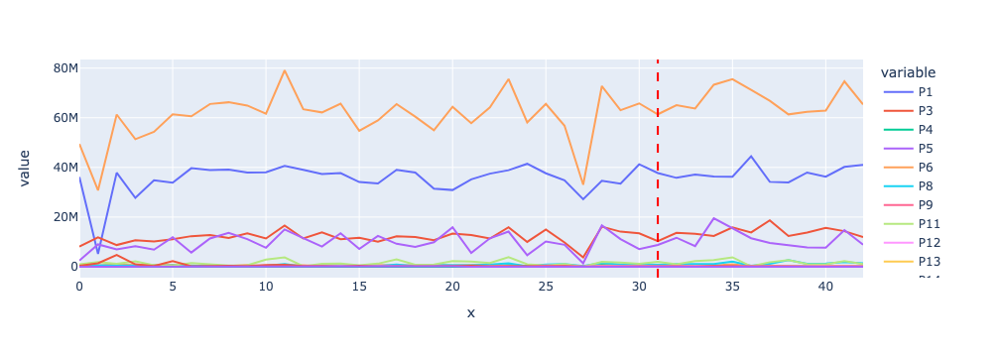

In [420]:
# Creating a lineplot to viasualize the monthly sales development of the different products
fig = px.line(df, x=df.reset_index().index, y=nominal_prod_list)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

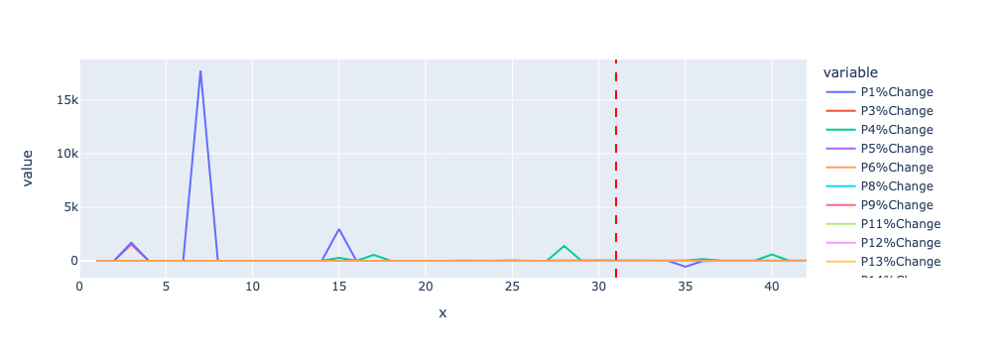

In [421]:
# Creating a lineplot to visualize the monthly percentual sales development of the different products
fig = px.line(df, x=df.reset_index().index, y=percent_change_prod_list)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

In [422]:
df.isna().sum()

P1                  0
P3                  0
P4                  0
P5                  0
P6                  0
P8                  0
P9                  0
P11                 0
P12                 0
P13                 0
P14                 0
P16                 0
P20                 0
P36                 0
Sales_EUR           0
P1%Change           1
P3%Change           1
P4%Change           1
P5%Change           1
P6%Change           1
P8%Change           1
P9%Change           1
P11%Change          1
P12%Change          1
P13%Change          1
P14%Change          1
P16%Change          1
P20%Change          1
P36%Change          1
Sales_EUR%Change    1
dtype: int64

__Notes:__

Nan values are in the first month, due to percentage change calculation.

In [423]:
# Replace empty strings with NaN values in the DataFrame
df.replace("", np.nan, inplace=True)

# Define a list of strange values to replace with NaN in the DataFrame
strange_values = ['!', '$', '%', '?', '*', '+', '_', '@', '€', ' ', '{']

# Replace the strange values with NaN in the DataFrame
df.replace(strange_values, np.nan, inplace=True)

In [424]:
# assuming 'ts' is a pandas series or dataframe with the time series data
result = adfuller(df['Sales_EUR'])

if result[1] <= 0.05:
    print("Sales_EUR is stationary (reject the null hypothesis)")
else:
    print("Sales_EUR Change is not stationary (fail to reject the null hypothesis)")

# printing the test statistic and p-value
print('ADF Statistic:', result[0])

# assuming 'ts' is a pandas series or dataframe with the time series data
result = adfuller(cpi_df['Avg CPI Change'])

if result[1] <= 0.05:
    print("Avg CPI Change is stationary (reject the null hypothesis)")
else:
    print("Avg CPI Change is not stationary (fail to reject the null hypothesis)")

# printing the test statistic and p-value
print('ADF Statistic:', result[0])

# assuming 'ts' is a pandas series or dataframe with the time series data
result = adfuller(rates_df['Avg_IR%Change'])

if result[1] <= 0.05:
    print("Avg_IR%Change is stationary (reject the null hypothesis)")
else:
    print("Avg_IR%Change is not stationary (fail to reject the null hypothesis)")

# printing the test statistic and p-value
print('ADF Statistic:', result[0])

# assuming 'ts' is a pandas series or dataframe with the time series data
result = adfuller(forex_df['Euro area (19 countries) FX%Change'])

if result[1] <= 0.05:
    print("Euro area (19 countries) FX%Change is stationary (reject the null hypothesis)")
else:
    print("Euro area (19 countries) FX%Change (fail to reject the null hypothesis)")

# printing the test statistic and p-value
print('ADF Statistic:', result[0])

# assuming 'ts' is a pandas series or dataframe with the time series data
result = adfuller(bi_df['Avg_BI%Change'])

if result[1] <= 0.05:
    print("Avg_BI is stationary (reject the null hypothesis)")
else:
    print("Avg_BI (fail to reject the null hypothesis)")

# printing the test statistic and p-value
print('ADF Statistic:', result[0])

Sales_EUR is stationary (reject the null hypothesis)
ADF Statistic: -5.329516385633661
Avg CPI Change is stationary (reject the null hypothesis)
ADF Statistic: -4.255967915054074
Avg_IR%Change is stationary (reject the null hypothesis)
ADF Statistic: -3.774410700698066
Euro area (19 countries) FX%Change (fail to reject the null hypothesis)
ADF Statistic: -1.9358342666432897
Avg_BI is stationary (reject the null hypothesis)
ADF Statistic: -4.231206339768281


matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


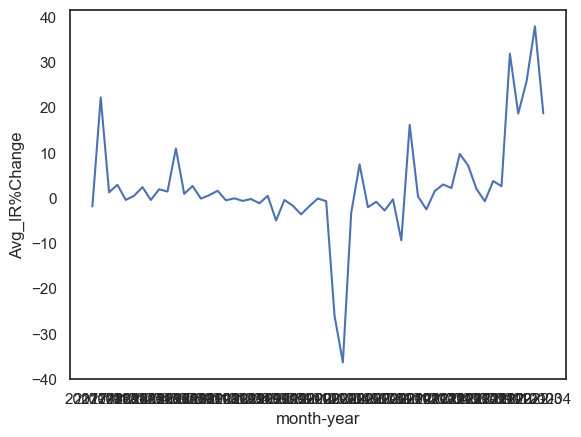

In [425]:
# Creating a lineplot to visualize the monthly mean interest rate change
sns.lineplot(x=rates_df.index, y='Avg_IR%Change', data=rates_df)
plt.show()

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


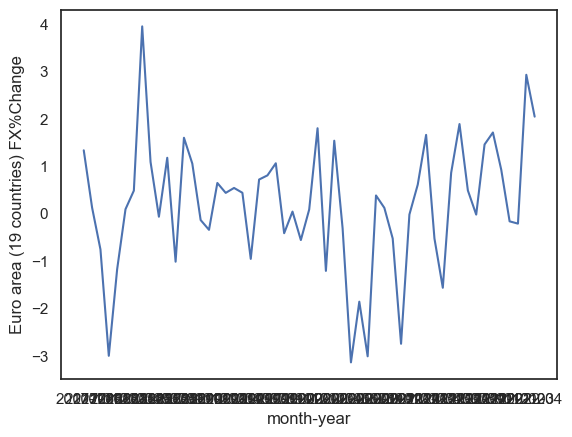

In [426]:
# Creating a lineplot to visualize the monthly forex exchange rate
sns.lineplot(x=forex_df.index, y='Euro area (19 countries) FX%Change', data=forex_df)
plt.show()

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


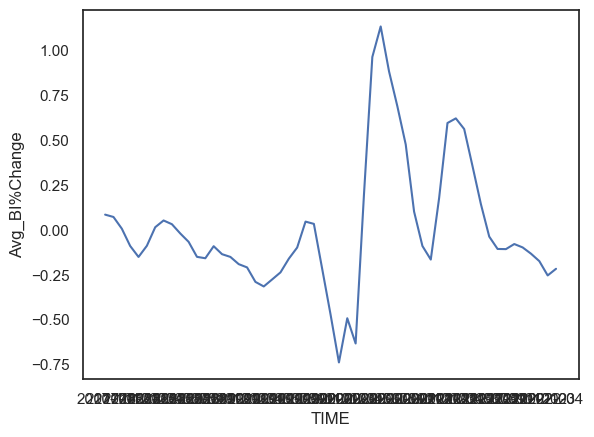

In [427]:
# Creating a lineplot to visualize the monthly mean business confidence change
sns.lineplot(x=bi_df.index, y='Avg_BI%Change', data=bi_df)
plt.show()

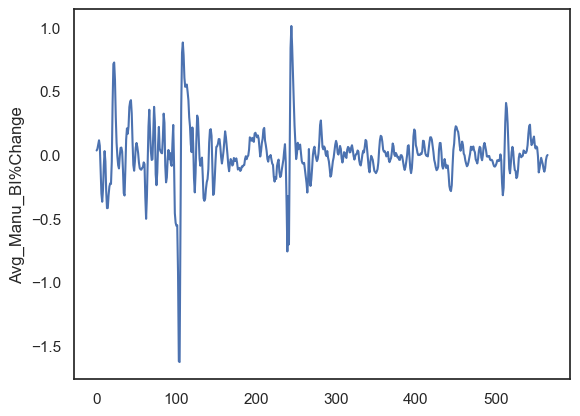

In [428]:
# Creating a lineplot to visualize the monthly mean manufacturing business confidence change
sns.lineplot(x=manu_bi_df_changes.index, y='Avg_Manu_BI%Change', data=manu_bi_df_changes)
plt.show()

<a class="anchor" id="2.3">

## Exploring Data

Analyzing the descriptive statistics of the dataset such as mean, median, mode, standard deviation, aswell as the underlying datatypes of the variables and the associated distributions of values in order to gain insights into the nature of the data, identify errors and anomalies, and choose appropriate analytical techniques for further analysis.

In [429]:
# Get insughts about the columns
df.describe().T[:14]

,count,mean,std,min,25%,50%,75%,max
P1,43.00,35911767.37,5905116.65,5140760.00,34408959.20,37323903.07,38888667.25,44483013.86
P3,43.00,12405662.50,2577331.85,3804319.74,11059074.07,12317479.75,13775667.65,18686819.85
P4,43.00,363423.37,155710.91,93226.32,279799.48,329430.96,428161.15,829442.33
P5,43.00,9990585.07,3731564.50,1405295.36,7703431.94,9232237.68,11800771.33,19524640.52
P6,43.00,480043.96,242286.22,-15202.96,316055.49,499147.73,611987.12,999472.69
P8,43.00,810958.60,543611.10,111791.34,374937.86,599831.93,1092309.89,2655036.78
P9,43.00,7173.17,8231.27,-4358.10,1626.70,4488.09,9583.20,39510.75
P11,43.00,1532588.71,981159.83,18200.00,903599.21,1226122.00,2161183.73,3891447.76
P12,43.00,192546.19,141016.79,1070.00,39235.21,172712.88,321795.05,445648.06
P13,43.00,23468.77,16140.16,2550.31,10466.47,20663.64,30966.41,68180.00


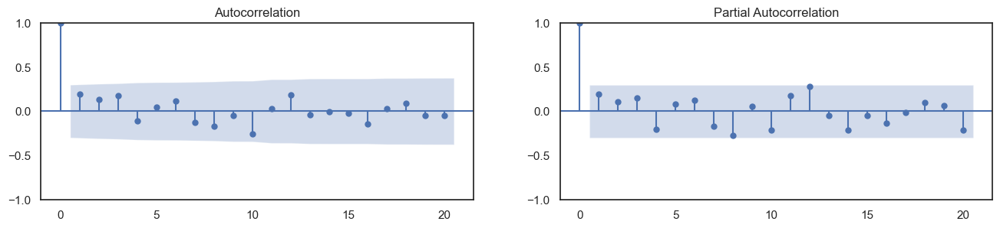

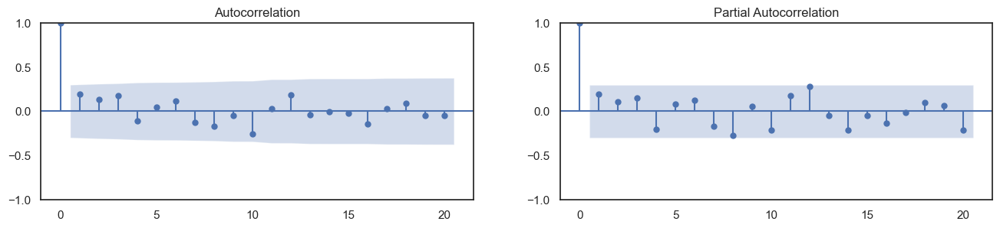

In [430]:
# Draw Plot to show autocorrelation and partial autocorrelation
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(df['Sales_EUR'].tolist(), lags=20, ax=axes[0])
plot_pacf(df['Sales_EUR'].tolist(), lags=20, ax=axes[1])

In [431]:
# Get insights about the columns
supply_df.describe()

,CN_PI_ME,CN_SI_ME,FR_PI_ME,FR_SI_ME,DE_PI_ME,DE_SI_ME,IT_PI_ME,IT_SI_ME,JP_PI_ME,JP_SI_ME,CH_PI_ME,CH_SI_ME,UK_PI_ME,UK_SI_ME,US_PI_ME,...,PI_W_MEN_PC,PI_CH_MEN_PC,PI_UK_MEN_PC,PI_IT_MEN_PC,PI_JP_MEN_PC,PI_FR_MEN_PC,PI_DE_MEN_PC,PI_US_EE_PC,PI_W_EE_PC,PI_CH_EE_PC,PI_UK_EE_PC,PI_IT_EE_PC,PI_JP_EE_PC,PI_FR_EE_PC,PI_DE_EE_PC
count,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,54.00,54.00,55.00,37.00,55.00,...,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00
mean,237.31,237.31,92.67,110.71,110.84,128.73,100.31,113.58,115.82,117.07,98.35,94.80,103.93,100.68,107.51,...,0.50,-0.02,0.56,3.80,1.01,2.29,0.69,0.09,0.49,-0.03,0.57,4.66,0.97,1.35,0.32
std,43.13,43.13,13.05,13.75,10.79,12.87,17.36,20.30,14.01,14.88,8.25,7.81,11.18,12.63,5.32,...,9.93,2.79,14.16,29.43,15.51,24.05,14.83,2.35,8.79,5.12,11.12,32.90,15.95,18.61,10.59
min,130.00,130.00,51.00,64.00,81.00,93.00,51.00,55.00,82.00,81.00,78.00,75.00,61.00,57.00,91.00,...,-20.80,-6.00,-45.26,-50.00,-26.32,-38.14,-30.77,-8.41,-18.25,-8.24,-39.06,-52.69,-29.69,-34.78,-23.08
25%,213.50,213.50,89.50,104.50,104.00,121.00,94.50,102.00,106.00,107.00,93.25,90.25,99.00,98.00,105.00,...,-6.50,-1.98,-6.73,-11.30,-11.85,-9.54,-10.31,-0.96,-6.32,-4.57,-5.36,-12.72,-11.62,-8.95,-6.10
50%,238.00,238.00,94.00,113.00,112.00,129.00,105.00,120.00,116.00,116.00,98.00,94.50,104.00,103.00,108.00,...,0.00,0.00,0.00,2.56,0.00,-2.02,4.35,0.00,0.00,0.00,0.81,2.13,0.89,-1.12,0.93
75%,262.50,262.50,101.00,118.00,117.00,138.00,112.00,127.00,123.00,124.00,104.00,100.75,110.50,108.00,111.00,...,5.61,2.12,5.20,10.03,9.10,8.61,10.31,1.40,3.77,3.88,6.23,12.71,9.64,7.27,8.91
max,329.00,329.00,112.00,137.00,131.00,151.00,125.00,154.00,154.00,159.00,115.00,111.00,125.00,119.00,118.00,...,23.28,4.04,38.33,87.10,29.03,67.69,27.59,8.00,21.67,8.97,26.74,100.00,31.07,48.28,20.48


In [432]:
# Get insughts about the columns
rates_df.describe()

,Brazil IR,China IR,Euro area (19 countries) IR,India IR,United Kingdom IR,United States IR,Brazil IR%Change,China IR%Change,Euro area (19 countries) IR%Change,India IR%Change,United Kingdom IR%Change,United States IR%Change,Avg_IR%Change
count,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00
mean,5.53,2.90,-0.43,5.26,0.38,1.05,1.04,0.00,0.95,0.09,7.05,3.17,2.46
std,2.38,0.00,0.07,1.08,0.29,0.94,9.18,0.00,3.63,13.87,34.13,29.11,11.23
min,2.00,2.90,-0.58,2.25,0.05,0.05,-16.36,0.00,-2.78,-47.06,-79.35,-92.31,-36.36
25%,3.75,2.90,-0.48,4.25,0.05,0.08,-2.52,0.00,-0.22,0.00,-0.46,-0.21,-0.79
50%,6.50,2.90,-0.45,5.40,0.45,1.16,0.00,0.00,0.25,0.00,0.06,0.00,0.47
75%,6.50,2.90,-0.36,6.25,0.70,1.91,1.97,0.00,0.87,0.00,0.51,5.34,2.78
max,11.75,2.90,-0.34,6.75,0.71,2.42,23.64,0.00,17.73,88.89,143.80,150.00,37.94


In [433]:
# Get insughts about the columns
bi_df.describe()

,BRA BI,CHN BI,EA19,GBR BI,IND BI,OECD,RUS BI,USA BI,BRA BI%Change,CHN BI%Change,EA19 BI%Change,GBR BI%Change,IND BI%Change,OECD BI%Change,RUS BI%Change,USA BI%Change,Avg_BI%Change
count,55.00,55.00,55.00,55.00,55.00,55.00,52.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00
mean,100.23,98.64,101.01,101.00,98.97,100.49,101.59,100.62,0.01,-0.05,0.00,0.02,0.07,-0.00,0.05,-0.01,0.01
std,1.47,1.11,1.98,3.06,3.58,1.32,1.47,1.07,0.67,0.59,0.47,0.71,0.88,0.33,0.32,0.25,0.37
min,95.03,94.04,95.69,93.87,90.78,96.76,98.13,98.15,-2.47,-1.76,-1.76,-2.10,-1.81,-1.14,-0.78,-0.46,-0.74
25%,99.85,98.11,99.69,98.55,96.98,99.59,100.88,99.89,-0.17,-0.25,-0.19,-0.36,-0.46,-0.13,-0.14,-0.19,-0.17
50%,100.16,98.63,101.52,101.67,99.38,100.85,101.37,101.14,-0.01,-0.09,-0.05,-0.04,-0.04,-0.03,0.04,-0.09,-0.09
75%,101.04,99.46,102.54,103.11,99.80,101.49,102.12,101.41,0.15,0.12,0.20,0.28,0.18,0.10,0.24,0.10,0.08
max,102.79,100.00,103.60,105.59,105.39,102.09,104.39,102.00,2.02,2.42,1.19,1.86,2.44,0.90,0.95,0.88,1.13


In [434]:
# Get insughts about the columns
manu_bi_df.describe()

,EU19_Manu_BI,China_Manu_BI,US_Manu_BI,Brazi_Manu_BI,EU19_Manu_BI %Change,China_Manu_BI %Change,US_Manu_BI %Change,Brazi_Manu_BI %Change,Avg_Manu_BI%Change
count,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00,55.00
mean,101.01,98.65,100.62,100.23,0.00,-0.05,-0.01,0.01,-0.01
std,1.98,1.10,1.07,1.46,0.47,0.58,0.25,0.67,0.30
min,95.69,94.11,98.14,95.03,-1.76,-1.74,-0.46,-2.47,-0.76
25%,99.69,98.13,99.89,99.85,-0.19,-0.25,-0.19,-0.17,-0.15
50%,101.53,98.65,101.14,100.15,-0.05,-0.09,-0.09,-0.01,-0.05
75%,102.54,99.46,101.40,101.04,0.20,0.11,0.10,0.15,0.05
max,103.60,100.00,102.00,102.79,1.19,2.39,0.88,2.01,1.01


In [435]:
# Get insughts about the columns
us_exc_df.describe()

,US_MNO,US_TCSM,US_MNO BI%Change,US_TCSM BI%Change
count,253.00,253.00,253.00,253.00
mean,2734.72,4715.22,2.56,0.86
std,748.09,2087.29,23.43,6.47
min,681.00,1508.00,-44.78,-20.38
25%,2281.00,2864.00,-9.07,-2.75
50%,2801.00,4528.00,0.69,1.05
75%,3175.00,6283.00,9.56,4.79
max,5669.00,11882.00,168.80,20.74


<a class="anchor" id="2.4">

## Data Relationships

Analyzing the relationships in form of correlations between the different variables. This correlation analysis enables us to identify patterns and dependencies between different variables

In [436]:
# Creating a list of columns that have 'ME_' in their name and adding it to the 'machinery_and_electricals' list
machinery_and_electricals = [column for column in list(final_df.columns) if 'ME_' in column]

# Creating a list of columns that have 'MEN_' in their name and adding it to the 'machinery_and_electricals' list
machinery_and_electricals.extend([column for column in list(final_df.columns) if 'MEN_' in column])

# Creating a list of columns that have 'EE_' in their name and assigning it to the 'electrical_equipment' list
electrical_equipment = [column for column in list(final_df.columns) if 'EE_' in column]

# Creating a list of columns that are not in the 'machinery_and_electricals' list or the 'electrical_equipment' list and assigning it to the 'rest_of_final_df' list
rest_of_final_df = [column for column in final_df.columns if column not in electrical_equipment and column not in machinery_and_electricals]


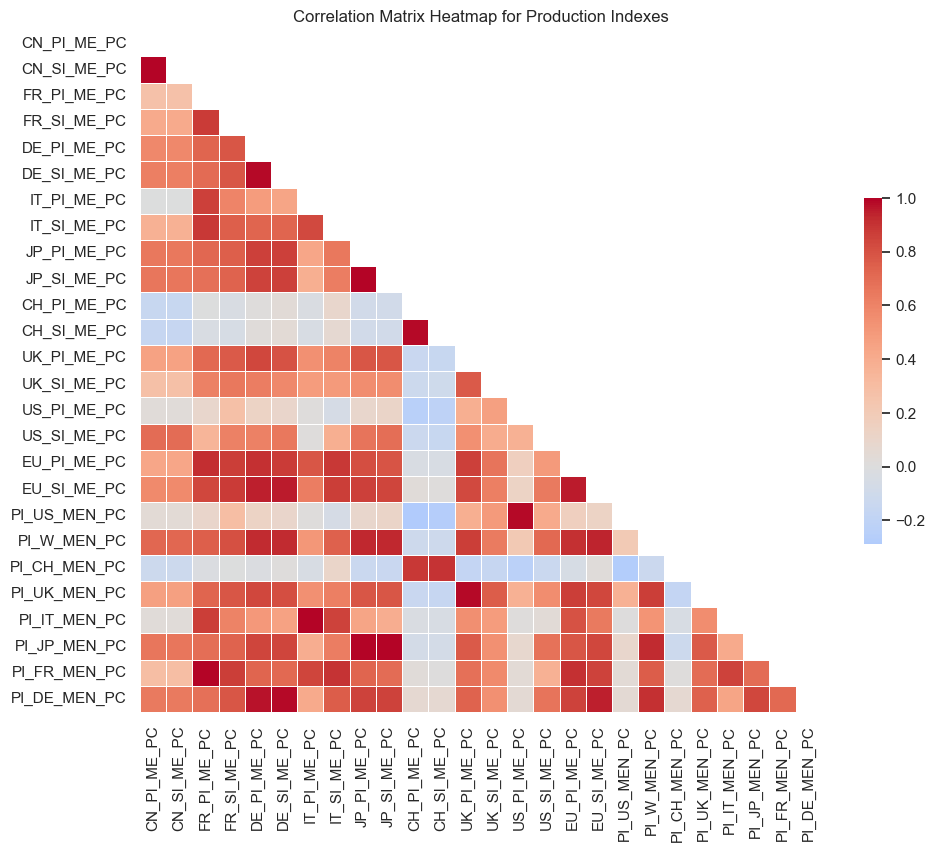

In [437]:
# Create a correlation matrix
corr_matrix = final_df[machinery_and_electricals].corr()

# Filter the correlation matrix to only show variables with correlation above 0.75 or below -0.75
high_corr_vars = corr_matrix[(corr_matrix > 0.75) | (corr_matrix < -0.75)]

# Generate heatmap
sns.set(style='white')
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Correlation Matrix Heatmap for Production Indexes')
plt.show()

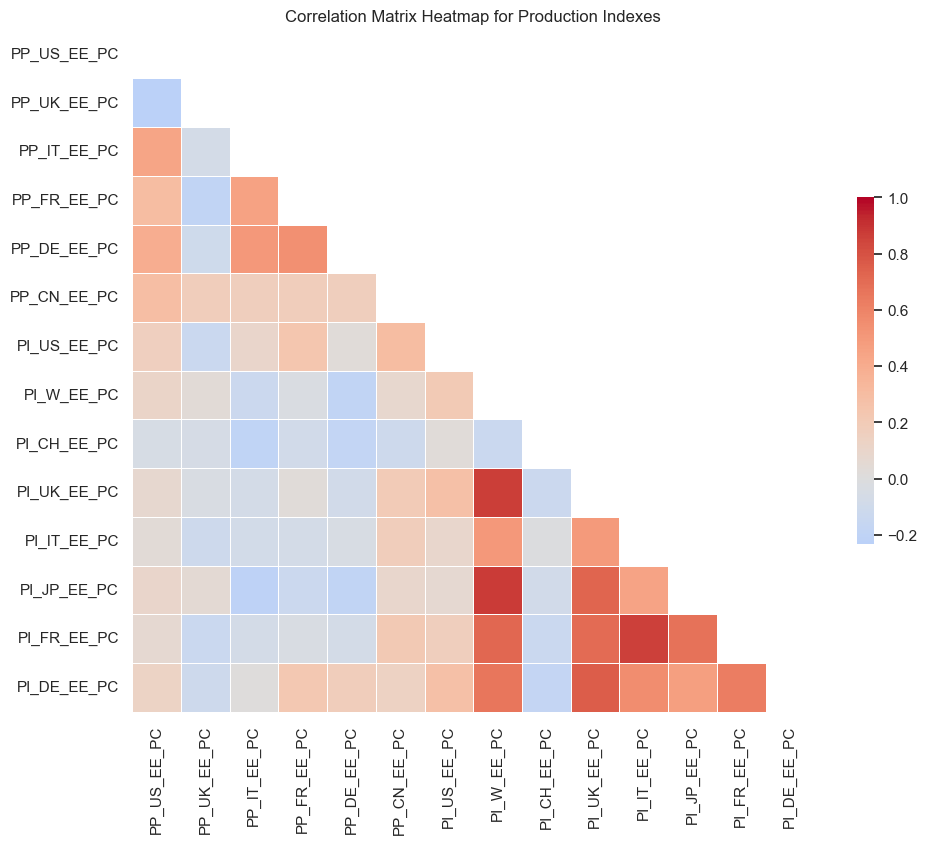

In [438]:
# Create a correlation matrix
corr_matrix = final_df[electrical_equipment].corr()

# Filter the correlation matrix to only show variables with correlation above 0.75 or below -0.75
high_corr_vars = corr_matrix[(corr_matrix > 0.75) | (corr_matrix < -0.75)]

# Generate heatmap
sns.set(style='white')
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Correlation Matrix Heatmap for Production Indexes')
plt.show()

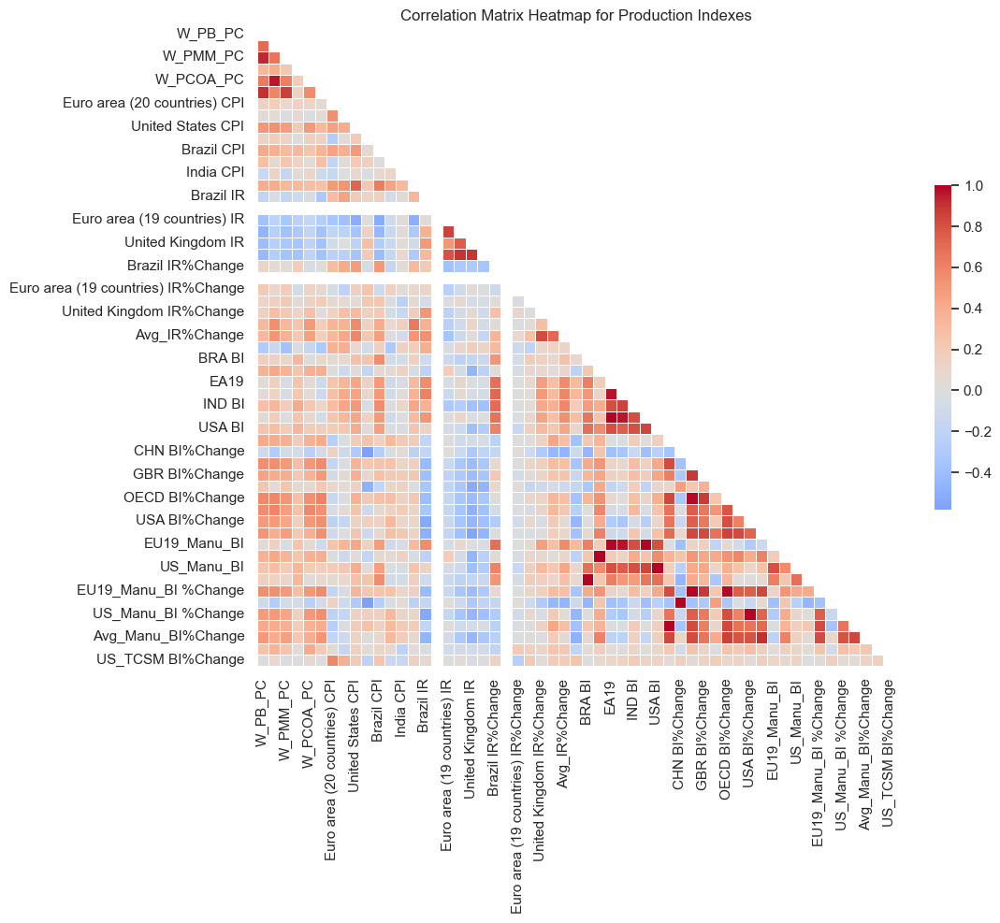

In [439]:
# Create a correlation matrix
corr_matrix = final_df[rest_of_final_df].corr()

# Filter the correlation matrix to only show variables with correlation above 0.75 or below -0.75
high_corr_vars = corr_matrix[(corr_matrix > 0.75) | (corr_matrix < -0.75)]

# Generate heatmap
sns.set(style='white')
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Correlation Matrix Heatmap for Production Indexes')
plt.show()

In [440]:
# define the estimator model for RFE
estimator = LinearRegression()

# define the number of features to select
n_features = len(final_df.columns)

# create the RFE object
rfe = RFE(estimator) 

# fit RFE on the data
rfe.fit(final_df['2018-11':'2022-04'], df['Sales_EUR'][1:])

# get the selected features
selected_features = final_df.columns[rfe.support_]

# get the ranking of features
feature_ranking = rfe.ranking_

# create a dataframe of selected features and their rankings
feature_rank_df = pd.DataFrame({'feature': final_df.columns, 'rank': feature_ranking})

# sort the dataframe by feature ranking in ascending order
feature_rank_df.sort_values('rank',inplace=True)
to_remove = list(feature_rank_df[feature_rank_df['rank'] > 1]['feature'])
feature_rank_df[feature_rank_df['rank'] == 1]

,feature,rank
47,United Kingdom CPI,1
32,PI_CH_MEN_PC,1
33,PI_UK_MEN_PC,1
34,PI_IT_MEN_PC,1
35,PI_JP_MEN_PC,1
36,PI_FR_MEN_PC,1
39,PI_W_EE_PC,1
40,PI_CH_EE_PC,1
43,PI_JP_EE_PC,1
45,PI_DE_EE_PC,1


__Notes:__

What is meant by mutual information?
Mutual information is a quantity that measures a relationship between two random variables that are sampled simultaneously. In particular, it measures how much information is communicated, on average, in one random variable about another.

In [441]:
# Set the target index range
target_index_range =  df['Sales_EUR'][1:].index

mi_scores = []

# Calculate the mutual information score for each lag
for feature in final_df.columns:
    
    # Calculate the mutual information score
    mi_score = mutual_info_regression(final_df[[feature]]['2018-11':'2022-04'], df['Sales_EUR'][1:], random_state=42)
    mi_scores.append(float(mi_score))
    
mi_df = pd.DataFrame({'feature': final_df.columns, 'mi_score': mi_scores})
mi_df.set_index('feature', inplace=True)

threshold = 0.15

possible_mi_removal = mi_df[mi_df['mi_score'] <= threshold ].index

print('Based on the mutual information score we could remove features below the',threshold,'treshold. It would remove',len(possible_mi_removal),'features, leaving',
      len(final_df.columns) - len(possible_mi_removal),'to work with.')

#final_df.drop(possible_mi_removal, axis=1, inplace=True)

mi_df = mi_df[mi_df['mi_score']>= threshold].sort_values('mi_score',ascending=False)
mi_df

Based on the mutual information score we could removed features below the 0.15 would remove 89 features, leaving 6 to work with


,mi_score
feature,
US_MNO BI%Change,0.25
United States IR%Change,0.19
PI_US_MEN_PC,0.18
US_PI_ME_PC,0.18
PI_CH_EE_PC,0.17
CH_SI_ME_PC,0.15


<a class="anchor" id="3">

# <font color='SeaGreen'> Data Preperation </font>

<font color='SeaGreen'> __Cleanse, transform, and format the data to prepare it for analysis. This may involve data cleaning, feature engineering, and data integration.__

<a class="anchor" id="3.1">

## Data Cleaning

Cleaning the data by removing the outliers, dropping duplicates etc. Outliers are observations in a dataset that deviate significantly from other observations. In this case, outliers are in a practical case what we call anomalies and missing values are not an issue as we made sure that all columns in final_df are in the same frequency and rime range.

In [442]:
# Counting the number of NaN values in each column of the 'final_df' DataFrame and assigning the result to the 'nan_values' Series
nan_values = final_df.isna().sum()

# Selecting only the columns in 'nan_values' that have at least one NaN value and displaying the result
nan_values[nan_values > 0]


Series([], dtype: int64)

In [443]:
# Find columns with no variation
no_variation_cols = []
for col in final_df.columns:
    if final_df[col].nunique() == 1:
        print(col)
        no_variation_cols.append(col)

# Drop columns with no variation
final_df.drop(no_variation_cols, axis=1, inplace=True)

# Print amount of columns removed
print(f"{len(no_variation_cols)} columns with no variation have been removed.")

China IR
China IR%Change
2 columns with no variation have been removed.


### Removing anomalies

P1

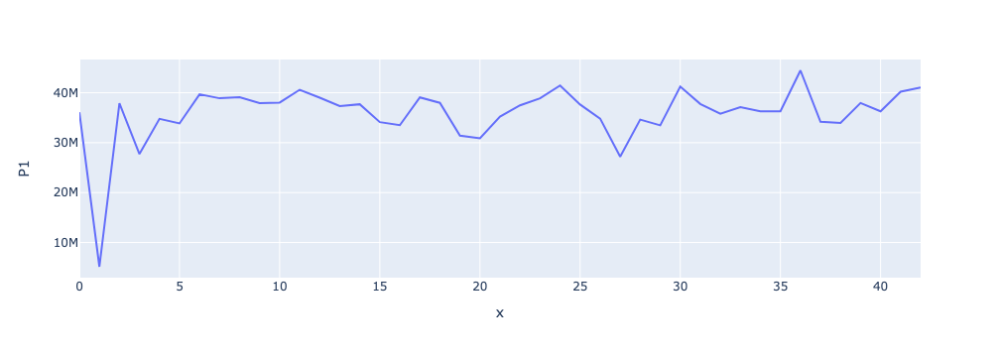

In [444]:
# Creating a lineplot for P1 to show sales evolution
fig = px.line(df['P1'], x=df.reset_index().index, y='P1')
fig.update_layout(shapes=[
    #dict(type='line', x0=0, x1=len(df), y0=0, y1=0),
    #dict(type='line', x0=0, x1=len(df), y0=-0.30, y1=-0.30)
])
fig.show()

__Notes:__

Apart from the bottom spike at x = 1, there are no anomalies, models should be trained from X = 2

In [445]:
# Set a range to remove anomalies
df.loc[df['P1'] < 30000000, 'P1'] = 30000000

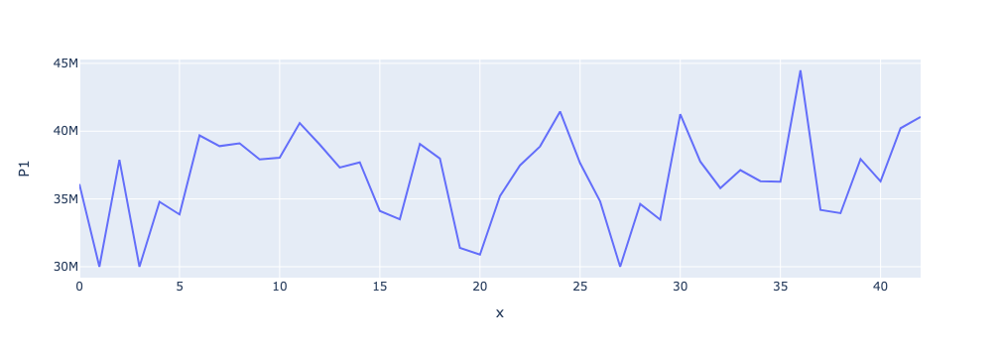

In [446]:
# Creating a updated lineplot for P1 to show sales evolution

fig = px.line(df['P1'], x=df.reset_index().index, y='P1')
fig.update_layout(shapes=[
    #dict(type='line', x0=0, x1=len(df), y0=0, y1=0),
    #dict(type='line', x0=0, x1=len(df), y0=-0.30, y1=-0.30)
])
fig.show()

P3

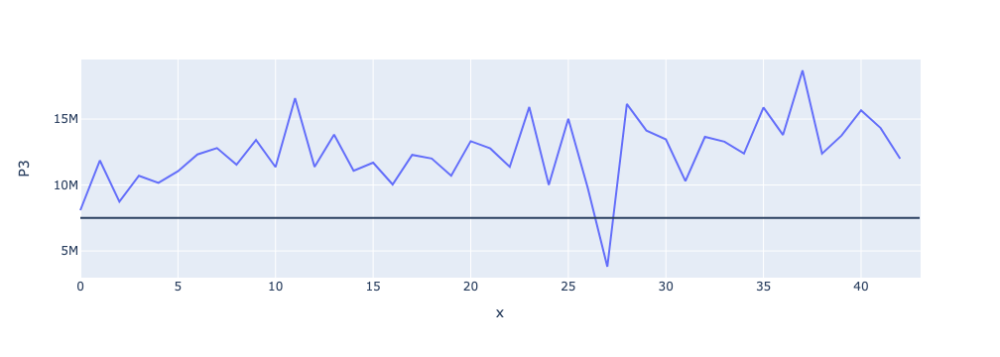

In [447]:
# Creating a lineplot for P3 to show sales evolution
fig = px.line(df['P3'], x=df.reset_index().index, y='P3')
fig.update_layout(shapes=[
    dict(type='line', x0=0, x1=len(df), y0=7500000, y1=7500000),
    #dict(type='line', x0=0, x1=len(df), y0=-0.35, y1=-0.35)
])
fig.show()

In [448]:
# Set a range to remove anomalies
df.loc[df['P3'] <= 7500000, 'P3'] = 11000000

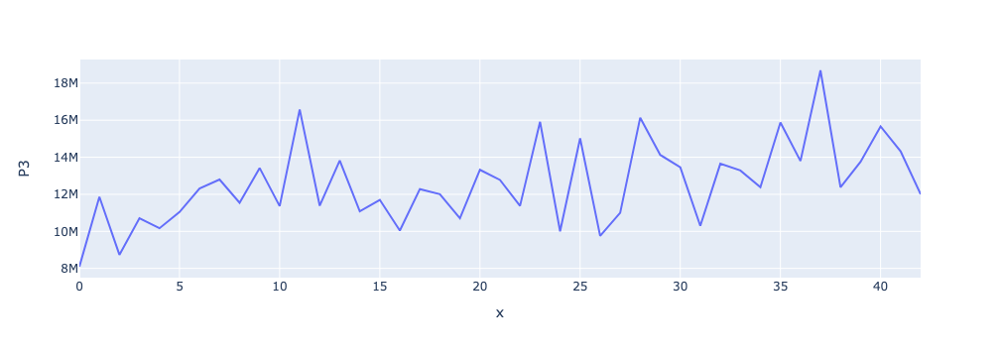

In [449]:
# Creating a updated lineplot for P3 to show sales evolution
fig = px.line(df['P3'], x=df.reset_index().index, y='P3')
fig.update_layout(shapes=[

])
fig.show()

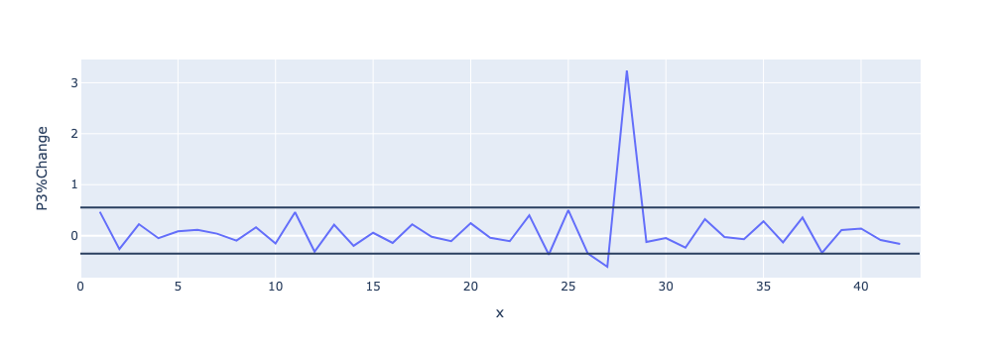

In [450]:
# Creating a lineplot for monthly percentage change for P3
fig = px.line(df['P3%Change'], x=df.reset_index().index, y='P3%Change')
fig.update_layout(shapes=[
    dict(type='line', x0=0, x1=len(df), y0=0.55, y1=0.55),
    dict(type='line', x0=0, x1=len(df), y0=-0.35, y1=-0.35)
])
fig.show()

In [451]:
# Selecting the rows of the 'df' DataFrame where the value in the 'P3%Change' column is greater than 0.50, and then selecting only the 'P3%Change' column
df[df['P3%Change']>0.50]['P3%Change']

month_year
2020-11   0.50
2021-02   3.24
Freq: M, Name: P3%Change, dtype: float64

In [452]:
# Clipping the values in the 'P3%Change' column of the 'df' DataFrame to a maximum value of 0.50 using the '.clip()' method with the 'upper' parameter set to 0.50
df['P3%Change'] = df['P3%Change'].clip(upper=0.50)


In [453]:
# Selecting the rows of the 'df' DataFrame where the value in the 'P3%Change' column is less than -0.50, and then selecting only the 'P3%Change' column
df[df['P3%Change']<-0.50]['P3%Change']


month_year
2021-01   -0.61
Freq: M, Name: P3%Change, dtype: float64

In [454]:
# Replacing the values in the 'P3%Change' column of the 'df' DataFrame that are less than -0.35

df.loc[df['P3%Change'] < -0.35, 'P3%Change'] = -0.35


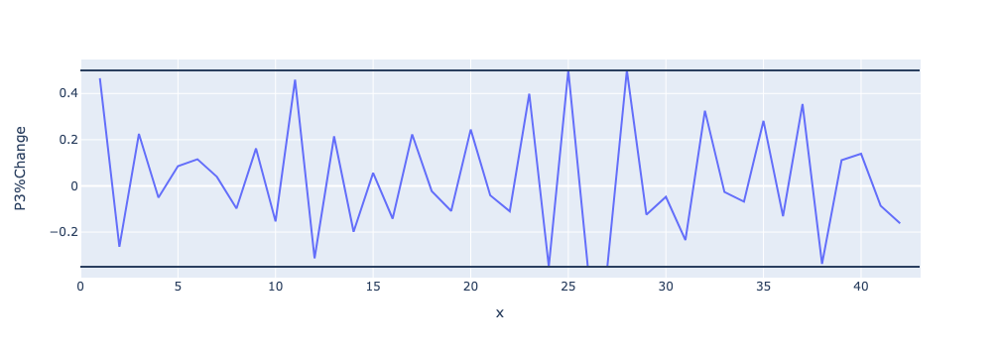

In [455]:
# Creating a updated lineplot for monthly percentage change for P3
fig = px.line(df['P3%Change'], x=df.reset_index().index, y='P3%Change')
fig.update_layout(shapes=[
    dict(type='line', x0=0, x1=len(df), y0=0.50, y1=0.50),
    dict(type='line', x0=0, x1=len(df), y0=-0.35, y1=-0.35)
])
fig.show()

P4

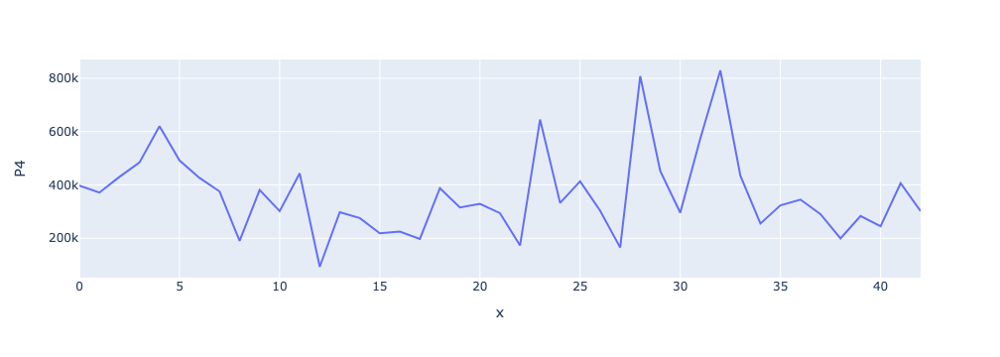

In [456]:
# Creating a lineplot for P4 to show sales evolution
fig = px.line(df['P4'], x=df.reset_index().index, y='P4')
fig.show()

__Notes:__

No anomalies detected.

P5

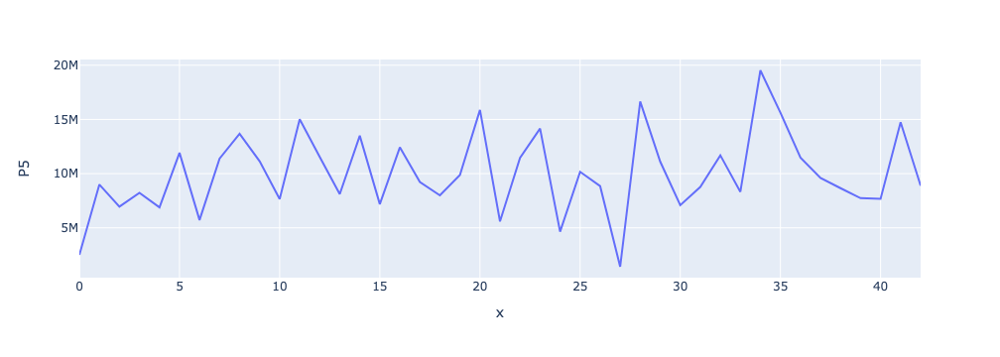

In [457]:
# Creating a lineplot for P5 to show sales evolution
fig = px.line(df['P5'], x=df.reset_index().index, y='P5')
fig.update_layout(shapes=[
#    dict(type='line', x0=0, x1=len(df), y0=1.35, y1=1.35,)
])
fig.show()


__Notes:__

No anomalies detected apart from the covid low, which we decided to change to the lowest data point, located at x=0.

P6

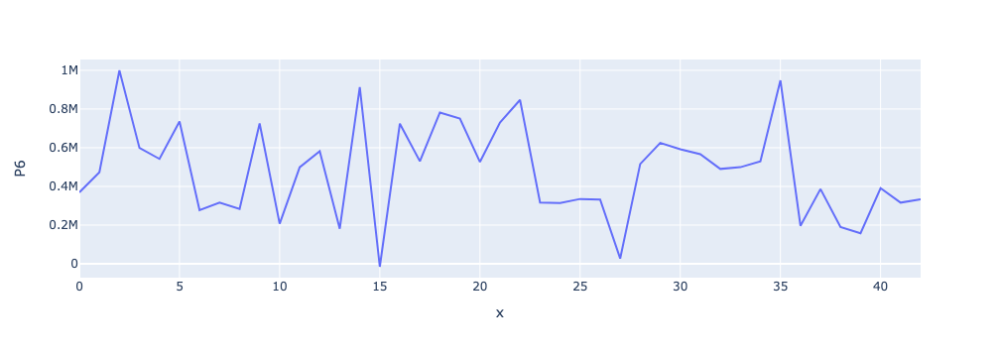

In [458]:
# Creating a lineplot for P6 to show sales evolution
fig = px.line(df['P6'], x=df.reset_index().index, y='P6')
fig.update_layout(shapes=[
   #dict(type='line', x0=0, x1=len(df), y0=4.05, y1=4.05),
   #dict(type='line', x0=0, x1=len(df), y0=-1.05, y1=-1.05)
])
fig.show()

__Notes:__

Looking at https://www.bsg.ox.ac.uk/research/covid-19-government-response-tracker We conclude that sales went flat, with one bottom due to COVID, although we don't identify any possible changes to be made.

P8

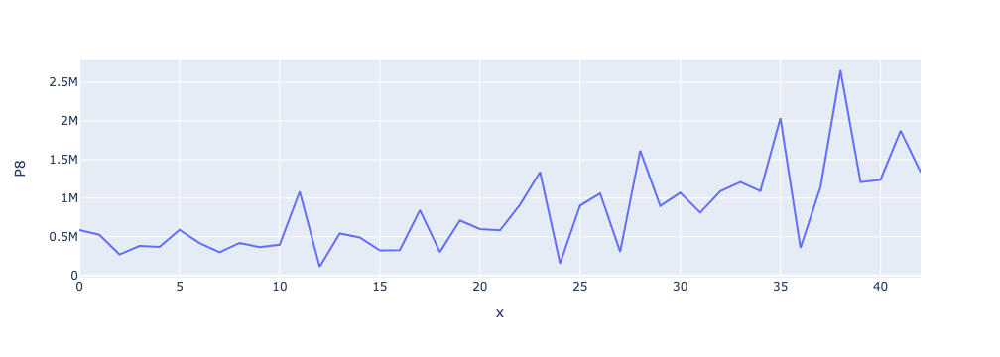

In [459]:
# Creating a lineplot for P8 to show sales evolution
fig = px.line(df['P8'], x=df.reset_index().index, y='P8')
fig.update_layout(shapes=[
])
fig.show()

__Notes:__

No anomalies significant enough to change

P9

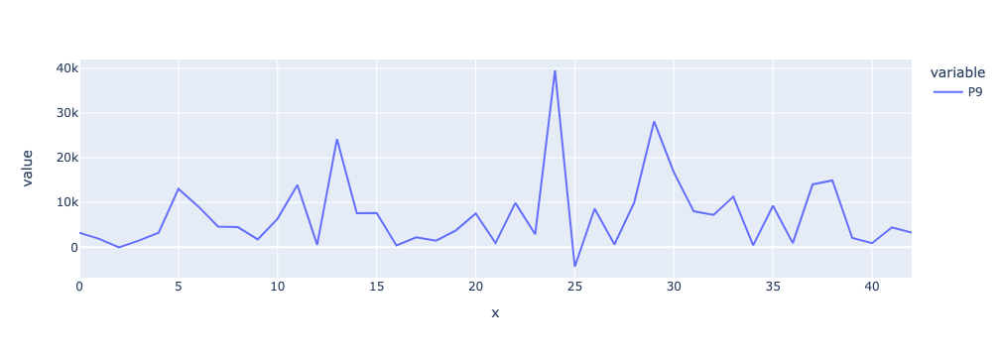

In [460]:
# Creating a lineplot for P9 to show sales evolution
fig = px.line(df, x=df.reset_index().index, y=['P9'])
fig.update_layout(shapes=[
])
fig.show()

__Notes:__


No anomalies detected.

P11

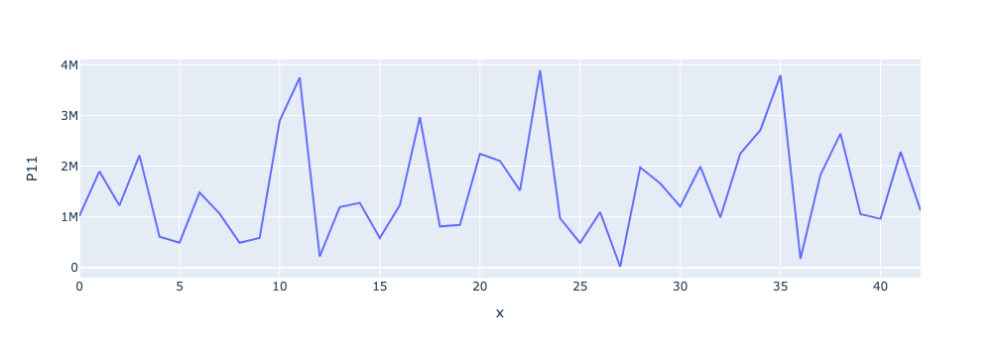

In [461]:
# Creating a lineplot for P11 to show sales evolution
fig = px.line(df['P11'], x=df.reset_index().index, y='P11')
fig.update_layout(shapes=[
])
fig.show()

__Notes:__


No anomalies detected.

P12

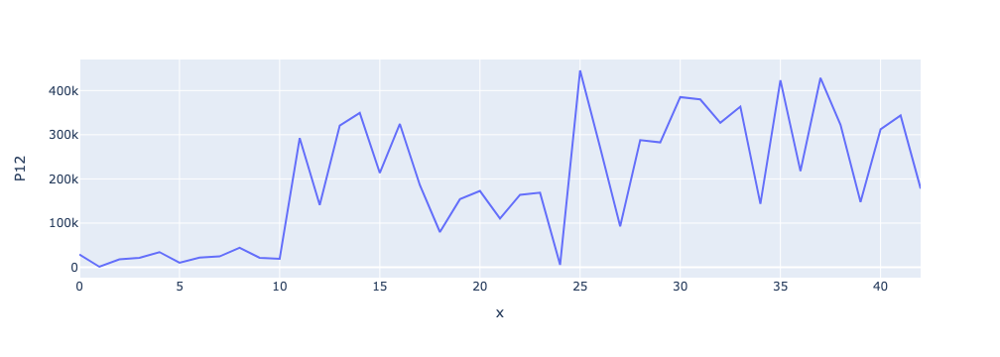

In [462]:
# Creating a lineplot for P12 to show sales evolution
fig = px.line(df['P12'], x=df.reset_index().index, y='P12')
fig.update_layout(shapes=[
])
fig.show()

__Notes:__

We believe, that the are no anomalities, although we will train the model from X = 10.

P13

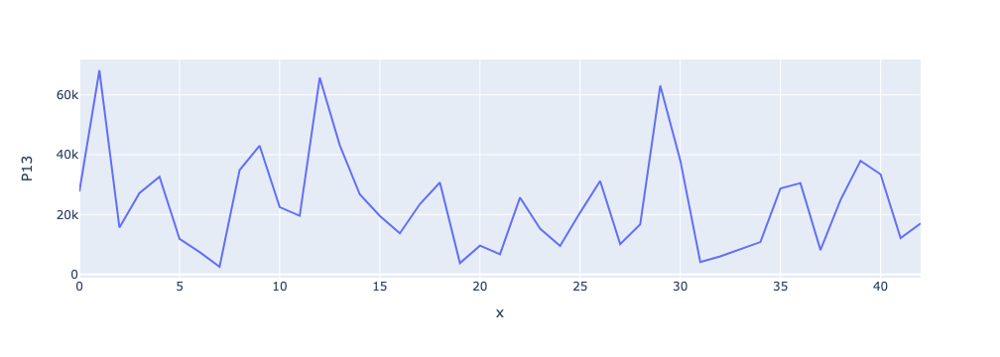

In [463]:
# Creating a lineplot for P13 to show sales evolution
fig = px.line(df['P13'], x=df.reset_index().index, y='P13')
fig.update_layout(shapes=[
])
fig.show()

__Notes:__

Not an anomality significant enough to clip.

P14

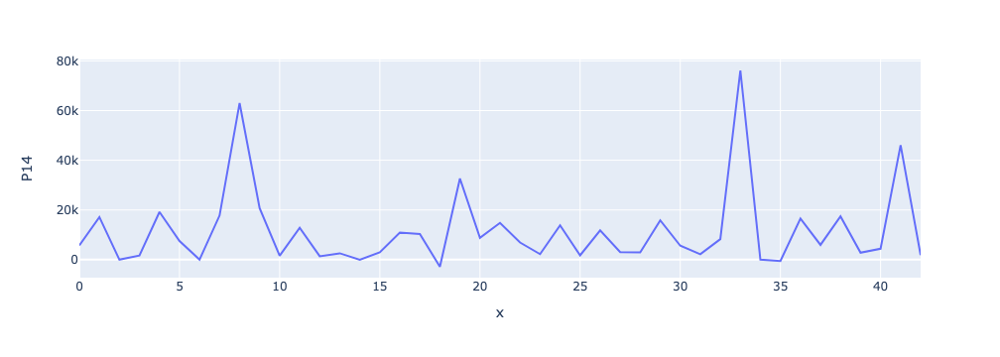

In [464]:
# Creating a lineplot for P14 to show sales evolution
fig = px.line(df['P14'], x=df.reset_index().index, y='P14')
fig.update_layout(shapes=[
])
fig.show()

In [465]:
# Set a range to remove anomalies
df.loc[df['P14'] > 50000, 'P14'] = 50000

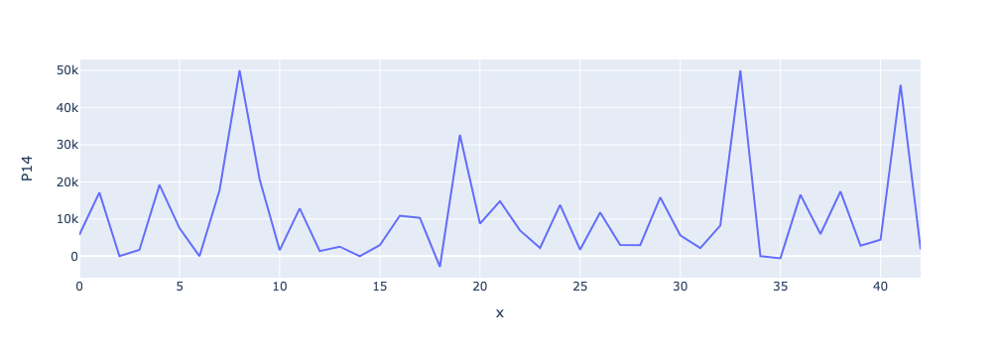

In [466]:
# Creating a updated lineplot for P14 to show sales evolution
fig = px.line(df['P14'], x=df.reset_index().index, y='P14')
fig.update_layout(shapes=[
])
fig.show()

P16

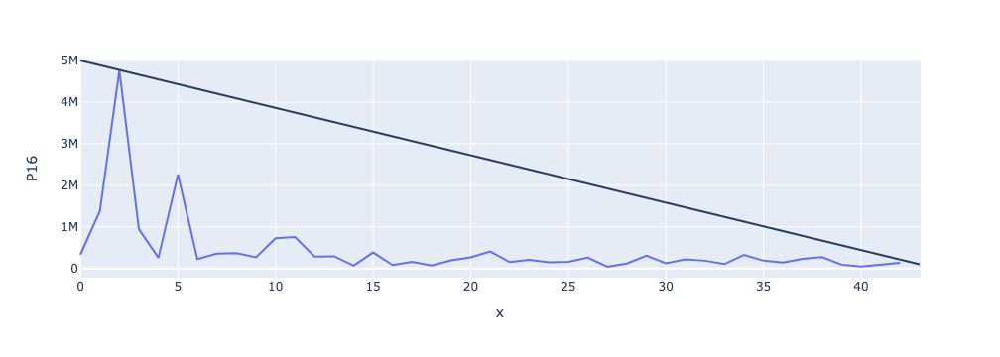

In [467]:
# Creating a lineplot for P16 to show sales evolution
fig = px.line(df['P16'], x=df.reset_index().index, y='P16')
fig.update_layout(shapes=[
    dict(type='line', x0=0, x1=len(df), y0=5000000, y1=100000)
])
fig.show()

__Notes:__

Clear downtrend for product sales, we will train the model from X = 9

P20

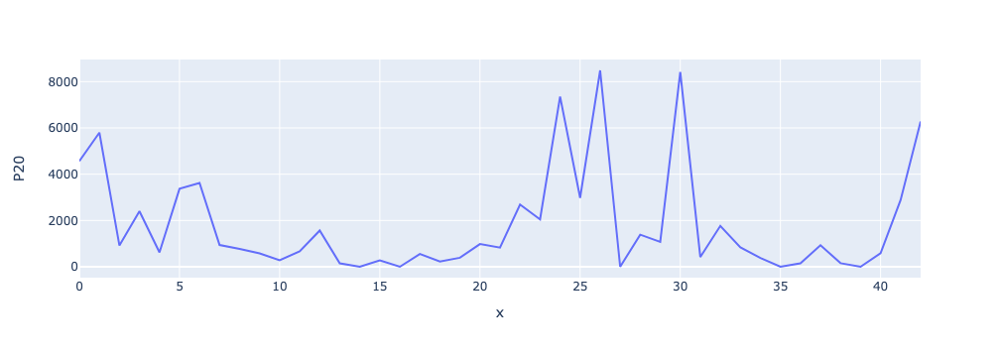

In [ ]:
# Creating a lineplot for P20 to show sales evolution
fig = px.line(df['P20'], x=df.reset_index().index, y='P20')
fig.update_layout(shapes=[
])
fig.show()

P36

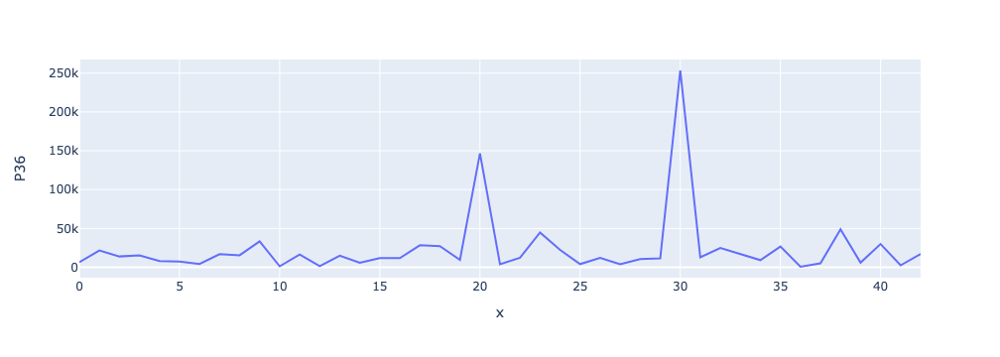

In [469]:
# Creating a lineplot for P36 to show sales evolution
fig = px.line(df['P36'], x=df.reset_index().index, y='P36')
fig.update_layout(shapes=[
    #dict(type='line', x0=0, x1=len(df), y0=6, y1=27)
])
fig.show()

__Notes:__

Spikes that have an uptrend pre-covid, we will need to be observed, on wether or not we need to readjust the values for the spikes.

After modelling we came back to remove, what we thought were acceptable spikes. We're gonna try to reduce them to see if they help the model in a overall way.

In [470]:
# Set a range to remove anomalies
df.loc[df['P36'] > 35000, 'P36'] = 35000

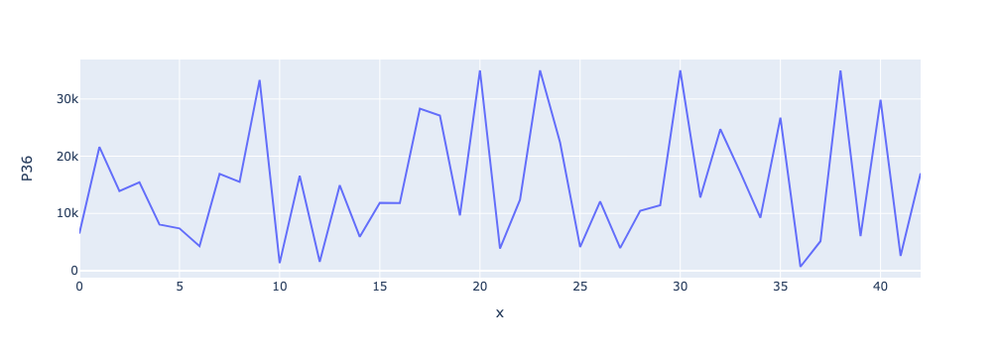

In [471]:
# Creating a updated lineplot for P36 to show sales evolution
fig = px.line(df['P36'], x=df.reset_index().index, y='P36')
fig.update_layout(shapes=[
    #dict(type='line', x0=0, x1=len(df), y0=6, y1=27)
])
fig.show()

Total Sales

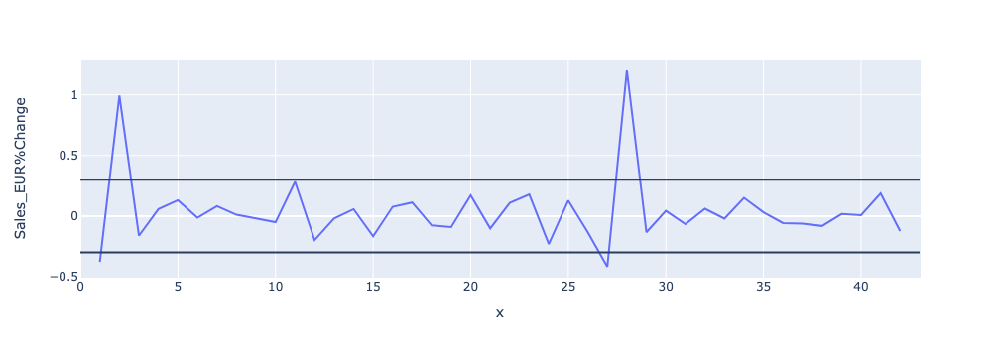

In [472]:
# Creating a lineplot of total sales evolution
fig = px.line(df, x=df.reset_index().index, y='Sales_EUR%Change')
fig.update_layout(shapes=[
    dict(type='line', x0=0, x1=len(df), y0=0.30, y1=0.30),
    dict(type='line', x0=0, x1=len(df), y0=-0.30, y1=-0.30)
])
fig.show()

__Notes:__

Possible anomalies, on x = 2 and 28. For the sake of keeping things as realistic and to reach practical conclusions (included at the end) we choose not to alter the data.

<a class="anchor" id="3.2">

## Feature Engineering

Creating new features for the data, in order to gain further insights and have achieve different perspectives of the data. Although this is the natural order of CRISP-DM we decided to do this step on the data loading, when it comes to percentage changes due to a high number of features. In this stage we created all the possible lag features.

In [473]:
# Define the target range for the lagged data
target_range = pd.date_range(start='2017-10', end='2022-04', freq='MS')

# Loop over the columns in final_df and add 12 lags
for col in final_df.columns:
    for lag in range(1, 13):
        # Define the name of the new column with the lag value
        new_col_name = f"{col} lag{lag}"
        # Shift the data in the column by the lag value
        lagged_data = final_df[col].shift(lag)
        # Set the index of the lagged data to be the same as the target range
        lagged_data.index = target_range
        # Add the lagged data to final_df as a new column
        final_df[new_col_name] = lagged_data
        
        
print('We now have',len(final_df.columns),'features to select from, wowziee, *Computah Activate Mass Feature Destruction*, \n*cough,cough*, *I mean, selection*')

We now have 1209 features to select from, wowziee, *Computah Activate Mass Feature Destruction*, 
*cough,cough*, *I mean, selection*


In [474]:
final_df_og = final_df.copy()

<a class="anchor" id="4">

# <font color='SeaGreen'>  Modelling </font>

<font color='SeaGreen'> At this step, although it might be an extensive process and a confusing one to digest at first, we structured a clear, pragmatic process , that is in tune with the core testing metric, the forecasted RMSE. This process also allow us to have an iterative looping process, where we could try different angles, check the results and decide on what's best at each speficic cenario, and that's why we left out the Iteration Notes. We decided to get the best model for each product as we believe each has it's own story and driving factors. The process that we apply to each product goes as follows:
    
<font color='SeaGreen'>     - Scale the final dataset, either with StandardScaler or MinMaxScaler, depending on results gotten.
    
<font color='SeaGreen'>     - Set a bar (threshold) for the RSME score that each one of the +1000 features has gotten, so we could quickly remove features that weren't as helpful.
    
<font color='SeaGreen'>     - Remove lags from the same features that had higher RMSE Scores.
    
<font color='SeaGreen'>     - Plot feature selection to remove misleading RMSE score features.
    
<font color='SeaGreen'>     - From the final list of features we calculated all the possible selection options.
    
<font color='SeaGreen'>     - For each possible selection we applied the grand majority of multivariate time series models available and picked the 5 best ones with the 5 respective best feature selections.
    
<font color='SeaGreen'>     - Retrain each model and plotting the results to pick the winning model.

## P1 Forecast
Feature Selection

In [639]:

# Slicing the 'final_df_og' DataFrame to select only the rows between '2018-11' and '2022-04', and assigning the result to a new DataFrame named 'final_df_scaled'
final_df_scaled = final_df_og['2018-11':'2022-04']

# Adding a new column named 'target' to the 'final_df_scaled' DataFrame with values from the 'P1' column of the 'df' DataFrame, shifted one position forward
final_df_scaled['target'] = df['P1'].values[1:]

# Creating a new 'StandardScaler' object named 'scaler'
scaler = StandardScaler()

# Applying the 'fit_transform()' method of the 'scaler' object to the 'final_df_scaled' DataFrame to standardize the values
scaled_model_df = scaler.fit_transform(final_df_scaled)

# Creating a new DataFrame named 'final_df' from the standardized data with column names and index copied from 'final_df_scaled'
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)


In [640]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [641]:
# Setting treshold for RMSE
bar = 1.09

In [642]:

# Creating an empty dictionary named 'rmse_scores'
rmse_scores = {}

# Looping over each column in the 'final_df' DataFrame
for column in final_df.columns:
    
    # Computing the RMSE between the 'target' column of the 'final_df' DataFrame and the current column, and assigning the result to 'rmse'
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    
    # Adding the 'rmse' value to the 'rmse_scores' dictionary, with the current column name as the key
    rmse_scores[column] = rmse

# Creating a new DataFrame named 'rmse_df' from the 'rmse_scores' dictionary, with column names set to 'RMSE'
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Creating a list named 'to_drop' containing the column names of the features whose RMSE value is greater than 'bar'
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

# Displaying a message that indicates how many features will be removed, and how many will remain after removing those features
print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')

# Dropping the columns in 'to_drop' from the 'final_df' DataFrame, and updating the 'rmse_df' DataFrame accordingly
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]

# Displaying the first 5 rows of the updated 'rmse_df' DataFrame
rmse_df.head(5)


We removed features above the 1.09 would remove 1203 features, leaving 7 to work with


,RMSE
PI_W_EE_PC lag1,1.00
United States CPI lag2,1.00
Avg_IR%Change lag10,1.05
IND BI%Change lag12,1.05
PI_W_MEN_PC lag1,1.07


In [643]:
# Creating a copy of the 'rmse_df' DataFrame named 'og_rmse_df'
og_rmse_df = rmse_df.copy()

# Looping over each index value in 'rmse_df' (which contains the column names of the features with an RMSE value less than or equal to 'bar')
for feat in rmse_df.index:
    
    # Extracting the first 5 characters of the current feature name, and assigning the result to 'feat_name'
    feat_name = feat[:-5]
    
    # Creating a list named 'other_features' containing the names of all the other features whose first 4 or 5 characters match 'feat_name'
    other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
    
    # Dropping all the features in 'other_features' except the first one (which is the current feature being processed) from the 'rmse_df' DataFrame
    rmse_df.drop(other_features[1:], axis=0, inplace=True)

# Creating a list named 'feature_list' containing the names of all the features in the updated 'rmse_df' DataFrame, as well as the 'target' column
feature_list = list(rmse_df.index)
feature_list.append('target')

# Slicing the 'final_df' DataFrame to select only the columns in 'feature_list', and assigning the result back to 'final_df'
final_df = final_df[feature_list]

# Displaying a message indicating how many lag features were removed, and how many features remain in the 'rmse_df' DataFrame
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))

# Displaying the updated 'rmse_df' DataFrame
rmse_df


Removed 0 lag features with lower mf_score 
Features left: 6


,RMSE
PI_W_EE_PC lag1,1.00
United States CPI lag2,1.00
Avg_IR%Change lag10,1.05
IND BI%Change lag12,1.05
PI_W_MEN_PC lag1,1.07
PP_DE_EE_PC lag8,1.08


In [644]:
# Create a list of all index values in rmse_df and store it in feature_list
feature_list = list(rmse_df[:].index)

# Add the string 'target' to the end of feature_list
feature_list.append('target')

# Select only the columns in final_df that have the same names as those in feature_list
# and store the resulting DataFrame in final_df
final_df = final_df[feature_list]

# Select all rows and columns in rmse_df and return the resulting DataFrame
rmse_df[:]


,RMSE
PI_W_EE_PC lag1,1.00
United States CPI lag2,1.00
Avg_IR%Change lag10,1.05
IND BI%Change lag12,1.05
PI_W_MEN_PC lag1,1.07
PP_DE_EE_PC lag8,1.08


Feature Selection Plots

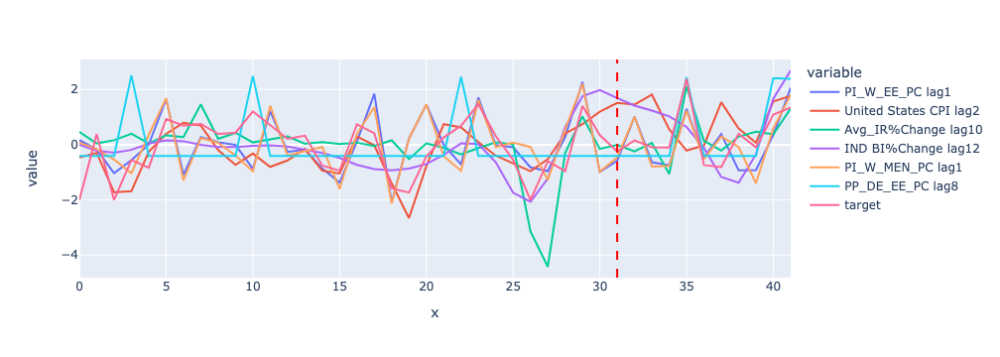

In [645]:
# Creating a lineplot comparing the different deatures to the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [646]:
# Create a list of all columns in final_df except for the last one (the target column)
variables = final_df.columns.tolist()[:-1]

# Set the maximum size of the feature selection to 5
max_selection_size = 5

# Create an empty list to store all possible selections of features
all_selections = []

# Loop through all possible selection sizes from 1 to max_selection_size
for selection_size in range(1, max_selection_size+1):
    
    # Loop through all possible combinations of variables of size selection_size
    # and append them to the all_selections list
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))

# Create a list of models to be used
Models = ['XGB']


In [647]:
# Set feature_combos equal to the list of all possible feature combinations
feature_combos = all_selections

# Get the total number of iterations that will be performed
total_number_of_its = len(feature_combos)

# Output the total number of iterations
total_number_of_its


62

In [648]:
## Initialize empty lists to store RMSE scores and model indices
#rmse = []
#index = []
#
## Initialize a counter variable to track progress
#i = 0
#
## Record the start time for the loop
#start_time = time.time()
#
## Loop through each feature combination
#for combo in feature_combos:
#    
#    # Select the features corresponding to the current combination
#    X = final_df[combo]['2019-12':]
#    
#    # Create the target variable
#    y = final_df['target']['2019-12':]
#    
#    # Set the number of days to forecast
#    days_forecast = 10
#    
#    # Split the data into training and testing sets
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    # Increment the progress counter
#    i += 1
#    
#    # Fit several regression models using the LazyRegressor library
#    clf = LazyRegressor(verbose=0)
#    models, predictions = clf.fit(X_train, X_test, y_train, y_test)
#    
#    # Select the two best-performing models based on RMSE
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    
#    # Store the RMSE scores and model indices in the appropriate lists
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#    
#    # Print progress and wait 0.5 seconds before continuing
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
## Record the end time for the loop
#end_time = time.time()
#
## Print the total time elapsed during execution
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")


In [649]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [650]:
# Create a list of lists called to_plot, where each inner list contains the names of a subset of features to be plotted
to_plot = [['Avg_IR%Change lag10', 'PI_W_MEN_PC lag1', 'PP_DE_EE_PC lag8'],
            ['Avg_IR%Change lag10', 'IND BI%Change lag12', 'PI_W_MEN_PC lag1', 'PP_DE_EE_PC lag8'],
            ['Avg_IR%Change lag10', 'PI_W_MEN_PC lag1', 'PP_DE_EE_PC lag8'],
            ['Avg_IR%Change lag10', 'PP_DE_EE_PC lag8'],
            ['Avg_IR%Change lag10', 'PP_DE_EE_PC lag8']]


Iteration Notes:

- All top selections had exactly the same forecasts so we picked more diverse selections (Non China based)
- Training with the ['2019-12':] range gave us better test results
- Covid low will be reduced, as it tricks several models into biasing off of it too much #Change1

Feature Selection Best Tests 1 - 5

In [651]:
# Initialize the MLPRegressor model and assign it to model1
model1 = MLPRegressor()

# Initialize a second MLPRegressor model and assign it to model2
model2 = MLPRegressor()

# Initialize the SGDRegressor model and assign it to model3
model3 = SGDRegressor()

# Initialize the Lars model and assign it to model4
model4 = Lars()

# Initialize the TransformedTargetRegressor model and assign it to model5
model5 = TransformedTargetRegressor()


In [652]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [653]:
# Convert y_pred_train to a list and store it in preds
preds = list(y_pred_train)

# Extend preds with the values in y_pred_test, also converted to a list
preds.extend(list(y_pred_test))


In [654]:
# Convert y_pred_train to a list and store it in preds
preds = list(y_pred_train)

# Extend preds with the values in y_pred_test, also converted to a list
preds.extend(list(y_pred_test))

# Create a new DataFrame called plot_df containing only the 'target' column from final_df
plot_df = pd.DataFrame(final_df['target'])

# Add a new column to plot_df called 'test1' containing the values in preds
plot_df['test1'] = preds


In [655]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [656]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [657]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [658]:
model = MLPRegressor()

In [659]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [660]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [661]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [662]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [663]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [664]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [665]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [666]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [667]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

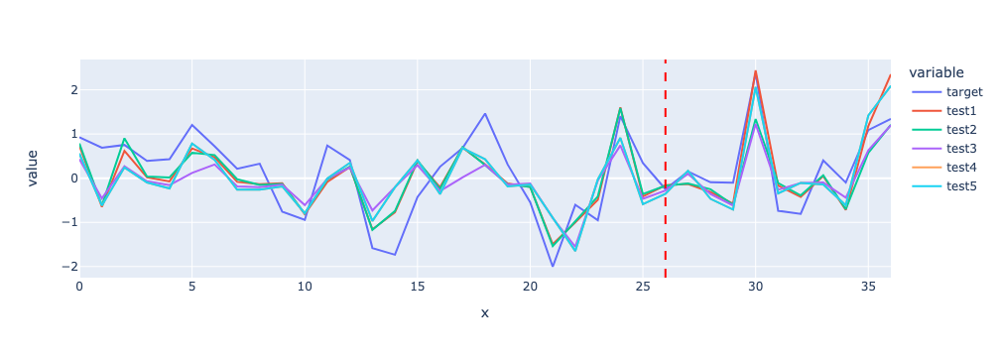

In [668]:
# Creating a lineplot to compare the different models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- Test 1 is the winning model since it caches all of momentum swings, is not overfitted on train and has the lowest RMSE.

- The winning predictive multivariate model was the MLPRegressor, which is a feedforward neural network that can learn complex non-linear relationships in the data, whereas other multivariate time series models, such as ARIMA or VAR, rely on linear or autoregressive assumptions.

The feature selection of the model was:
- Average Interest Rates Percentage Change with a lag of 10 
- Production Index World: Machinery 
- Equipment n.e.c. Percentage Change with 1 month lag
- Producer Prices Germany: Electrical Equipment Percentage Change

In [672]:
# Create a list called features containing the column names to be used from final_df
features = list(to_plot[0])

# Add the string 'target' to the end of features
features.append('target')

# Select only the columns in final_df that have the same names as those in features and store the resulting DataFrame in final_df
final_df = final_df[features]

# Create and fit a multi-series forecaster using model1 and a lag of 10 periods
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model1,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)

# Predict future values for the time series
steps = 10
predictions = forecaster.predict(steps=steps)

# Create a new index of dates for the predicted values
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

# Concatenate the original DataFrame and the predicted values into a single DataFrame
p1_pred_df = pd.concat([final_df, predictions])


In [673]:
# Reverse scale the column
unscaled_col = (p1_pred_df['target'].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
p1_pred_df['target_unscaled'] = unscaled_col.ravel()
    
p1_pred = round(p1_pred_df['target_unscaled'],2).values


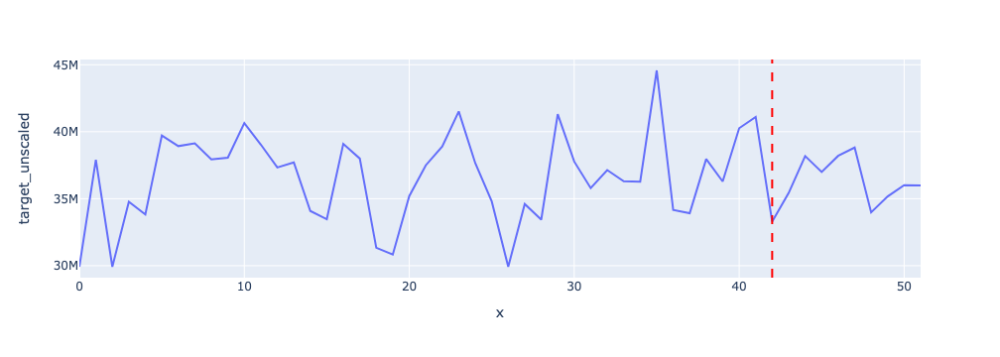

In [680]:
# Createing a lineplot of the unscaled predicted values
fig = px.line(p1_pred_df, x=p1_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

## P3 Forecast

Feature Selection

In [681]:

# Select a subset of rows from final_df_og containing data between November 2018 and April 2022
final_df_scaled = final_df_og['2018-11':'2022-04']

# Add a new column to final_df_scaled containing the 'P3' values from df, starting from the second value
final_df_scaled['target'] = df['P3'].values[1:]

# Initialize a StandardScaler object
scaler = StandardScaler()

# Fit the scaler to final_df_scaled and transform the data
scaled_model_df = scaler.fit_transform(final_df_scaled)

# Create a new DataFrame called final_df using the scaled data in scaled_model_df
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)


In [682]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [683]:
# Set treshold for RMSE
bar = 1.04

In [684]:
# Initialize an empty dictionary called rmse_scores
rmse_scores = {}

# For each column in final_df, calculate the root mean squared error (RMSE) between the 'target' column and the current column, and store the result in rmse_scores
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

# Convert rmse_scores to a DataFrame called rmse_df
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Create a list called to_drop containing the names of the columns in rmse_df that have an RMSE greater than the threshold value 'bar'
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

# Print a message indicating the number of features to be dropped and the number of features remaining
print('We removed features above the', bar, 'would remove', len(to_drop), 'features, leaving',
      len(final_df.columns) - len(to_drop), 'to work with')

# Drop the columns in to_drop from final_df
final_df.drop(to_drop, axis=1, inplace=True)

# Create a new DataFrame called rmse_df containing only the columns in rmse_df that have an RMSE less than or equal to the threshold value 'bar', sorted by increasing RMSE
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]

# Print the first five rows of rmse_df
rmse_df.head(5)


We removed features above the 1.04 would remove 1203 features, leaving 7 to work with


,RMSE
US_PI_ME_PC lag1,1.01
PI_US_MEN_PC lag1,1.02
PP_US_EE_PC lag4,1.03
EU_PI_ME_PC,1.03
PI_DE_EE_PC lag8,1.03


In [685]:
# Create a copy of rmse_df called og_rmse_df
og_rmse_df = rmse_df.copy()

# For each feature in rmse_df, keep only the lag feature with the lowest RMSE
for feat in rmse_df.index:
    # Get the first 5 characters of the feature name
    feat_name = feat[:-5]
        
    # Find all other features in rmse_df that have the same first 4 or 5 characters
    other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        
    # Drop all but the lag feature with the lowest RMSE from rmse_df
    rmse_df.drop(other_features[1:], axis=0, inplace=True)

# Create a list called feature_list containing the names of the columns to be used in final_df
feature_list = list(rmse_df.index)
feature_list.append('target')

# Select only the columns in final_df that have the same names as those in feature_list and store the resulting DataFrame in final_df
final_df = final_df[feature_list]

# Print a message indicating the number of lag features removed and the number of features remaining
print('Removed', len(og_rmse_df)-len(rmse_df), 'lag features with lower mf_score \nFeatures left:', len(rmse_df))

# Print the current values of rmse_df
rmse_df


Removed 0 lag features with lower mf_score 
Features left: 6


,RMSE
US_PI_ME_PC lag1,1.01
PI_US_MEN_PC lag1,1.02
PP_US_EE_PC lag4,1.03
EU_PI_ME_PC,1.03
PI_DE_EE_PC lag8,1.03
W_PC_PC lag9,1.04


Feature Selection Plots

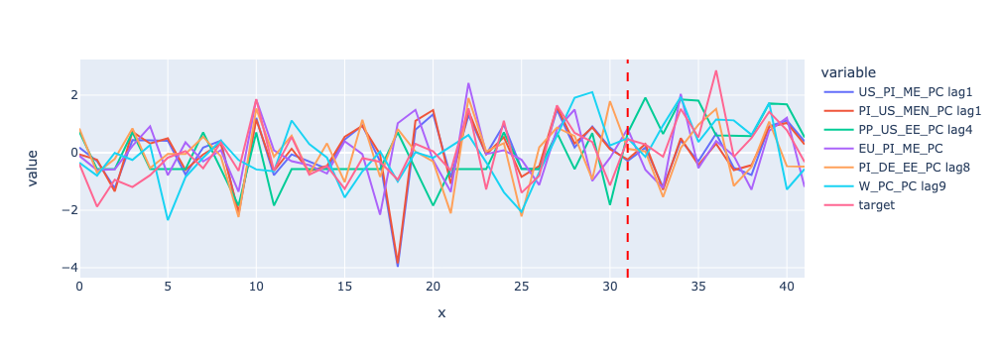

In [686]:
# Creating a lineplot to compare the features of P3 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [687]:
# Create a list called variables containing the names of all columns in final_df except for 'target'
variables = final_df.columns.tolist()[:-1]

# Set the maximum size of the feature selection to 5
max_selection_size = 5

# Create an empty list called all_selections
all_selections = []

# Loop over all possible selection sizes from 1 up to the maximum size
for selection_size in range(1, max_selection_size+1):
    # For each selection size, loop over all possible combinations of variables of that size
    # using the itertools.combinations() function, and append the resulting combinations
    # to all_selections as lists
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))

# Create a list called Models containing a single string 'XGB'
Models = ['XGB']


In [688]:
# Set feature_combos to all_selections
feature_combos = all_selections

# Set total_number_of_its to the length of feature_combos
total_number_of_its = len(feature_combos)


62

In [689]:
## Create empty lists to store results
#rmse = []
#index = []
#
## Initialize counter variable
#i = 0
#
## Record start time
#start_time = time.time()
#
## Loop through all feature combinations
#for combo in feature_combos:
#    
#    # Get the input features for this combination
#    X = final_df[combo]['2019-12':]
#    
#    # Create the target variable
#    y = final_df['target']['2019-12':]
#    
#    # Define the number of days to forecast
#    days_forecast = 10
#    
#    # Split the data into training and testing sets
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    # Increment the counter
#    i += 1
#    
#    # Initialize the LazyRegressor model
#    clf = LazyRegressor(verbose=0)
#    
#    # Fit the model on the training data and generate predictions for the test data
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    
#    # Select the two models with the lowest RMSE
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#    
#    # Get the names and scores of the top two models
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    
#    # Add the scores and model names to the lists
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#    
#    # Print progress and sleep for half a second
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
## Record end time
#end_time = time.time()
#
## Print elapsed time
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")
#

In [690]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [691]:
# Create a list of lists called to_plot
to_plot = [    ['US_PI_ME_PC lag1', 'PP_US_EE_PC lag4', 'PI_DE_EE_PC lag8', 'W_PC_PC lag9'],
    ['US_PI_ME_PC lag1', 'PP_US_EE_PC lag4', 'PI_DE_EE_PC lag8', 'W_PC_PC lag9'],
    ['US_PI_ME_PC lag1', 'PP_US_EE_PC lag4', 'EU_PI_ME_PC', 'PI_DE_EE_PC lag8', 'W_PC_PC lag9'],
    ['PP_US_EE_PC lag4', 'EU_PI_ME_PC', 'PI_DE_EE_PC lag8', 'W_PC_PC lag9'],
    ['PP_US_EE_PC lag4', 'PI_DE_EE_PC lag8']
]


Iteration Notes:

- Covid low will be reduced, as it tricks several models into biasing off of it too much #Change2, RMSE improved marginally
- Reducing the training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [692]:
# Initialize the model with the parameters
model1 = RANSACRegressor()
model2 = SGDRegressor()
model3 = BayesianRidge()
model4 = XGBRegressor()
model5 = BaggingRegressor()

In [693]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [694]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [695]:
# Create a list called preds and Add the predicted values for the test set to preds
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

# Create a DataFrame called plot_df containing only the 'target' column from final_df
plot_df = pd.DataFrame(final_df['target'])

# Add a new column to plot_df called 'test1', containing the values in preds
plot_df['test1'] = preds


In [696]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [697]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [698]:
# Create a list called preds
# Add the predicted values for the training set to preds
# Add the predicted values for the test set to preds
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

# Add a new column to plot_df called 'test2', containing the values in preds
plot_df['test2'] = preds


In [699]:
model = MLPRegressor()

In [700]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [701]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [702]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [703]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [704]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [705]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [706]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [707]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [708]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

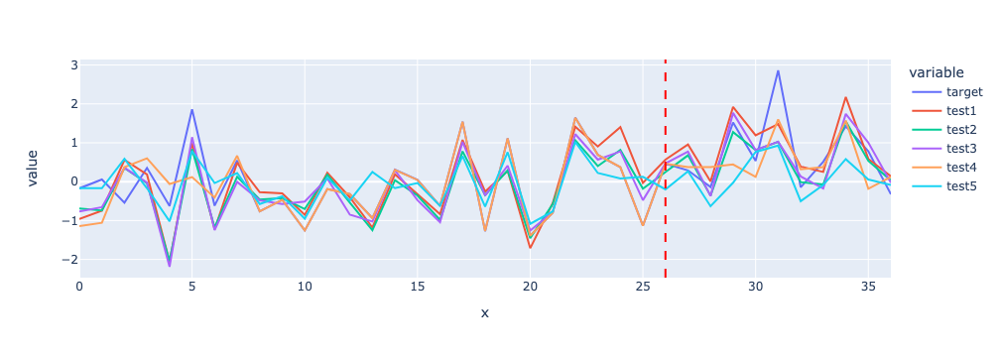

In [713]:
# Creating a lineplot to compare the models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- We pick Test 2 due to very solid results, more conservative peaks and not overfitted on train.

- The winning predictive multivariate model was the Stochastic Gradient Descent (SGD) which is an optimization algorithm used to train a wide range of machine learning models, including regression models. It is different from other multivariate time series models in that it updates the model parameters based on a single training instance at a time, as opposed to batch or mini-batch gradient descent which updates the parameters using the average gradient across multiple instances. 

- The feature selection of the model was:
    - United States Production Index Machinery & Electricals Percentage Change lag 1
    - Producer Prices United States: Electrical Equipment Percentage Change lag 4
    - Production Index Germany: Electrical Equipment Percentage Change lag 8
    - World: Price of Copper Percentage Change lag 9

In [738]:
features = list(to_plot[1])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model2,
                 lags               = 12,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p3_pred_df = pd.concat([final_df, predictions])

In [739]:

# Reverse scale the column
unscaled_col = (p3_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p3_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p3_pred = round(p3_pred_df['target_unscaled'],2).values

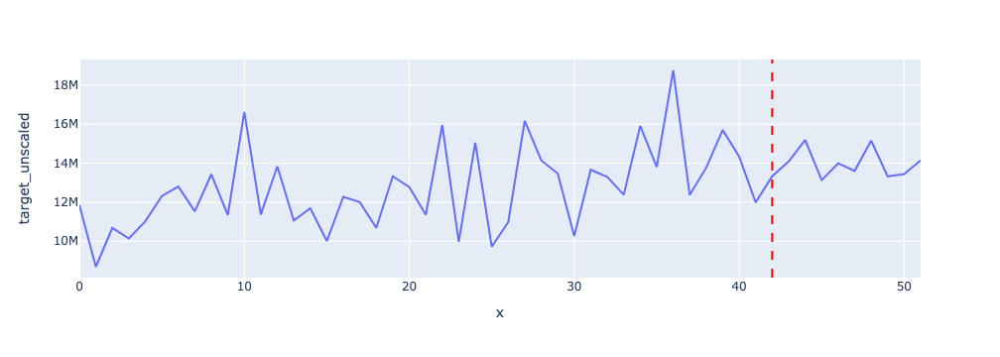

In [740]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p3_pred_df, x=p3_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

Sales in the target area are forecasted to narrow down through swings that top at 15M and bottom at 13M.

## P4 Forecast

Feature Selection

In [1618]:

# Select a subset of final_df_og called final_df_scaled, containing data from November 2018 to April 2022
final_df_scaled = final_df_og['2018-11':'2022-04']

# Add a new column to final_df_scaled called 'target', containing the values from column 'P4' in df, starting from index 1
final_df_scaled['target'] = df['P4'].values[1:]

# Instantiate a StandardScaler object called scaler
scaler = StandardScaler()

# Transform the data in final_df_scaled using the scaler object, and store the result in scaled_model_df
scaled_model_df = scaler.fit_transform(final_df_scaled)

# Create a new DataFrame called final_df using the data in scaled_model_df, and using the column names and index from final_df_scaled
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)


In [1619]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1620]:
bar = 1.12

In [1621]:
# Calculate the root mean squared error (RMSE) between the 'target' column and each of the other columns in final_df,
# and store the results in a dictionary called rmse_scores
rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

# Convert rmse_scores to a DataFrame called rmse_df
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# Create a list called to_drop containing the column names of all columns with an RMSE greater than the value of bar
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

# Print a message indicating how many features would be removed and how many features would be left if those columns were dropped
print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')

# Drop the columns in to_drop from final_df, inplace
final_df.drop(to_drop, axis=1, inplace=True)

# Create a new DataFrame called rmse_df containing only the remaining columns in final_df, sorted by RMSE in ascending order, excluding the 'target' column
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)


We removed features above the 1.12 would remove 1196 features, leaving 14 to work with


,RMSE
India IR%Change lag2,0.98
US_Manu_BI %Change lag8,1.02
USA BI%Change lag8,1.02
CHN BI%Change lag11,1.07
China_Manu_BI %Change lag11,1.07


In [1622]:
# Create a copy of rmse_df called og_rmse_df
og_rmse_df = rmse_df.copy()

# Loop over each feature in rmse_df
for feat in rmse_df.index:
        # Get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        # Create a list called other_features containing the names of all other features in rmse_df that share the same first 4 or 5 characters
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        
        # Drop all but the first feature in other_features from rmse_df, inplace
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

# Create a list called feature_list containing the names of all features in rmse_df, and append 'target' to the end
feature_list = list(rmse_df.index)
feature_list.append('target')

# Select only the columns in feature_list from final_df, and assign the result back to final_df
final_df = final_df[feature_list]

# Print a message indicating how many lag features were removed and how many features are left in rmse_df
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))

# Return rmse_df
rmse_df


Removed 1 lag features with lower mf_score 
Features left: 12


,RMSE
India IR%Change lag2,0.98
US_Manu_BI %Change lag8,1.02
USA BI%Change lag8,1.02
CHN BI%Change lag11,1.07
China_Manu_BI %Change lag11,1.07
Saudi Arabia CPI lag7,1.07
IT_SI_ME_PC lag12,1.10
DE_PI_ME_PC,1.10
DE_SI_ME_PC,1.11
EU_PI_ME_PC,1.11


Feature Selection Plots

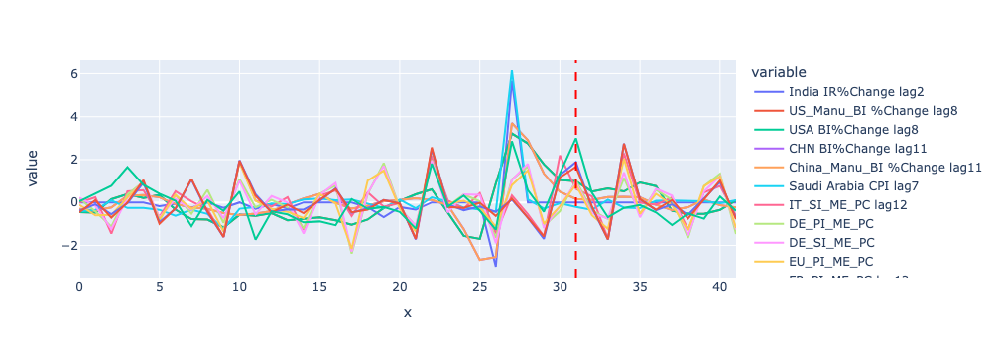

In [1623]:
# Creating a lineplot to compare the features of P4 with the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1624]:
# Create a list called variables containing the names of all columns in final_df except for 'target'
variables = final_df.columns.tolist()[:-1]

# Set max_selection_size to 5
max_selection_size = 5

# Create an empty list called all_selections
all_selections = []

# Loop over each selection size from 1 to max_selection_size
for selection_size in range(1, max_selection_size+1):
    # For each selection size, loop over all possible combinations of variables of that size, and append each combination to all_selections as a list
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))

# Create a list called Models containing the string 'XGB'
Models = ['XGB']


In [1625]:
# Set feature_combos to the previously created list all_selections
feature_combos = all_selections

# Set total_number_of_its to the length of feature_combos
total_number_of_its = len(feature_combos)


1585

In [1626]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1627]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [1628]:
# Create a list of lists called to_plot
to_plot = [    ['CHN BI%Change lag11', 'China_Manu_BI %Change lag11', 'Saudi Arabia CPI lag7'],
    ['India IR%Change lag2', 'CHN BI%Change lag11', 'Saudi Arabia CPI lag7'],
    ['India IR%Change lag2', 'China_Manu_BI %Change lag11', 'Saudi Arabia CPI lag7'],
    ['CHN BI%Change lag11', 'Saudi Arabia CPI lag7'],
    ['China_Manu_BI %Change lag11', 'Saudi Arabia CPI lag7']
]


Iteration Notes:

- Limited range for the training period provides better scores

Feature Selection Best Tests 1 - 5

In [1629]:
# Initialize the model with the parameters
model1 = RANSACRegressor()
model2 = AdaBoostRegressor()
model3 = AdaBoostRegressor()
model4 = RANSACRegressor()
model5 = RANSACRegressor()

In [1630]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1631]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1632]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1633]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1634]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1635]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1636]:
model = MLPRegressor()

In [1637]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1638]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1639]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1640]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1641]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1642]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1643]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1644]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1645]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

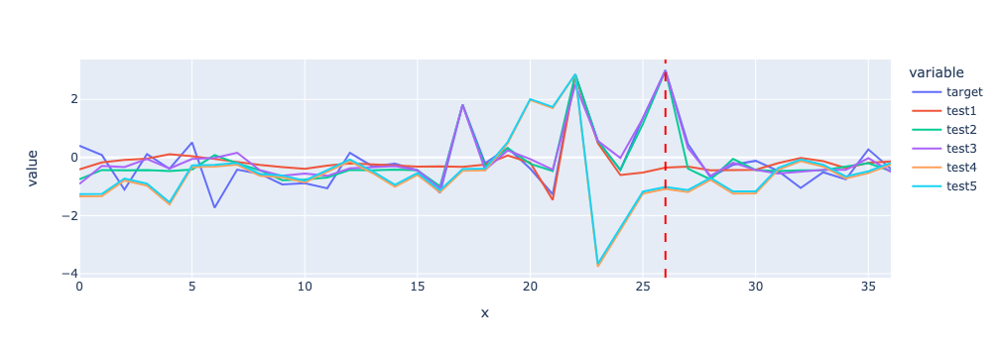

In [1646]:
# Creating a lineplot to compare the models 
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

- Test 3 is the winning model since it had a better training prediction, as well as an okay test prediction , given that all others didnt perform better

- The winning predictive multivariate model was the AdaBoostRegressor is different from other multivariate time series models in that it uses an ensemble of weak learners that sequentially fit to the residuals of the previous learner, thus making it more robust against outliers and noise in the data.

- The feature selection of the model were:
    - India's Interest Rate Percentage Change lag 2
    - China's Manufacturing Business Confindence Percentage Change lag 11
    - Saudi Arabia's Consumer Price Index lag 7

In [1647]:
features = list(to_plot[2])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model3,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p4_pred_df = pd.concat([final_df, predictions])

In [1648]:

# Reverse scale the column
unscaled_col = (p4_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p4_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p4_pred = round(p4_pred_df['target_unscaled'],2).values

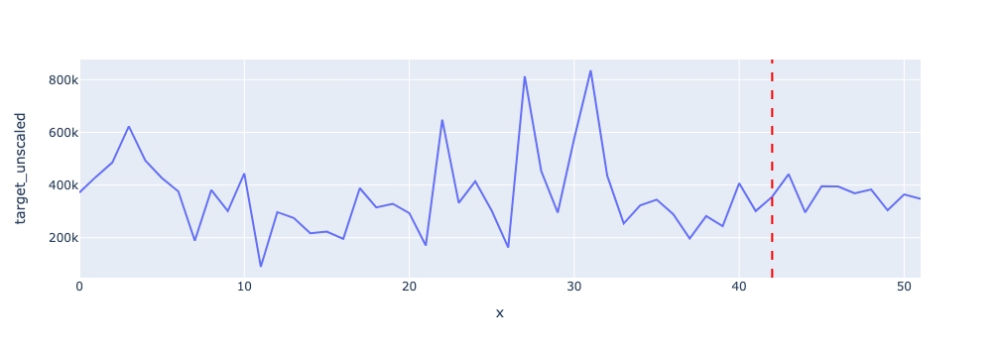

In [1649]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p4_pred_df, x=p4_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

Uptrend in spikes pre-covid is not forecasted within the next 10 months, instead, we forecasted a flat trend of swings between low of 400k's and a high 200k's.

## P5 Forecast

Feature Selection

In [800]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P5'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [801]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [802]:
bar = 0.98

In [803]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 0.98 would remove 1203 features, leaving 7 to work with


,RMSE
FR_SI_ME_PC,0.93
EU_SI_ME_PC,0.96
DE_SI_ME_PC,0.96
PI_W_MEN_PC,0.98
PI_DE_MEN_PC,0.98


In [804]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(final_df.columns)-1)
rmse_df

Removed 0 lag features with lower mf_score 
Features left: 6


,RMSE
FR_SI_ME_PC,0.93
EU_SI_ME_PC,0.96
DE_SI_ME_PC,0.96
PI_W_MEN_PC,0.98
PI_DE_MEN_PC,0.98
DE_PI_ME_PC,0.98


Feature Selection Plots

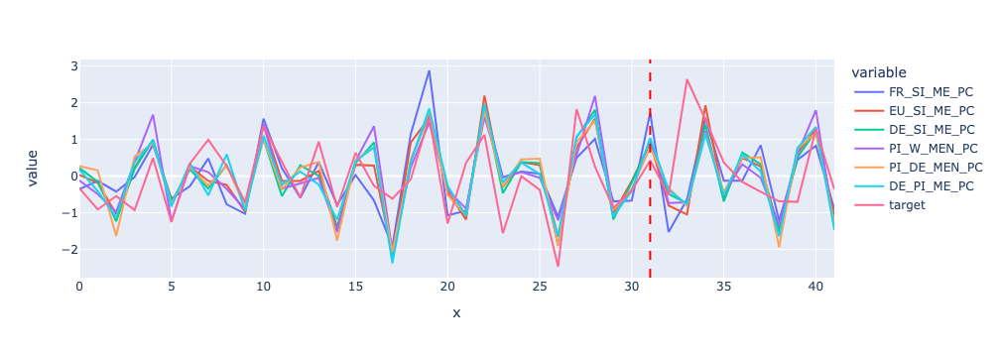

In [805]:
# Creating a lineplot to compare the features of P5 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [806]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [807]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

62

In [808]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [809]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [810]:
to_plot = [['EU_SI_ME_PC', 'DE_SI_ME_PC', 'PI_W_MEN_PC', 'PI_DE_MEN_PC'],
          ['DE_SI_ME_PC', 'PI_W_MEN_PC'],
          ['EU_SI_ME_PC', 'DE_SI_ME_PC', 'PI_W_MEN_PC', 'DE_PI_ME_PC'],
          ['EU_SI_ME_PC', 'DE_SI_ME_PC', 'PI_W_MEN_PC', 'PI_DE_MEN_PC', 'DE_PI_ME_PC'],
          ['EU_SI_ME_PC', 'DE_SI_ME_PC', 'PI_DE_MEN_PC', 'DE_PI_ME_PC']]

Iteration Notes:

- We will try a different group of features, selecting top 6 RMSE features to then create combos on LazyRegressor are giving us 0.79 RMSE
- New set of features aren't giving better results with a top result of 0.87

Feature Selection Best Tests 1 - 5

In [811]:
# Initialize the model with the parameters
model1 = DecisionTreeRegressor()
model2 = DecisionTreeRegressor()
model3 = DecisionTreeRegressor()
model4 = DecisionTreeRegressor()
model5 = DecisionTreeRegressor()

In [812]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [813]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [814]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [815]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [816]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [817]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [818]:
model = MLPRegressor()

In [819]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [820]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [821]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [822]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [823]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [824]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [825]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [826]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [827]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

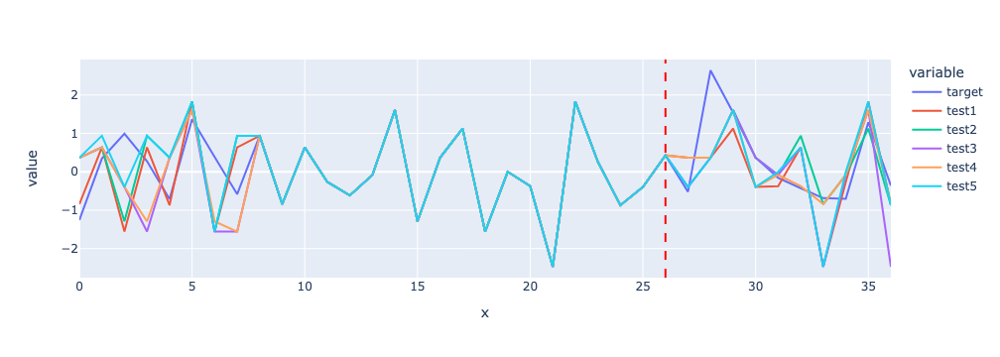

In [829]:
#Creating a lineplot to compare the different models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

- Test 4 is the winning model, we're very happy with the forecast results, vs the RMSE provided, test 3 is very similiar but has a big error on the test range, letting us infer that 'PI_DE_MEN_PC' is a determining feature (only difference between test 3 and 4). Overfitting will be something to avoid on the prediction.

- The winning predictive multivariate model was the DecisionTreeRegressor which is a non-linear regression model that captures complex interactions between features, but it does not inherently consider time dependencies between observations, making it less suitable for modeling time series data compared to other models that specifically account for time dependencies.

- The feature selection of the model was:
    - Europe Shipments Index Machinery & Electricals Percentage Change
    - Germany Shipments Index Machinery & Electricals Percentage Change
    - Production Index Germany: Machinery and Equipment n.e.c. Percentage Change
    - Germany Production Index Machinery & Electricals Percentage Change
    
No lags were picked by our algorithims for this product, making it the product with the highest sensibility to current events.

In [862]:
model4 = DecisionTreeRegressor(max_depth=6)

__Notes:__

We decided to prune the trees to reduce overfitting

In [863]:
features = list(to_plot[3])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model4,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p5_pred_df = pd.concat([final_df, predictions])

In [864]:

# Reverse scale the column
unscaled_col = (p5_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p5_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p5_pred = round(p5_pred_df['target_unscaled'],2).values

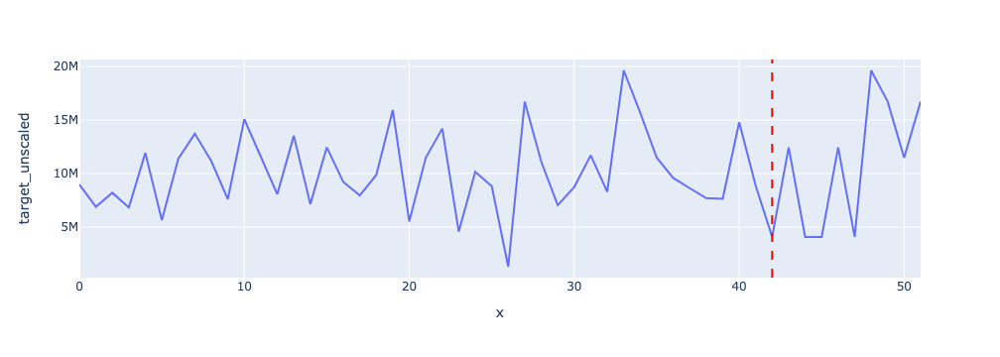

In [865]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p5_pred_df, x=p5_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

We forecast two swings, spiking at 13M in the first half of the 10 months. In the later stage we predict a big spike in sale of 19M.

## P6 Forecast

Feature Selection

In [866]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P6'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [867]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [868]:
bar = 1.16

In [869]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.16 would remove 1203 features, leaving 7 to work with


,RMSE
UK_SI_ME_PC lag9,1.11
PI_US_MEN_PC lag6,1.12
US_PI_ME_PC lag6,1.12
China CPI lag7,1.13
DE_SI_ME_PC lag9,1.16


In [870]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 0 lag features with lower mf_score 
Features left: 6


,RMSE
UK_SI_ME_PC lag9,1.11
PI_US_MEN_PC lag6,1.12
US_PI_ME_PC lag6,1.12
China CPI lag7,1.13
DE_SI_ME_PC lag9,1.16
DE_PI_ME_PC lag9,1.16


Feature Selection Plots

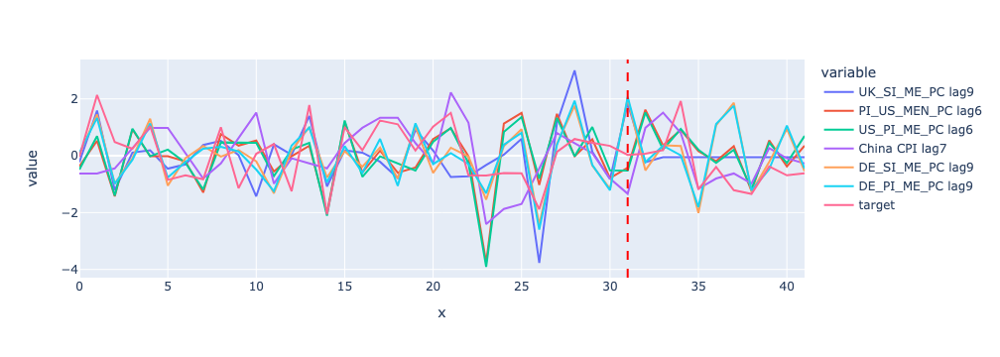

In [871]:
# Creating a lineplot to compare the features of P6 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [872]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [873]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

62

In [874]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [875]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(50)

In [876]:
to_plot = [['China CPI lag7'],
          ['UK_SI_ME_PC lag9', 'US_PI_ME_PC lag6'],
          ['UK_SI_ME_PC lag9', 'China CPI lag7', 'DE_SI_ME_PC lag9', 'DE_PI_ME_PC lag9'],
          ['UK_SI_ME_PC lag9', 'China CPI lag7', 'DE_PI_ME_PC lag9'],
          ['US_PI_ME_PC lag6', 'China CPI lag7', 'DE_PI_ME_PC lag9']]

Iteration Notes:

- Limited range provided 0.73 RMSE
- Full Range provided 0.73 RMSE
- All KernelRidge models have the same results so we'll try other options

Feature Selection Best Tests 1 - 5

In [877]:
# Initialize the model with the parameters
model1 = KNeighborsRegressor()
model2 = PassiveAggressiveRegressor()
model3 = OrthogonalMatchingPursuitCV()
model4 = KernelRidge()
model5 = RANSACRegressor()

In [878]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [879]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [880]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [881]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [882]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [883]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [884]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [885]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [886]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [887]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [888]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [889]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [890]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [891]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [892]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

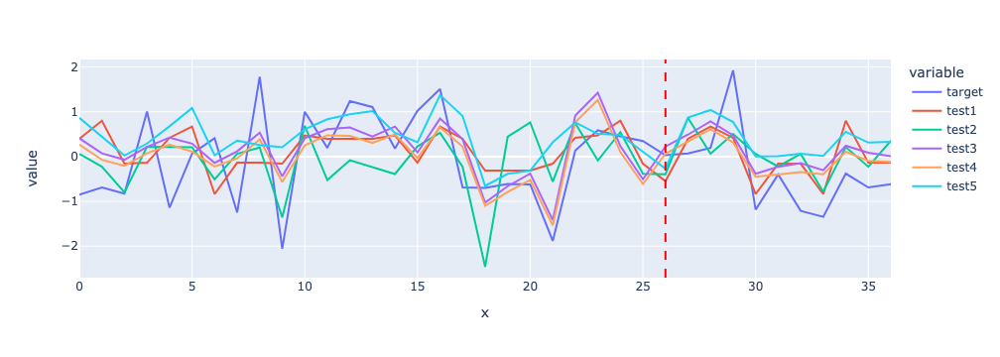

In [905]:
# Creating a lineplot to compare the different models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

In [907]:
list(to_plot[1])

['Avg CPI Change lag2', 'Brazil IR%Change lag4', 'Avg_IR%Change']

__Notes:__

- Test 1 is the winning model since it caches all of the momentum swings, is not overfitted on train and has lowest RMSE.

- At a second iteration with other models, we pick model 2 which has a high RMSE, and solid performance overall, given the intrinsic hard pattern detection of the product 6 data.

- The winning predictive multivariate model was the PassiveAggressiveRegressor which is a linear regression model that updates its weights in an online fashion, meaning it can learn from data as it arrives and does not require retraining on the entire dataset, making it more suitable for real-time applications in this multivariate time series analysis.

- The feature selection of the model was:
    - Average Consumer Price Index Percentage Change lag2
    - Brazil Interaste Rates Percentage Change lag 4
    - Average Interaste Rates Percentage Change 

In [914]:
features = list(to_plot[1])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model2,
                 lags               = 24,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p6_pred_df = pd.concat([final_df, predictions])

In [915]:

# Reverse scale the column
unscaled_col = (p6_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p6_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p6_pred = round(p6_pred_df['target_unscaled'],2).values

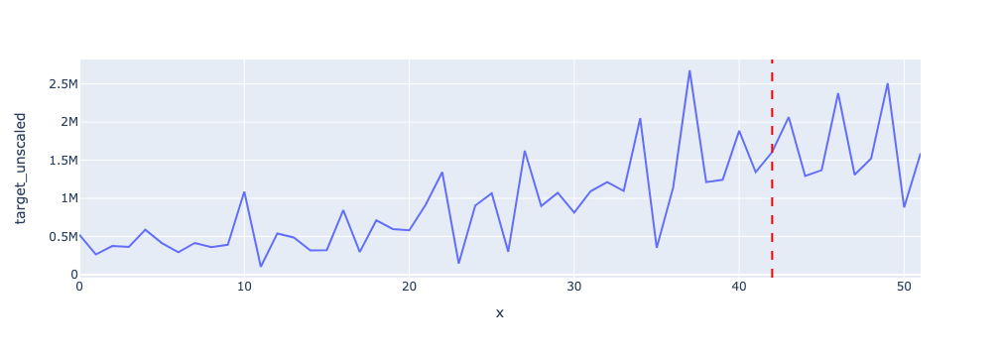

In [916]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p6_pred_df, x=p6_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

We forecast an upkeep of the trend that has been historically set, with regular swings.

## P8 Forecast

Feature Selection

In [917]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P8'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [918]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [919]:
bar = 1

In [920]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(10)

We removed features above the 1 would remove 1188 features, leaving 22 to work with


,RMSE
PP_US_EE_PC lag2,0.91
Avg CPI Change lag2,0.91
Brazil IR%Change lag4,0.92
IND BI,0.93
Avg_IR%Change,0.95
Brazil IR%Change lag1,0.95
United Kingdom IR%Change,0.96
United States CPI lag2,0.96
PP_US_EE_PC lag4,0.96
IND BI lag1,0.96


In [921]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 4 lag features with lower mf_score 
Features left: 17


,RMSE
PP_US_EE_PC lag2,0.91
Avg CPI Change lag2,0.91
Brazil IR%Change lag4,0.92
IND BI,0.93
Avg_IR%Change,0.95
United Kingdom IR%Change,0.96
United States CPI lag2,0.96
IND BI lag1,0.96
PP_IT_EE_PC lag1,0.97
PP_FR_EE_PC lag1,0.98


Feature Selection Plots

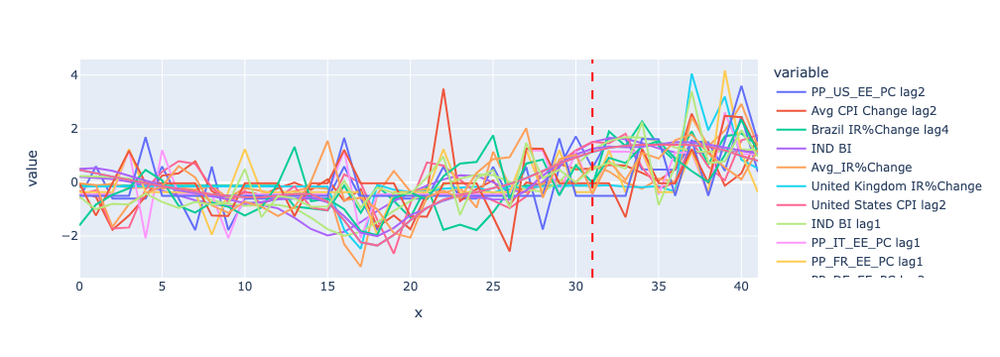

In [922]:
# Creating a lineplot to compare the features of P8 with the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [923]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [924]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

9401

In [925]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [926]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(10)

In [927]:
to_plot = [['Avg CPI Change lag2', 'Brazil IR%Change lag4', 'Avg_IR%Change'],
          ['Avg CPI Change lag2', 'Brazil IR%Change lag4', 'Avg_IR%Change'],
          ['Avg CPI Change lag2', 'Brazil IR%Change lag4', 'IND BI'],
          ['PP_US_EE_PC lag2', 'Avg CPI Change lag2', 'Brazil IR%Change lag4', 'IND BI', 'Avg_IR%Change'],
          ['Avg CPI Change lag2', 'Brazil IR%Change lag4']]

Iteration Notes:

- Covid low will be reduced, as it tricks several models into biasing off of it too much -> RMSE imporved marginally
- Reducing the training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [928]:
# Initialize the model with the parameters
model1 = LinearSVR()
model2 = HuberRegressor()
model3 = MLPRegressor()
model4 = OrthogonalMatchingPursuitCV()
model5 = Lars()

In [929]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [930]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [931]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [932]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [933]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [934]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [935]:
model = MLPRegressor()

In [936]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [937]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [938]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [939]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [940]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [941]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [942]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [943]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [944]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

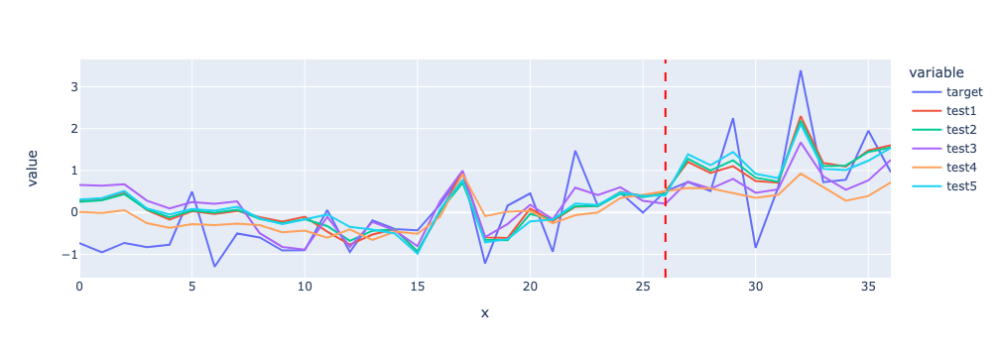

In [946]:
# Creating a lineplot to compare the models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- We will go ahead with model 3 since it learned the uptrend and predicted a spike on the test prediction, early ranges are bad, but we did'nt train the model for it, so its fine

- The winning predictive multivariate model was the MLPRegressor, which was explained in Product's 1 winning model

- The feature selection of the model was:
    - Average Consumer Price Index Percentage Change lag 2
    - India's Business Confindence
    - Brazil's Interest Rate Percentage Change lag 4

In [951]:
features = list(to_plot[2])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model3,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p8_pred_df = pd.concat([final_df, predictions])

In [952]:

# Reverse scale the column
unscaled_col = (p8_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p8_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p8_pred = round(p8_pred_df['target_unscaled'],2).values

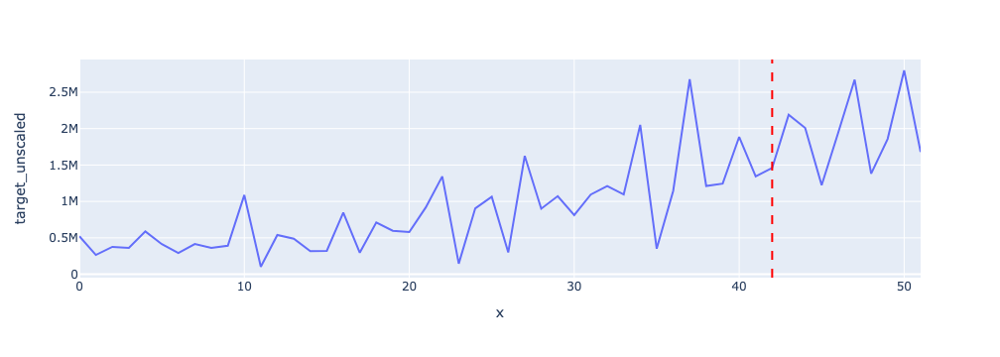

In [953]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p8_pred_df, x=p8_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

## P9 Forecast

Feature Selection

In [954]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P9'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [955]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [956]:
bar = 1.1

In [957]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.1 would remove 1203 features, leaving 7 to work with


,RMSE
Saudi Arabia CPI lag3,0.91
USA BI%Change lag9,1.02
US_Manu_BI %Change lag9,1.02
W_PNGI_PC lag2,1.05
GBR BI%Change,1.09


In [958]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 1 lag features with lower mf_score 
Features left: 5


,RMSE
Saudi Arabia CPI lag3,0.91
USA BI%Change lag9,1.02
US_Manu_BI %Change lag9,1.02
W_PNGI_PC lag2,1.05
GBR BI%Change,1.09


Feature Selection Plots

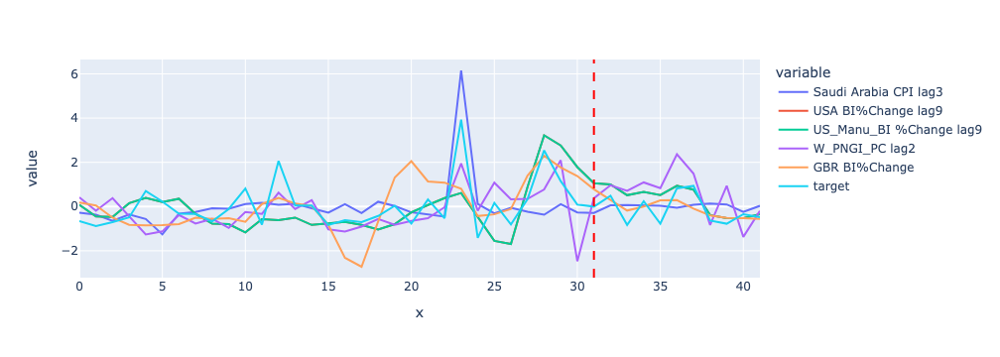

In [959]:
# Creating a lineplot to compare the features of P9 with the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [960]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [961]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

31

In [962]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [963]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(10)

In [964]:
to_plot = [['W_PNGI_PC lag2', 'GBR BI%Change'],
          ['Saudi Arabia CPI lag3', 'US_Manu_BI %Change lag9'],
          ['Saudi Arabia CPI lag3', 'W_PNGI_PC lag2', 'GBR BI%Change'],
          ['Saudi Arabia CPI lag3', 'USA BI%Change lag9', 'US_Manu_BI %Change lag9'],
          ['Saudi Arabia CPI lag3', 'USA BI%Change lag9', 'US_Manu_BI %Change lag9']]

Iteration Notes:

- Covid low will be reduced, as it tricks several models into biasing off of it too much #Change2, RMSE imporved marginally
- Reducing the training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [965]:
# Initialize the model with the parameters
model1 = KNeighborsRegressor()
model2 = AdaBoostRegressor()
model3 = MLPRegressor()
model4 = BaggingRegressor()
model5 = ExtraTreeRegressor()

In [966]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [967]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [968]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [969]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [970]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [971]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [972]:
model = MLPRegressor()

In [973]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [974]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [975]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [976]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [977]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [978]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [979]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [980]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [981]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

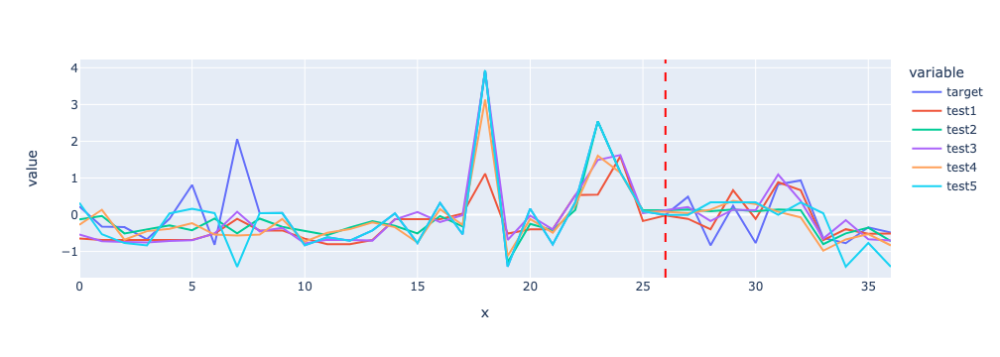

In [983]:
# Creating a lineplot to compare the models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- Test 1 is the best one overall, catching most of the momentum on all ranges.

- The winning predictive multivariate model was the KNeighborsRegressor which is different from all other multivariate time series models in that it is a non-parametric model that predicts the target value based on the average of the K-nearest neighbors, where the distance between the neighbors is calculated based on the Euclidean distance between the predictor variables, and it doesn't take into account the temporal relationship between the samples.

- The feature selection of the model was:
    - World: Price of Natural Gas index Percentage Change lag 2
    - Great Britain's Business Confindence Percentage Change

In [1014]:
features = list(to_plot[0])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model1,
                 lags               = 30,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p11_pred_df = pd.concat([final_df, predictions])

In [1015]:

# Reverse scale the column
unscaled_col = (p11_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p11_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p11_pred = round(p11_pred_df['target_unscaled'],2).values

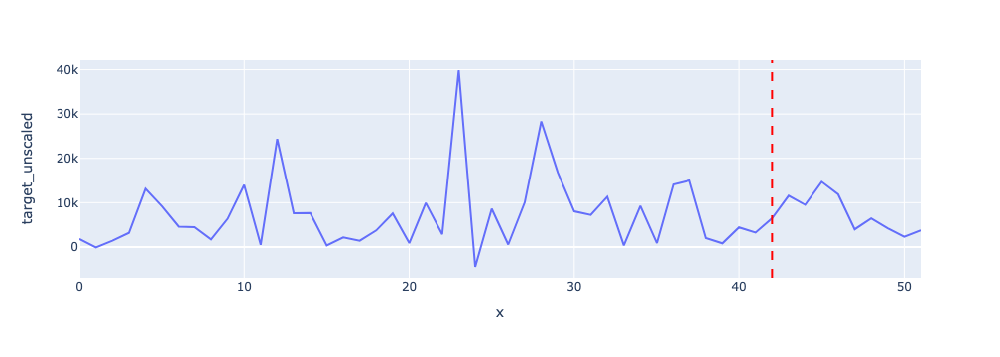

In [1016]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p11_pred_df, x=p11_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

Since the KNeighborsRegressor needs a higher number of training data in order to have solid resukts we upped the lags on the foracast. 

We forecast a continuation of the downtrend in spikes of sales post Covid, picking just under 15k, and flatining out at the near median range of 5k.

## P11 Forecast

Feature Selection

In [1017]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P11'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1018]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1019]:
bar = 0.96

In [1020]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 0.96 would remove 1203 features, leaving 7 to work with


,RMSE
PI_JP_MEN_PC lag6,0.87
JP_SI_ME_PC lag6,0.88
JP_PI_ME_PC lag6,0.89
PI_JP_EE_PC lag6,0.91
PI_W_MEN_PC lag6,0.94


In [1021]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 0 lag features with lower mf_score 
Features left: 6


,RMSE
PI_JP_MEN_PC lag6,0.87
JP_SI_ME_PC lag6,0.88
JP_PI_ME_PC lag6,0.89
PI_JP_EE_PC lag6,0.91
PI_W_MEN_PC lag6,0.94
PI_W_EE_PC lag6,0.96


Feature Selection Plots

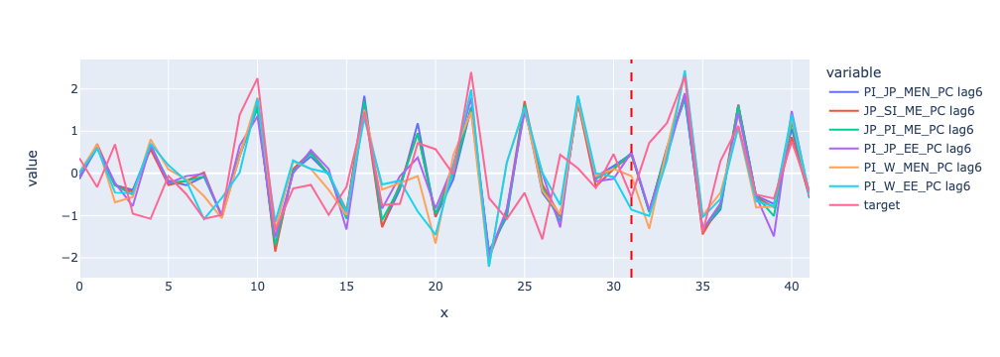

In [1022]:
# Creating a lineplot to compare the features of P11 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1023]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1024]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

62

In [1025]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1026]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [1027]:
to_plot = [['PI_JP_MEN_PC lag6', 'PI_W_MEN_PC lag6', 'PI_W_EE_PC lag6'],
          ['JP_SI_ME_PC lag6', 'JP_PI_ME_PC lag6', 'PI_W_MEN_PC lag6', 'PI_W_EE_PC lag6'],
          ['JP_SI_ME_PC lag6', 'PI_W_EE_PC lag6'],
          ['PI_JP_MEN_PC lag6', 'JP_SI_ME_PC lag6', 'JP_PI_ME_PC lag6', 'PI_JP_EE_PC lag6'],
          ['JP_SI_ME_PC lag6', 'PI_W_EE_PC lag6']]

Iteration Notes:

- Covid low will be reduced, as it tricks several models into biasing off of it too much -> RMSE imporved marginally
- Reducing the training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [1028]:
# Initialize the model with the parameters
model1 = PassiveAggressiveRegressor()
model2 = DecisionTreeRegressor()
model3 = XGBRegressor()
model4 = RANSACRegressor()
model5 = AdaBoostRegressor()

In [1029]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1030]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1031]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1032]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1033]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1034]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1035]:
model = MLPRegressor()

In [1036]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1037]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1038]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1039]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1040]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1041]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1042]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1043]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1044]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

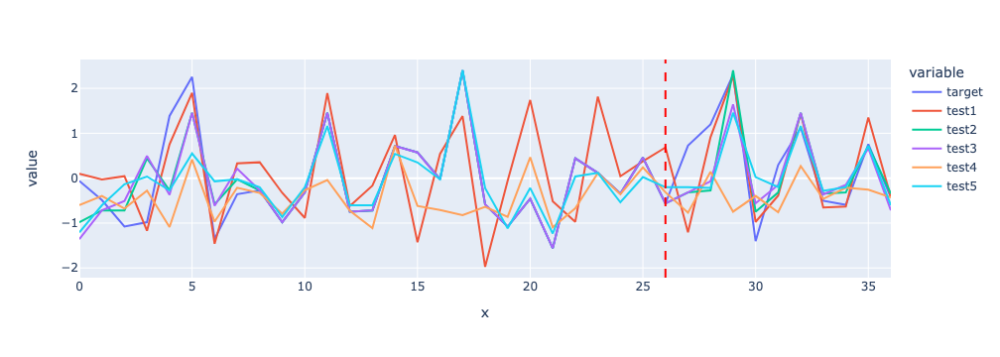

In [1046]:
# Creating a lineplot to compare the different models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

In [1047]:
list(to_plot[1])

['JP_SI_ME_PC lag6', 'JP_PI_ME_PC lag6', 'PI_W_MEN_PC lag6', 'PI_W_EE_PC lag6']

__Notes:__

- We pick test 3 due to marginal accurcy increase on the test data, more realistic spikes and momentum swings.

- The winning predictive multivariate model was the XGBRegressor which  is an optimized implementation of gradient boosting that can handle complex datasets with high-dimensional features, making it particularly useful for multivariate time series problems with a large number of covariates.

- The feature selection of the model was:

    - Japan Shipments Index Machinery & Electricals Percentage Change lag 6
    - Japan Production Index Machinery & Electricals Percentage Change lag 6
    - Production Index World: Machinery and Equipment n.e.c. Percentage Change lag 6
    - Production Index World Electrical Equipment Percentage Change lag 6
    
Interesting to note is that all features share the same lag, and are not specifically related to the EU.

In [1052]:
features = list(to_plot[2])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model3,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p11_pred_df = pd.concat([final_df, predictions])

In [1053]:

# Reverse scale the column
unscaled_col = (p11_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p11_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p11_pred = round(p11_pred_df['target_unscaled'],2).values

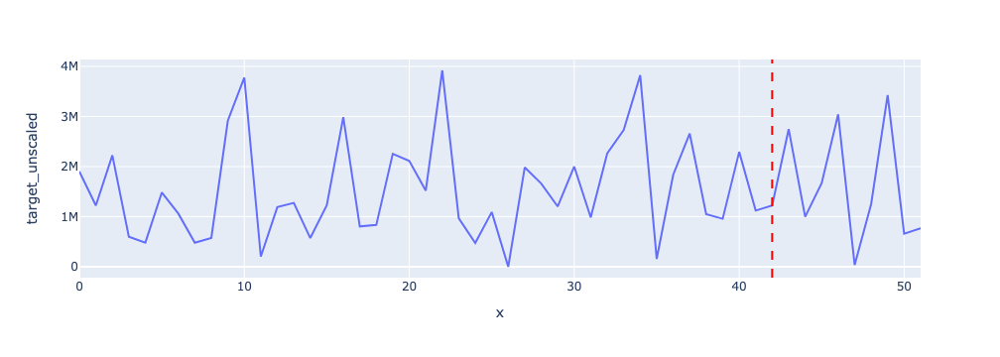

In [1054]:
#Creating a lineplot for the unscaled predictions
fig = px.line(p11_pred_df, x=p11_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

We forecast an uptrend for the spikes, from 2.8M to 3.5M, and bottoms of 1M, 35k, and 670k through the 10 months of prediction.

## P12 Forecast

Feature Selection

In [1055]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P12'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1056]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1057]:
bar = 1.08

In [1058]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.08 would remove 1202 features, leaving 8 to work with


,RMSE
Brazil CPI,0.97
PP_US_EE_PC lag1,1.03
Brazil IR%Change lag1,1.04
Brazil CPI lag2,1.05
W_PB_PC lag5,1.07


In [1059]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 0 lag features with lower mf_score 
Features left: 7


,RMSE
Brazil CPI,0.97
PP_US_EE_PC lag1,1.03
Brazil IR%Change lag1,1.04
Brazil CPI lag2,1.05
W_PB_PC lag5,1.07
PP_IT_EE_PC lag1,1.08
PP_CN_EE_PC lag6,1.08


Feature Selection Plots

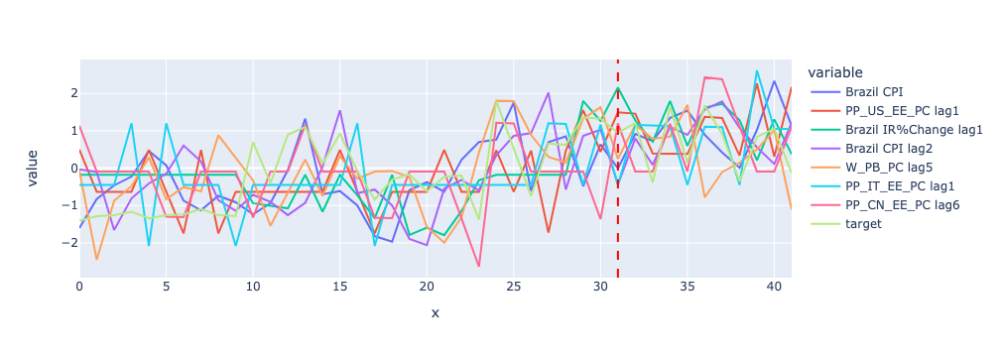

In [1060]:
# Creating a lineplot to compare the features of P12 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1061]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1062]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

119

In [1063]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]#['2019-12':]
#    # Create the Target
#    y = final_df['target']#['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1064]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(20)

In [1065]:
to_plot = [['Brazil CPI', 'PP_US_EE_PC lag1', 'Brazil IR%Change lag1', 'W_PB_PC lag5', 'PP_CN_EE_PC lag6'],
          ['Brazil CPI', 'Brazil CPI lag2', 'W_PB_PC lag5', 'PP_CN_EE_PC lag6'],
         ['Brazil CPI', 'PP_US_EE_PC lag1', 'Brazil IR%Change lag1'],
          ['PP_US_EE_PC lag1', 'Brazil IR%Change lag1'],
         ['PP_US_EE_PC lag1', 'PP_CN_EE_PC lag6']]

Iteration Notes:

- Full training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [1066]:
# Initialize the model with the parameters
model1 = XGBRegressor()
model2 = GradientBoostingRegressor()
model3 = KNeighborsRegressor()
model4 = PassiveAggressiveRegressor()
model5 = ExtraTreesRegressor()

In [1067]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1068]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1069]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1070]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1071]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1072]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1073]:
model = MLPRegressor()

In [1074]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1075]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1076]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1077]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1078]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1079]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1080]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1081]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1082]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

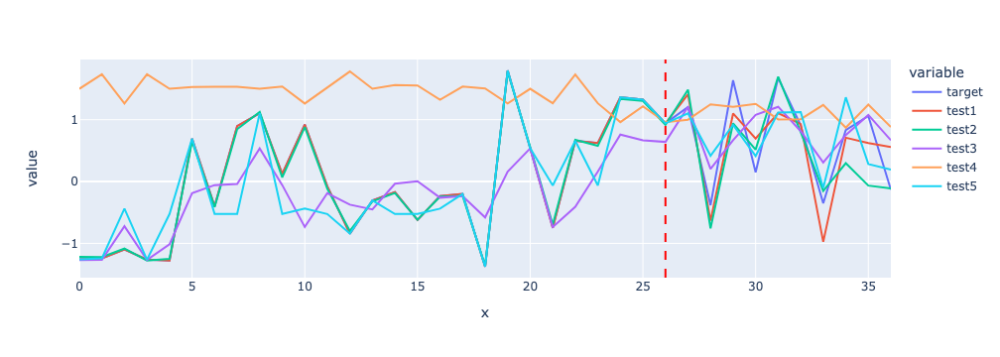

In [1083]:
# Creating a lineplot to compare the models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- Test 5 looks like the best one to predict further, even though the fit on train is not the best, it was capable to predict the swings on the test predictions.

- The winning predictive multivariate model was the ExtraTreesRegressor which differs has it is a tree-based ensemble model that can capture complex non-linear relationships in multivariate time series data while avoiding overfitting, by randomly selecting subsets of features and samples during the training process.

- The feature selection of the model was:
    - Producer Prices United States: Electrical Equipment Percentage Change lag 1
    - Producer Prices China: Electrical Equipment Percentage Change lag 6


In [1122]:
features = list(to_plot[4])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model5,
                 lags               = 24,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p12_pred_df = pd.concat([final_df, predictions])

In [1123]:

# Reverse scale the column
unscaled_col = (p12_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p12_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p12_pred = round(p12_pred_df['target_unscaled'],2).values

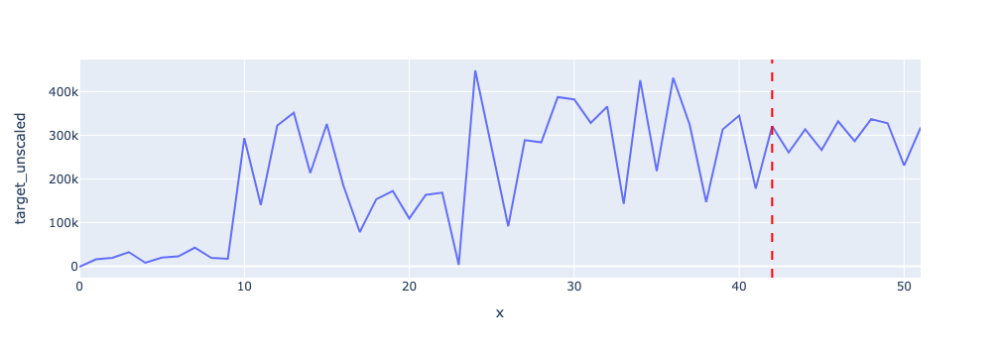

In [1124]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p12_pred_df, x=p12_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

We forecast tight swings in the majority of the 10 months with 350k highs and 250k lows, with a spike downwards in the 9th month hitting a 230k bottom.

## P13 Forecast

Feature Selection

In [1125]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P13'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1126]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1127]:
bar = 1.15

In [1128]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.15 would remove 1203 features, leaving 7 to work with


,RMSE
China CPI lag2,1.03
PI_CH_EE_PC lag3,1.09
India IR%Change lag3,1.10
Saudi Arabia CPI lag8,1.12
Euro area (19 countries) IR%Change lag1,1.13


In [1129]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 0 lag features with lower mf_score 
Features left: 6


,RMSE
China CPI lag2,1.03
PI_CH_EE_PC lag3,1.09
India IR%Change lag3,1.10
Saudi Arabia CPI lag8,1.12
Euro area (19 countries) IR%Change lag1,1.13
PI_US_EE_PC lag5,1.14


Feature Selection Plots

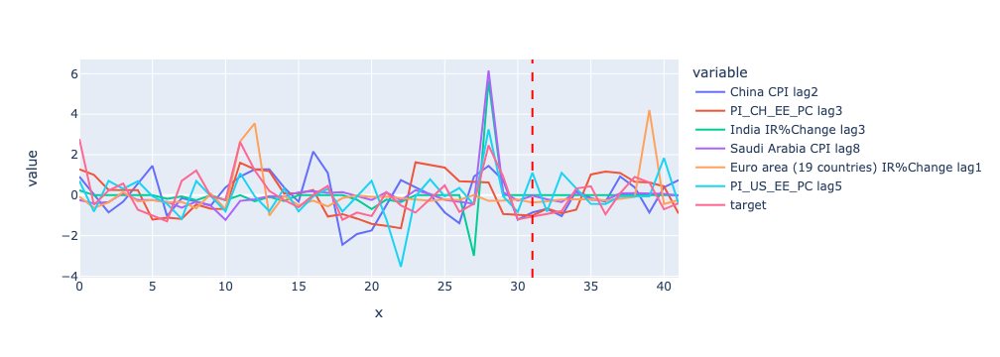

In [1130]:
# Creating a lineplot to compare the features of P13 with the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

In [1131]:
final_df.drop('China CPI lag2', axis=1, inplace=True)

In [1132]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1133]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

31

In [1134]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1135]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [1136]:
to_plot = [['India IR%Change lag3', 'Saudi Arabia CPI lag8', 'PI_US_EE_PC lag5'],
          ['India IR%Change lag3', 'Saudi Arabia CPI lag8', 'PI_US_EE_PC lag5'],
          ['Saudi Arabia CPI lag8', 'PI_US_EE_PC lag5'],
         ['PI_CH_EE_PC lag3', 'India IR%Change lag3', 'Saudi Arabia CPI lag8'],
          ['India IR%Change lag3', 'Saudi Arabia CPI lag8']]

Iteration Notes:

- Covid low will be reduced, as it tricks several models into biasing off of it too much #Change2, RMSE imporved marginally
- Reducing the training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [1137]:
# Initialize the model with the parameters
model1 = ExtraTreesRegressor()
model2 = RandomForestRegressor()
model3 = GradientBoostingRegressor()
model4 = DecisionTreeRegressor()
model5 = BaggingRegressor()

In [1138]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1139]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1140]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1141]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1142]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1143]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1144]:
model = MLPRegressor()

In [1145]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1146]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1147]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1148]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1149]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1150]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1151]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1152]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1153]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

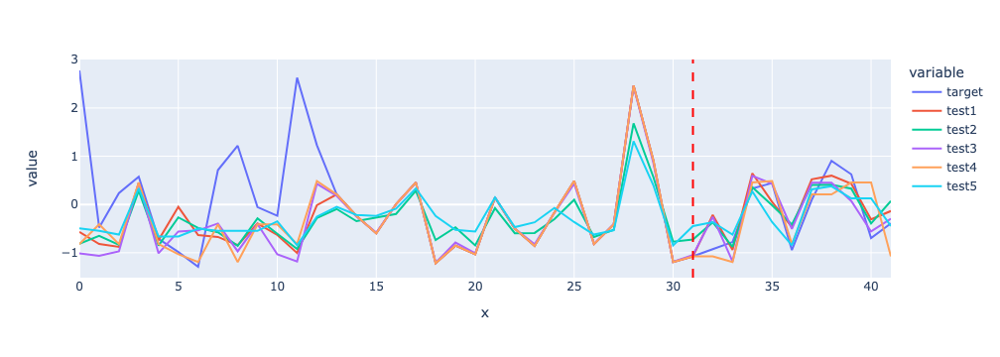

In [1154]:
# Creating a lineplot to compare the models
fig = px.line(plot_df, x=plot_df.reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- Test 1 is the winner since it has the best prediction out of all, we will make sure to reduce the overfitting tendency of the model itself with the whole train set.

- The winning predictive multivariate model was the ExtraTreesRegressor, the same has product 12.

- The feature selection of the model was:
    - India's Interest Rate Percentage Change lag 3
    - Production Index United States: Electrical Equipment Percentage Change lag 5
    - Saudi Arabia's Consumer Price Index lag 8

In [1161]:
features = list(to_plot[0])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model1,
                 lags               = 24,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p13_pred_df = pd.concat([final_df, predictions])

In [1162]:

# Reverse scale the column
unscaled_col = (p13_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p13_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p13_pred = round(p13_pred_df['target_unscaled'],2).values

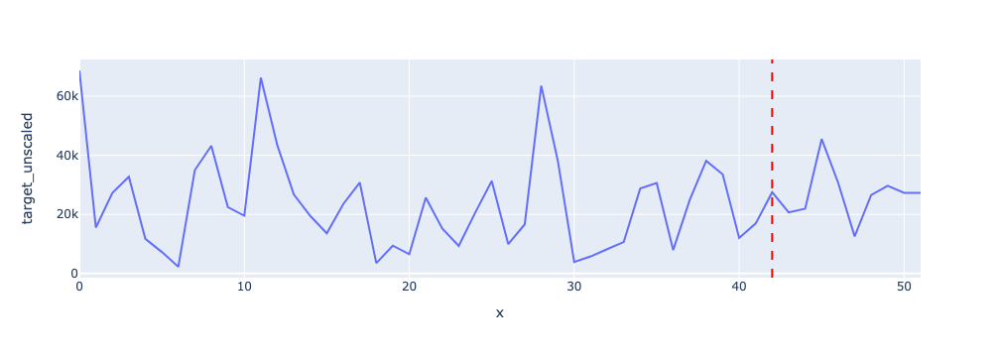

In [1163]:
# Creating a lineplot for the unscaled predictions
fig = px.line(p13_pred_df, x=p13_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

We forecast sales that spike twice in different directions, with a upwards spike at 45.5k and a downwards spike at 12.5k.

## P14 Forecast

Feature Selection

In [1164]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P14'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1165]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1166]:
bar = 1.11

In [1167]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)
final_df.drop(to_drop, axis=1, inplace=True)
print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')

rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.11 would remove 1201 features, leaving -1192 to work with


,RMSE
PP_DE_EE_PC lag5,0.91
Avg CPI Change lag12,1.05
PI_US_EE_PC lag9,1.06
India IR%Change lag7,1.07
PP_US_EE_PC lag12,1.07


In [1168]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 1 lag features with lower mf_score 
Features left: 7


,RMSE
PP_DE_EE_PC lag5,0.91
Avg CPI Change lag12,1.05
PI_US_EE_PC lag9,1.06
India IR%Change lag7,1.07
PP_US_EE_PC lag12,1.07
United States IR%Change,1.08
PI_DE_EE_PC lag4,1.10


Feature Selection Plots

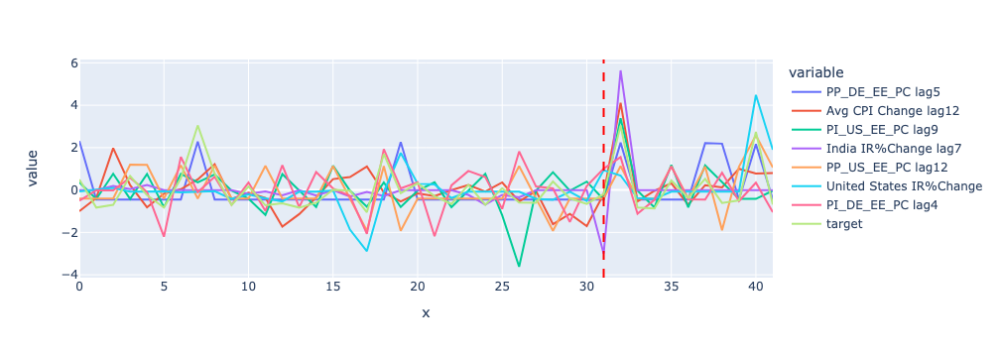

In [1169]:
# Creating a lineplot for the feature of P14 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1170]:
final_df.drop('India IR%Change lag7', axis=1, inplace=True)

__Notes:__

We droppped India IR%Change lag7 due to misleading RMSE score.

In [1171]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1172]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

62

In [1173]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1174]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [1175]:
to_plot = [['PP_DE_EE_PC lag5', 'PI_US_EE_PC lag9', 'PP_US_EE_PC lag12', 'PI_DE_EE_PC lag4'],
          ['PP_DE_EE_PC lag5', 'Avg CPI Change lag12', 'PI_US_EE_PC lag9', 'PP_US_EE_PC lag12', 'United States IR%Change'],
          ['PP_DE_EE_PC lag5', 'Avg CPI Change lag12', 'PI_US_EE_PC lag9', 'PP_US_EE_PC lag12', 'United States IR%Change'],
          ['Avg CPI Change lag12', 'PP_US_EE_PC lag12', 'PI_DE_EE_PC lag4'],
          ['Avg CPI Change lag12', 'PI_US_EE_PC lag9', 'United States IR%Change', 'PI_DE_EE_PC lag4']]

Iteration Notes:

- Full training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [1176]:
# Initialize the model with the parameters
model1 = PassiveAggressiveRegressor()
model2 = Lars()
model3 = LinearRegression()
model4 = ExtraTreeRegressor()
model5 = MLPRegressor()

In [1177]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1178]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1179]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1180]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1181]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1182]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1183]:
model = MLPRegressor()

In [1184]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1185]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1186]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1187]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1188]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1189]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1190]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1191]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1192]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

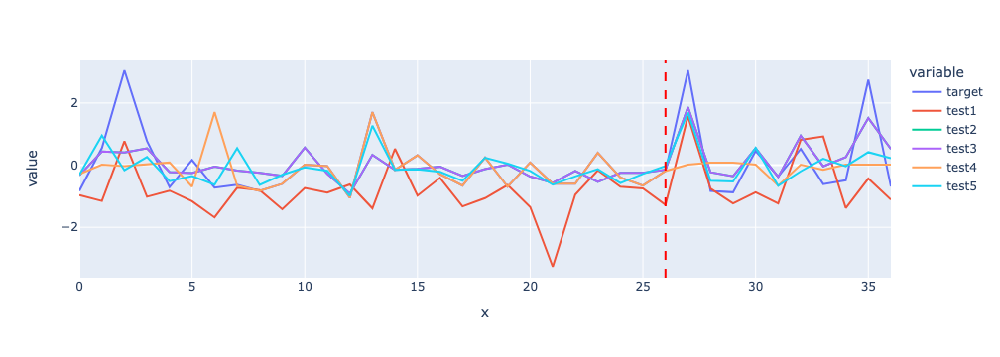

In [1194]:
# Creating a lineplot to compare the different models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- We will try to clip the Covid spike and the x = 2. After changing the values of df['14'] the spikes on test are predicted sucessfully on most models.

- The winning model was test 3 which has tested really well.

- The winning predictive multivariate model was the LinearRegression which is different from all other multivariate time series models in that it assumes a linear relationship between the dependent variable and the independent variables.

- The feature selection of the model was:
    - Producer Prices Germany: Electrical Equipment Percentage Change lag 5
    - Production Index United States: Electrical Equipment Percentage Change lag 9
    - Producer Prices United States: Electrical Equipment Percentage Change lag 12
    - US's Interest Rates Percentage Change
    - Average Consumer Price Index lag 12

In [1235]:
features = list(to_plot[2])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model3,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p14_pred_df = pd.concat([final_df, predictions])

In [1236]:

# Reverse scale the column
unscaled_col = (p14_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p14_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p14_pred = round(p14_pred_df['target_unscaled'],2).values

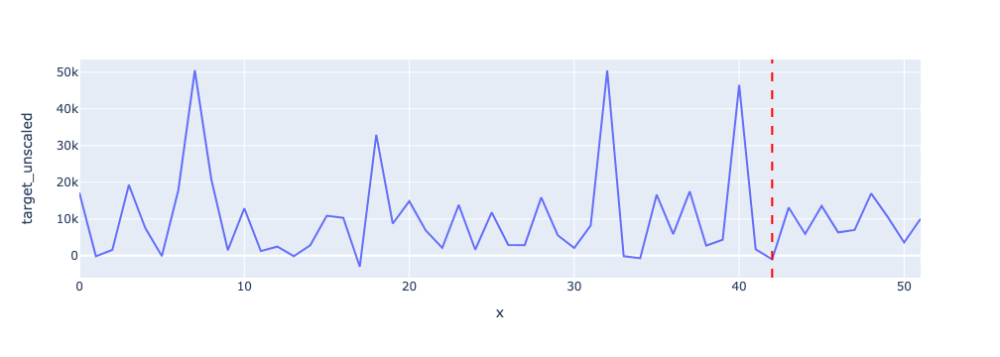

In [1237]:
# Creating a lineplot to show the unscaled predictions
fig = px.line(p14_pred_df, x=p14_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

We don't forecast any spikes bigger than 40k, instead we forecasted swings in the 16 to 3k range.

## P16 Forecast

Feature Selection

In [1238]:

final_df_scaled=final_df_og['2019-11':'2022-04']
final_df_scaled['target'] = df['P16']['2019-11':'2022-04'].values
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1239]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1240]:
bar = 1.1

In [1241]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)

print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')
final_df.drop(to_drop, axis=1, inplace=True)
rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.1 would remove 1200 features, leaving 10 to work with


,RMSE
India CPI lag1,1.04
PI_DE_EE_PC lag6,1.04
USA BI%Change,1.05
US_Manu_BI %Change,1.05
Euro area (19 countries) IR%Change lag9,1.08


In [1242]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 0 lag features with lower mf_score 
Features left: 9


,RMSE
India CPI lag1,1.04
PI_DE_EE_PC lag6,1.04
USA BI%Change,1.05
US_Manu_BI %Change,1.05
Euro area (19 countries) IR%Change lag9,1.08
OECD BI%Change,1.09
Avg_Manu_BI%Change,1.09
GBR BI%Change,1.09
PP_UK_EE_PC lag5,1.10


Feature Selection Plots

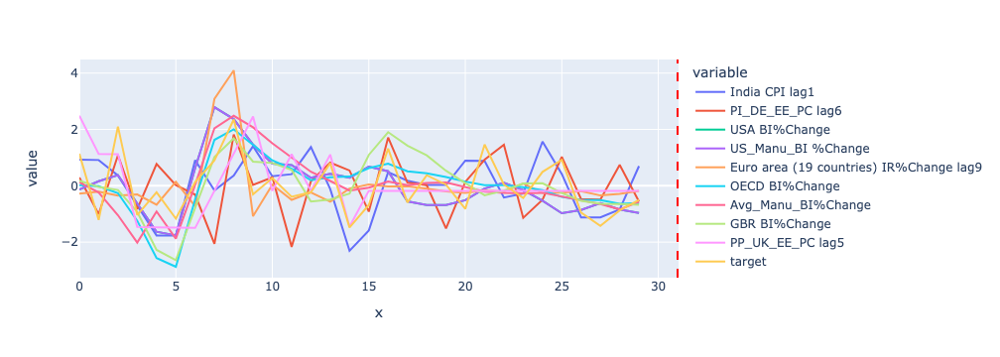

In [1243]:
# Creating a lineplot for the features of P16 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1244]:
# Dropping unuseful features
final_df.drop(['India CPI lag1','OECD BI%Change','Avg_Manu_BI%Change'],axis=1, inplace=True)

In [1245]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1246]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

62

In [1247]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1248]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [1249]:
to_plot = [['PI_DE_EE_PC lag6', 'US_Manu_BI %Change', 'Euro area (19 countries) IR%Change lag9', 'GBR BI%Change'],
          ['PI_DE_EE_PC lag6', 'Euro area (19 countries) IR%Change lag9', 'GBR BI%Change', 'PP_UK_EE_PC lag5'],
          ['PI_DE_EE_PC lag6', 'USA BI%Change', 'US_Manu_BI %Change', 'GBR BI%Change'],
          ['PI_DE_EE_PC lag6', 'USA BI%Change', 'Euro area (19 countries) IR%Change lag9', 'GBR BI%Change'],
          ['PI_DE_EE_PC lag6', 'US_Manu_BI %Change', 'Euro area (19 countries) IR%Change lag9', 'GBR BI%Change', 'PP_UK_EE_PC lag5']]

Iteration Notes:

- Covid low will be reduced, as it tricks several models into biasing off of it too much #Change2, RMSE imporved marginally
- Reducing the training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [1250]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P16'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1251]:
# Initialize the model with the parameters
model1 = KNeighborsRegressor()
model2 = GradientBoostingRegressor()
model3 = ExtraTreesRegressor()
model4 = NuSVR()
model5 = HuberRegressor()

In [1252]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2020-12':], y_train['2020-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1253]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1254]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1255]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2020-12':], y_train['2020-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1256]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1257]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1258]:
model = MLPRegressor()

In [1259]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2020-12':], y_train['2020-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1260]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1261]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1262]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2020-12':], y_train['2020-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1263]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1264]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1265]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2020-12':], y_train['2020-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1266]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1267]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

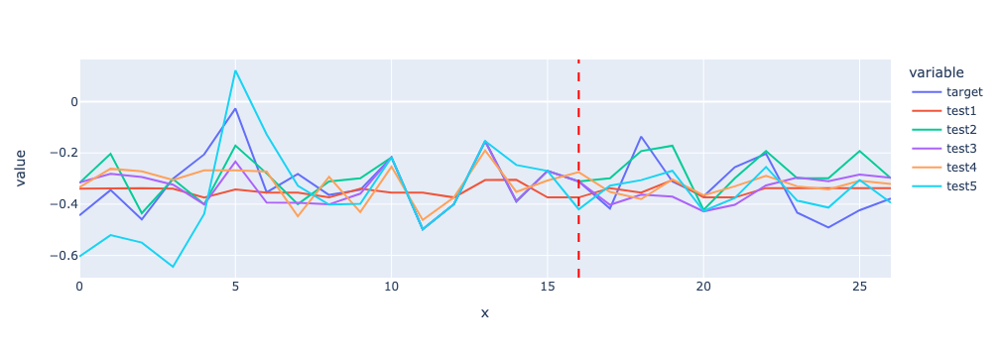

In [1268]:
# Creating a lineplot to compare the models
fig = px.line(plot_df[15:], x=plot_df[15:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=16, y0=0, x1=16, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- Test 5 was the closest prediction to the test , although we found this product set to be a hard one to predict correctly.

- The winning predictive multivariate model was the HuberRegressor a regression model that is less sensitive to anomalies than other linear regression models and can handle multivariate time series data, making it a robust choice for time series forecasting tasks. Making sense why it perfomed better in this setting.

- The feature selection of the model was:
    - Production Index Germany: Electrical Equipment Percentage Change lag 6
    - Producer Prices United Kingdom: Electrical Equipment Percentage Change
    - US's Manufacturing Business Confindence Percentage
    - Breat Britain's Manufacturing Business Confindence Percentage
    - Euro area (19 countries)'s Interest Rates Percentage Change lag 9

In [1287]:
features = list(to_plot[4])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model5,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p16_pred_df = pd.concat([final_df, predictions])

In [1288]:

# Reverse scale the column
unscaled_col = (p16_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p16_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p16_pred = round(p16_pred_df['target_unscaled'],2).values

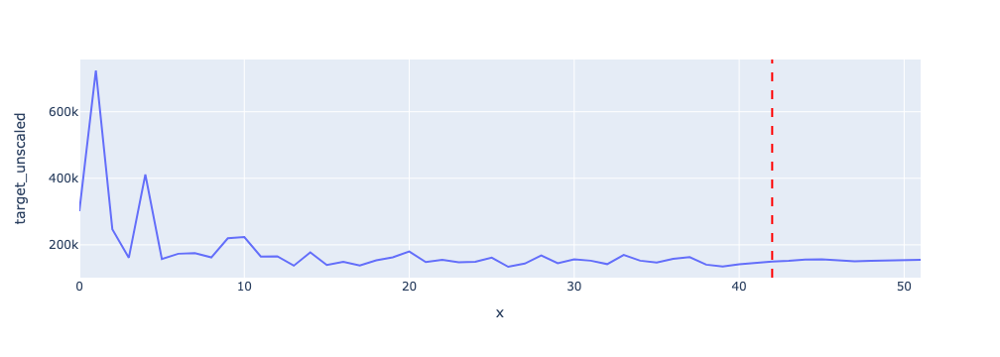

In [1289]:
# Creating a lineplot to show the unscaled predictions
fig = px.line(p16_pred_df, x=p16_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

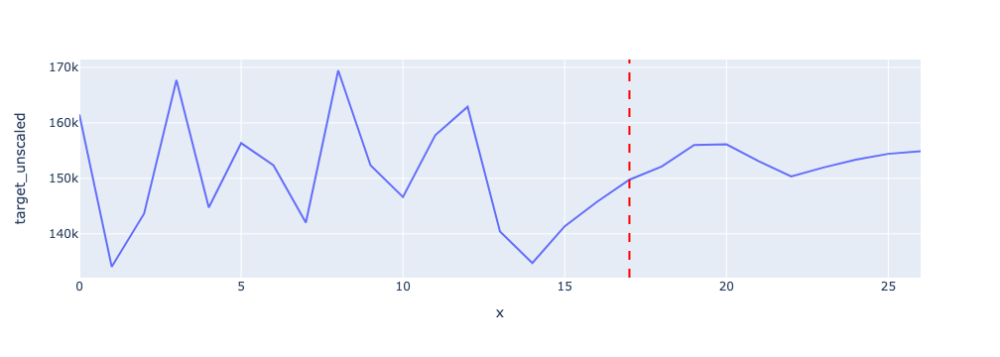

In [1290]:
# Set bounds for the predictions to get better results
fig = px.line(p16_pred_df[25:], x=p16_pred_df[25:].reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=(42-25), y0=0, x1=(42-25), y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

Sales of this product are forecasted to go flat, in the 155 to 150k range.

## P20 Forecast

Feature Selection

In [1419]:

final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P14'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1420]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1421]:
bar = 1.11

In [1422]:

rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)
final_df.drop(to_drop, axis=1, inplace=True)
print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')

rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.11 would remove 1201 features, leaving -1192 to work with


,RMSE
PP_DE_EE_PC lag5,0.91
Avg CPI Change lag12,1.05
PI_US_EE_PC lag9,1.06
India IR%Change lag7,1.07
PP_US_EE_PC lag12,1.07


In [1423]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df.index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df

Removed 1 lag features with lower mf_score 
Features left: 7


,RMSE
PP_DE_EE_PC lag5,0.91
Avg CPI Change lag12,1.05
PI_US_EE_PC lag9,1.06
India IR%Change lag7,1.07
PP_US_EE_PC lag12,1.07
United States IR%Change,1.08
PI_DE_EE_PC lag4,1.10


Feature Selection Plots

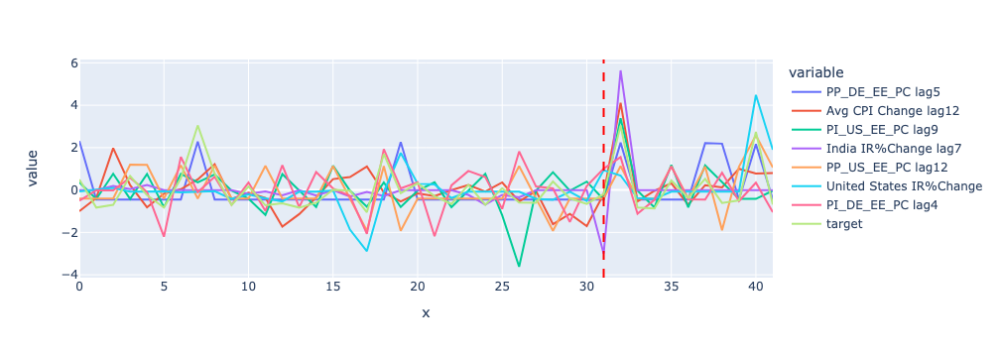

In [1424]:
## Creating a lineplot to show the features of P20 and the target 
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1425]:
final_df.drop('India IR%Change lag7', axis=1, inplace=True)

__Notes:__

We droppped India IR%Change lag7 due to misleading RMSE score

In [1426]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1427]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

62

In [1428]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]#['2019-12':]
#    # Create the Target
#    y = final_df['target']#['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train, X_test, y_train, y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1429]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(5)

In [1430]:
to_plot = [['PP_DE_EE_PC lag5', 'Avg CPI Change lag12', 'PP_US_EE_PC lag12', 'PI_DE_EE_PC lag4'],
          ['PP_DE_EE_PC lag5', 'Avg CPI Change lag12', 'PP_US_EE_PC lag12', 'PI_DE_EE_PC lag4'],
          ['PP_DE_EE_PC lag5', 'Avg CPI Change lag12', 'PP_US_EE_PC lag12', 'United States IR%Change', 'PI_DE_EE_PC lag4'],
          ['Avg CPI Change lag12', 'PP_US_EE_PC lag12', 'PI_DE_EE_PC lag4'],
          ['PP_DE_EE_PC lag5', 'Avg CPI Change lag12', 'PP_US_EE_PC lag12', 'United States IR%Change']]

Iteration Notes:

- Full training range also improved RMSE

Feature Selection Best Tests 1 - 5

In [1431]:
# Initialize the model with the parameters
model1 = ExtraTreeRegressor()
model2 = LinearSVR()
model3 = HuberRegressor()
model4 = ExtraTreeRegressor()
model5 = RANSACRegressor()

In [1432]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1433]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1434]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1435]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1436]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1437]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1438]:
model = MLPRegressor()

In [1439]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1440]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1441]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1442]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1443]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1444]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1445]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train['2019-12':], y_train['2019-12':])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1446]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1447]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

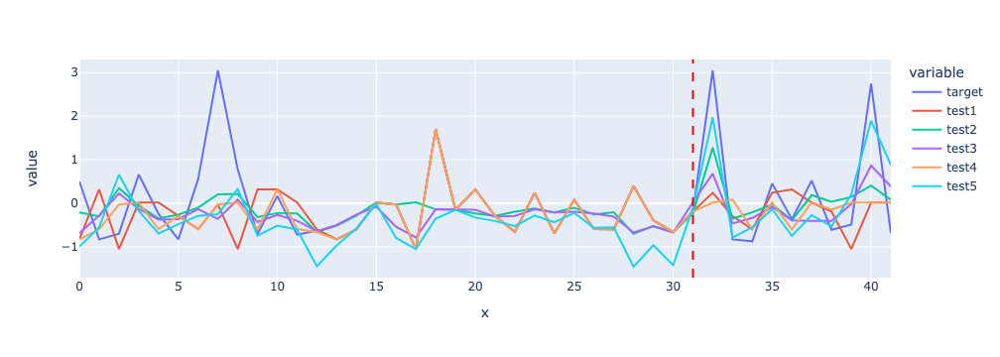

In [ ]:
# Creating a lineplot to compare the models
fig = px.line(plot_df, x=plot_df.reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=41-10, y0=0, x1=41-10, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- (Prior iteration) Test 2 is the winner, predicting the big spike at the start of test, something all the other models didnt do as well, we're not super happy the results, although we don't see another way of imporving withouth manipulating the data too much. 

- The winning predictive multivariate model was the LinearSVR which is a machine learning algorithm used for robust regression that can handle data with high level of noise and outliers.

- The feature selection of the model was:
    - Producer Prices Germany: Electrical Equipment Percentage Change lag 5
    - Producer Prices US: Electrical Equipment Percentage Change lag 12
    - United States Interest Rates Percentage Change
    - Average Consumer Price Index lag 12

In [1477]:
features = list(to_plot[1])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model2,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p20_pred_df = pd.concat([final_df, predictions])

In [1478]:

# Reverse scale the column
unscaled_col = (p20_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p20_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p20_pred = round(p20_pred_df['target_unscaled'],2).values

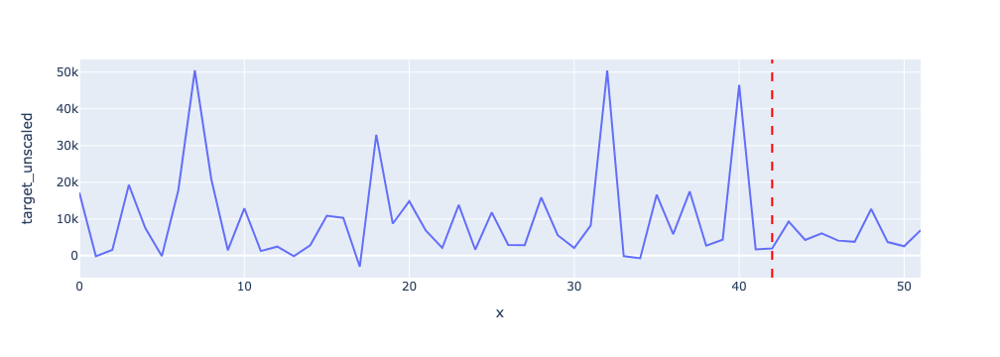

In [1479]:
# Creating a lineplot to show the unscaled predictions
fig = px.line(p20_pred_df, x=p20_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

Forecast a slow down on big swings, most likely due to exogenous variables whch we're proven to provide good test results.

## P36 Forecast

Feature Selection

In [1515]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
final_df_scaled=final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = df['P36'].values[1:]
scaler = StandardScaler()

scaled_model_df = scaler.fit_transform(final_df_scaled)
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)

In [1516]:
# Get the mean and variance of the target variable
target_mean = final_df_scaled['target'].mean()
target_var = final_df_scaled['target'].var()

In [1517]:
bar = 1.13

In [1518]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_scores = {}
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])
to_drop = list(rmse_df[rmse_df['RMSE'] > bar].index)
final_df.drop(to_drop, axis=1, inplace=True)
print('We removed features above the',bar,'would remove',len(to_drop),'features, leaving',
      len(final_df.columns) - len(to_drop),'to work with')

rmse_df = rmse_df[rmse_df['RMSE'] <= bar].sort_values('RMSE')[1:]
rmse_df.head(5)

We removed features above the 1.13 would remove 1201 features, leaving -1192 to work with


,RMSE
W_PMM_PC lag9,1.09
W_PC_PC lag9,1.09
W_PCOA_PC lag4,1.10
W_PE_PC lag4,1.11
W_PB_PC lag9,1.12


In [1519]:
og_rmse_df = rmse_df.copy()

for feat in rmse_df.index:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:-5]
        
        other_features = [f for f in rmse_df.index if f[:-4] == feat_name or f[:-5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)

feature_list = list(rmse_df[:-1].index)
feature_list.append('target')
final_df = final_df[feature_list]
print('Removed',len(og_rmse_df)-len(rmse_df),'lag features with lower mf_score \nFeatures left:',len(rmse_df))
rmse_df[:-1]

Removed 0 lag features with lower mf_score 
Features left: 8


,RMSE
W_PMM_PC lag9,1.09
W_PC_PC lag9,1.09
W_PCOA_PC lag4,1.10
W_PE_PC lag4,1.11
W_PB_PC lag9,1.12
IND BI%Change,1.12
CN_PI_ME_PC lag6,1.12


Feature Selection Plots

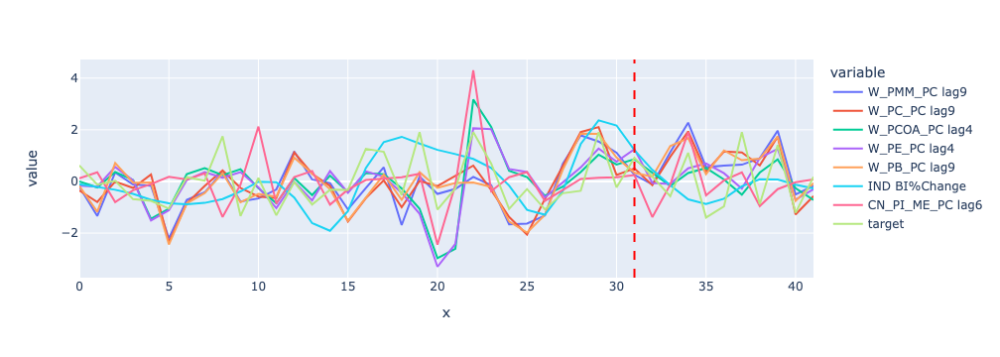

In [1520]:
# Creating a lineplot to show the features of P36 and the target
fig = px.line(final_df, x=final_df.reset_index().index, y=final_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )



fig.show()

In [1521]:
variables = final_df.columns.tolist()[:-1] # exclude the target column
max_selection_size = 5
all_selections = []

for selection_size in range(1, max_selection_size+1):
    for selection in itertools.combinations(variables, selection_size):
        all_selections.append(list(selection))


Models = ['XGB']

In [1522]:
feature_combos = all_selections

total_number_of_its = len(feature_combos)
total_number_of_its

119

In [1523]:
#rmse = []
#index = []
#
#i = 0
#
#start_time = time.time()
#
#for combo in feature_combos:
#    
#    X = final_df[combo]['2019-12':]
#    # Create the Target
#    y = final_df['target']['2019-12':]
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Reshape the input data to a 3-dimensional shape
#    X_train_array = X_train.to_numpy().reshape(-1, 1, X_train.shape[1])
#    X_test_array = X_test.to_numpy().reshape(-1, 1, X_test.shape[1])
#
#    i += 1
#    
#    clf = LazyRegressor(verbose=0)
#    models,predictions = clf.fit(X_train.iloc[4:], X_test, y_train.iloc[4:], y_test)
#    top_dogs = models.sort_values('RMSE').iloc[:2]
#
#    
#    model_1 = top_dogs.index[0]
#    model_2 = top_dogs.index[1]
#    score_1 = top_dogs['RMSE'].values[0]
#    score_2 = top_dogs['RMSE'].values[1]
#    rmse.append(score_1)
#    rmse.append(score_2)
#    index.append(str(combo)+model_1)
#    index.append(str(combo)+model_2)
#            
#    print(f'Progress:', round((i/total_number_of_its)*100,2),'%', end='\r')
#    time.sleep(0.5)
#    
#end_time = time.time()
#
#print(f"\nTime elapsed: {end_time - start_time:.2f} seconds")

In [1524]:
#results_test = pd.DataFrame(rmse)
#results_test.columns = ['RMSE']
#results_test.index = index
#results_test.sort_values('RMSE').head(20)

In [1525]:
to_plot = [['W_PMM_PC lag9', 'W_PC_PC lag9', 'CN_PI_ME_PC lag6'],
         ['W_PMM_PC lag9', 'W_PC_PC lag9', 'W_PB_PC lag9', 'CN_PI_ME_PC lag6'],
         ['W_PC_PC lag9', 'W_PB_PC lag9', 'CN_PI_ME_PC lag6'],
         ['W_PC_PC lag9', 'W_PCOA_PC lag4', 'W_PB_PC lag9', 'CN_PI_ME_PC lag6'],
         ['W_PMM_PC lag9', 'W_PC_PC lag9', 'W_PE_PC lag4', 'W_PB_PC lag9', 'CN_PI_ME_PC lag6']]

Iteration Notes:

- Full training range also improved RMSE
- Using .iloc[4:] to supply a better range for training, avoinding early spikes (Didn't work).

Feature Selection Best Tests 1 - 5

In [1526]:
# Initialize the model with the parameters
model1 = XGBRegressor()
model2 = DecisionTreeRegressor()
model3 = AdaBoostRegressor()
model4 = ExtraTreeRegressor()
model5 = GradientBoostingRegressor()


In [1527]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model1.fit(X_train.iloc[4:], y_train.iloc[4:])
# predict y for X_train and X_test
y_pred_train = model1.predict(X_train)
y_pred_test = model1.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1528]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1529]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1530]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model2.fit(X_train.iloc[4:], y_train.iloc[4:])
# predict y for X_train and X_test
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1531]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1532]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1533]:
model = MLPRegressor()

In [1534]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model3.fit(X_train.iloc[4:] ,y_train.iloc[4:])
# predict y for X_train and X_test
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1535]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1536]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1537]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model4.fit(X_train.iloc[4:], y_train.iloc[4:])
# predict y for X_train and X_test
y_pred_train = model4.predict(X_train)
y_pred_test = model4.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1538]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1539]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1540]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the mode

# Fit the model to your training data
model5.fit(X_train.iloc[4:], y_train.iloc[4:])
# predict y for X_train and X_test
y_pred_train = model5.predict(X_train)
y_pred_test = model5.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1541]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1542]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

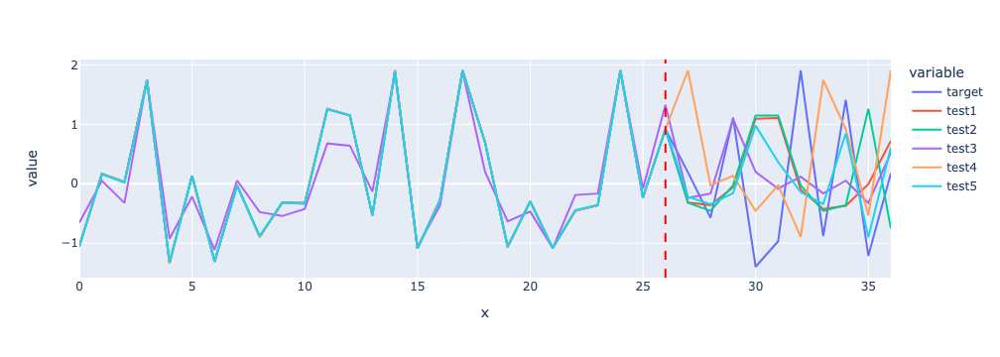

In [1543]:
# # Creating a lineplot to compare the models
fig = px.line(plot_df[5:], x=plot_df[5:].reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=26, y0=0, x1=26, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

__Notes:__

- Although most models seem to not predict well compared to the Test data, test3 was the one that predicted the direction swings the best, with the added benefit that it didnt overfit massively on the train data like the others did. On the other hand, we'll pick test 5 as the winning model as it only missed the massive dip on x = 30, which can be corrected by training the model with the whole data, and had an accurate long prediction accuracy.

- The winning predictive multivariate model was the GradientBoostingRegressor which is a supervised machine learning algorithm that uses an ensemble of decision trees to make predictions based on past data and other features, whereas other multivariate time series models are typically based on statistical methods that model the time series data itself, without considering other features.

- The feature selection of the model was:
    - World: Price of Metals & Minerals Percentage Change lag 9
    - World: Price of Copper Percentage Change lag 9
    - World: Price of Energy Percentage Change lag 4
    - World: Price of Base Metals Percentage Change lag 9
    - China Production Index Machinery & Electricals Percentage Change lag 6

In [1554]:
features = list(to_plot[4])
features.append('target')
final_df = final_df[features]

# Create and fit forecaster multi series
# ==============================================================================
forecaster = ForecasterAutoregMultiSeries(
                 regressor          = model5,
                 lags               = 10,
                 transformer_series = None,
                 transformer_exog   = None
             )

forecaster.fit(series=final_df)
# Predict and predict_interval
# ==============================================================================
steps = 10

# Predictions for item_1
predictions = forecaster.predict(steps=steps)
new_index = pd.date_range(start='2022-05', periods=len(predictions), freq='M').strftime('%Y-%m')
predictions.index = new_index

p36_pred_df = pd.concat([final_df, predictions])

In [1555]:

# Reverse scale the column
unscaled_col = (p36_pred_df[col].values * np.sqrt(target_var)) + target_mean
# Add the unscaled column as a new column in plot_df
unscaled_list.append(col + '_unscaled')
p36_pred_df[col + '_unscaled'] = unscaled_col.ravel()
    
p36_pred = round(p36_pred_df['target_unscaled'],2).values

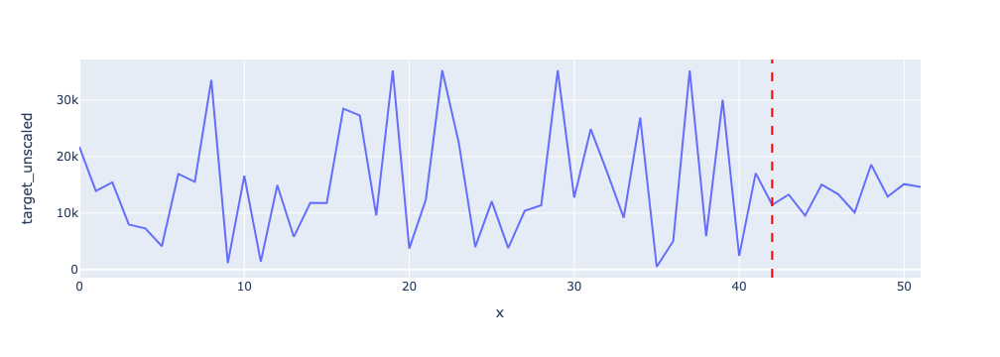

In [1556]:
# Creating a lineplot to show unscaled predictions
fig = px.line(p36_pred_df, x=p36_pred_df.reset_index().index, y='target_unscaled')
fig.add_shape(
            dict(type='line', x0=42, y0=0, x1=42, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

Similiarly to the tests, our models have struggled to predict the spikes, in the same our forcast predicts small spikes in the range of 10 to 18k

## Total Sales (Extra)

In [1573]:
# Create a new column in df called 'Sales%Change' which is the percent change of the 'Sales_EUR' column
df['Sales%Change'] = df['Sales_EUR'].pct_change() * 100

# Set target to the 'Sales%Change' column of df starting from the second value
target = df['Sales%Change'][1:]

# Set final_df_scaled to a slice of final_df_og that spans from November 2018 to April 2022, inclusive
# Create a new column in final_df_scaled called 'target' with the values in target
final_df_scaled = final_df_og['2018-11':'2022-04']
final_df_scaled['target'] = target.values

# Instantiate a StandardScaler object and fit_transform final_df_scaled
scaler = StandardScaler()
scaled_model_df = scaler.fit_transform(final_df_scaled)

# Create a new DataFrame called final_df using the scaled data in scaled_model_df, with column names and index matching those of final_df_scaled
final_df = pd.DataFrame(scaled_model_df, columns=final_df_scaled.columns, index=final_df_scaled.index)


In [1575]:
# create a dictionary to store RMSE scores for each feature
rmse_scores = {}

# calculate RMSE for each feature with respect to the 'target' column
for column in final_df.columns:
    rmse = sqrt(mean_squared_error(final_df['target'], final_df[column]))
    rmse_scores[column] = rmse

# create a DataFrame from the RMSE scores dictionary, and name the single column 'RMSE'
rmse_df = pd.DataFrame.from_dict(rmse_scores, orient='index', columns=['RMSE'])

# create a list of features whose RMSE value is greater than 1.2
to_drop = list(rmse_df[rmse_df['RMSE'] > 1.2].index)

# print a message indicating how many features would be removed if a different threshold value were used, as well as how many features would remain in 'final_df' after the specified features were dropped
print('We removed features above the', 0.22, 'would remove', len(to_drop), 'features, leaving',
      len(final_df.columns) - len(to_drop), 'to work with')

# drop the features whose RMSE value is greater than the specified threshold (currently commented out)
# final_df.drop(to_drop, axis=1, inplace=True)

# select the features whose RMSE value is less than or equal to 1.2, sort the values by ascending order of RMSE, and select the top 15 features
rmse_df = rmse_df[rmse_df['RMSE'] <= 1.2].sort_values('RMSE')[1:].head(15)

# display the updated 'rmse_df' DataFrame
rmse_df


We removed features above the 0.22 would remove 1154 features, leaving 56 to work with


,RMSE
India IR%Change lag2,0.79
Saudi Arabia CPI lag7,0.87
IT_SI_ME_PC lag9,1.03
Avg CPI Change lag7,1.04
CHN BI%Change lag11,1.04
China_Manu_BI %Change lag11,1.04
PI_US_EE_PC lag4,1.05
US_MNO BI%Change lag9,1.07
EU_SI_ME_PC lag9,1.08
W_PCOA_PC lag9,1.08


In [1576]:
# create a list of feature names containing 'ME_' or 'MEN_'
machinery_and_electricals = [column for column in list(rmse_df.index) if 'ME_' in column]
machinery_and_electricals.extend([column for column in list(rmse_df.index) if 'MEN_' in column])

# create a list of feature names containing 'EE_'
electrical_equipment = [column for column in list(rmse_df.index) if 'EE_' in column]

# create a list of feature names that are not in either 'machinery_and_electricals' or 'electrical_equipment'
rest_of_final_df = [column for column in rmse_df.index if column not in electrical_equipment and column not in machinery_and_electricals]


In [1577]:
#loop to drop the lags with lower mf_score
rmse_df_og = rmse_df.copy()

for feat in rmse_df.index:
        
    if feat in machinery_and_electricals or electrical_equipment:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:11]
        #print(other_features[1:])
        other_features = [f for f in rmse_df.index if f[:11] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)
        
    if feat == 'India':
        
        feat_name = 'India'
        
        other_features = [f for f in rmse_df.index if f[:5] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)
        
    if feat in rest_of_final_df:
        #print(feat)
        # get the first 5 characters of the feature name
        feat_name = feat[:13]
        
        other_features = [f for f in rmse_df.index if f[:13] == feat_name]
        #print(other_features[1:])
        rmse_df.drop(other_features[1:], axis=0, inplace=True)
    
print('Removed',len(rmse_df_og)-len(rmse_df),'lag features with lower rmse_score \nFeatures left:',len(rmse_df))

Removed 0 lag features with lower rmse_score 
Features left: 15


In [1578]:
rmse_df

,RMSE
India IR%Change lag2,0.79
Saudi Arabia CPI lag7,0.87
IT_SI_ME_PC lag9,1.03
Avg CPI Change lag7,1.04
CHN BI%Change lag11,1.04
China_Manu_BI %Change lag11,1.04
PI_US_EE_PC lag4,1.05
US_MNO BI%Change lag9,1.07
EU_SI_ME_PC lag9,1.08
W_PCOA_PC lag9,1.08


In [1579]:
# Extract the values of the 'target' column and store it in a separate variable
target_save = final_df['target'].values

# Reorder the columns of the DataFrame to match the order of the columns in rmse_df
final_df = final_df[list(rmse_df.index)]

# Restore the 'target' column to its original position in the DataFrame
final_df['target'] = target_save


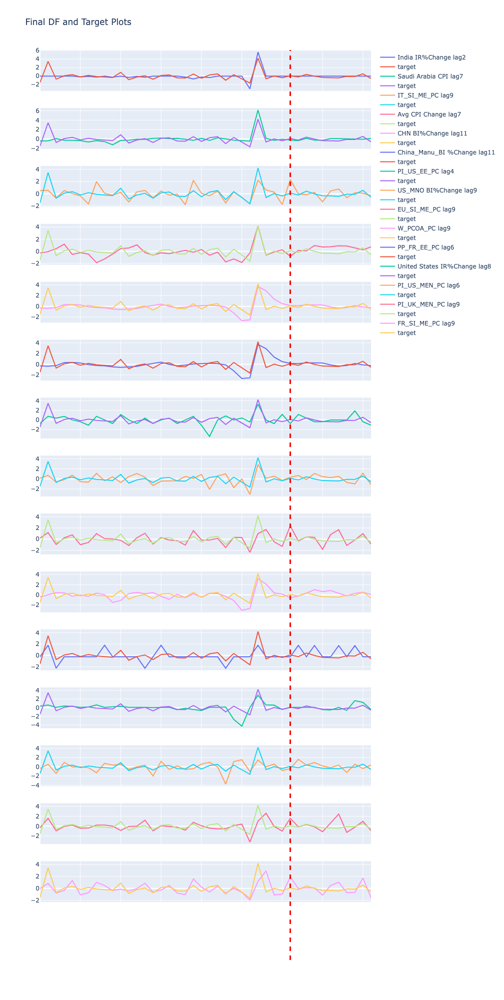

In [1580]:
import plotly.subplots as sp
import plotly.graph_objects as go


# Create a subplot with a row for each column in final_df
# The subplot is shared across all columns and will have the same x-axis
fig = sp.make_subplots(rows=len(final_df.columns), cols=1, shared_xaxes=True)

# Loop over each column in final_df
for i, column in enumerate(final_df.columns):
    # Add a vertical line to the subplot to indicate the start of the test set
    if column != 'target':
        fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )
        # Add a scatter plot of the values in the current column to the subplot
        fig.add_trace(go.Scatter(x=final_df.reset_index().index, y=final_df[column], name=column),
                      row=i+1, col=1)
        # Add a scatter plot of the target values to the subplot
        fig.add_trace(go.Scatter(x=final_df.reset_index().index, y=final_df['target'], name='target'),
                      row=i+1, col=1)

# Set the title and dimensions of the plot
fig.update_layout(title='Final DF and Target Plots', height=2000, width=



In [1581]:
# Create the model
model = MLPRegressor(random_state=123, hidden_layer_sizes=6, max_iter=400)

Evaluation

In [1582]:
#import itertools
#
#variables = final_df.columns.tolist()[:-1] # exclude the target column
#max_selection_size = 5
#all_selections = []
#
#for selection_size in range(1, max_selection_size+1):
#    for selection in itertools.combinations(variables, selection_size):
#        all_selections.append(list(selection))
#
#mae = []
#rmse = []
#r2 =[]
#mae_2 = []
#rmse_2 = []
#r2_2 =[]
#index = []
#        
#for selection in all_selections:
#    
#    X = final_df[selection]
#    # Create the Target
#    y = final_df['target']
#    # Split into train and test
#    days_forecast = 10
#    
#    y_train = y[:-days_forecast]
#    y_test = y[-days_forecast:]
#    
#    X_train = X[:-days_forecast]
#    X_test = X[-days_forecast:]
#    # Create and train the model
#    model.fit(X_train, y_train)
#    # predict y for X_train and X_test
#    y_pred_train = model.predict(X_train) 
#    y_pred_test = model.predict(X_test) 
#   
#    # Show performance results
#    resultsDF = performanceMetricsDF(metrics, y_train, y_pred_train, y_test, y_pred_test)
#    mae.append(resultsDF.T.iloc[2,0])
#    rmse.append(resultsDF.T.iloc[2,1])
#    r2.append(resultsDF.T.iloc[2,2])
#    mae_2.append(resultsDF.T.iloc[1,0])
#    rmse_2.append(resultsDF.T.iloc[1,1])
#    r2_2.append(resultsDF.T.iloc[1,2])
#    index.append(str(selection))

__Notes:__

To point out that we burnt the CPU and calculated for a maximum of 12 combinations, and the top results had 3 or 4 feartures still.

In [1583]:
#results_test = pd.DataFrame(mae)
#results_test.columns = ['MAE']
#results_test.index = index
#results_test['RMSE'] = rmse
#results_test['R2'] = r2
#results_test.sort_values('RMSE').head(5)

In [1584]:
#results_train = pd.DataFrame(mae_2)
#results_train.columns = ['MAE']
#results_train.index = index
#results_train['RMSE'] = rmse_2
#results_train['R2'] = r2_2
#results_train.sort_values('RMSE').head(5)

In [1585]:
to_plot = [['Saudi Arabia CPI lag7', 'CHN BI%Change lag11', 'US_MNO BI%Change lag9', 'United States IR%Change lag8', 'PI_US_MEN_PC lag6'],
          ['Saudi Arabia CPI lag7', 'China_Manu_BI %Change lag11', 'US_MNO BI%Change lag9', 'United States IR%Change lag8', 'PI_US_MEN_PC lag6'],
          ['Saudi Arabia CPI lag7', 'Avg CPI Change lag7', 'China_Manu_BI %Change lag11', 'FR_SI_ME_PC lag9'],
          ['Saudi Arabia CPI lag7', 'Avg CPI Change lag7', 'CHN BI%Change lag11', 'FR_SI_ME_PC lag9'],
          ['India IR%Change lag2', 'Avg CPI Change lag7', 'China_Manu_BI %Change lag11', 'FR_SI_ME_PC lag9']]

to_plot_2 = [['Saudi Arabia CPI lag7', 'IT_SI_ME_PC lag9', 'US_MNO BI%Change lag9', 'PP_FR_EE_PC lag6', 'PI_US_MEN_PC lag6'],
             ['China_Manu_BI %Change lag11', 'PI_US_EE_PC lag4', 'EU_SI_ME_PC lag9', 'PP_FR_EE_PC lag6', 'United States IR%Change lag8'],
             ['CHN BI%Change lag11', 'PI_US_EE_PC lag4', 'EU_SI_ME_PC lag9', 'PP_FR_EE_PC lag6', 'United States IR%Change lag8'],
             ['Avg CPI Change lag7', 'PI_US_EE_PC lag4', 'EU_SI_ME_PC lag9', 'PP_FR_EE_PC lag6', 'PI_US_MEN_PC lag6'],
             ['Avg CPI Change lag7', 'PI_US_EE_PC lag4', 'EU_SI_ME_PC lag9', 'PP_FR_EE_PC lag6', 'PI_UK_MEN_PC lag9']]

Feature Selection Best Train 1 - 5

In [1586]:
X = final_df[to_plot_2[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1587]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1588]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df_2 = pd.DataFrame(final_df['target'])
plot_df_2['test1'] = preds

In [1589]:
X = final_df[to_plot_2[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1590]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1591]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df_2['test2'] = preds

In [1592]:
X = final_df[to_plot_2[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1593]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1594]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df_2['test3'] = preds

In [1595]:
X = final_df[to_plot_2[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1596]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1597]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df_2['test4'] = preds

In [1598]:
X = final_df[to_plot_2[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1599]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1600]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df_2['test5'] = preds

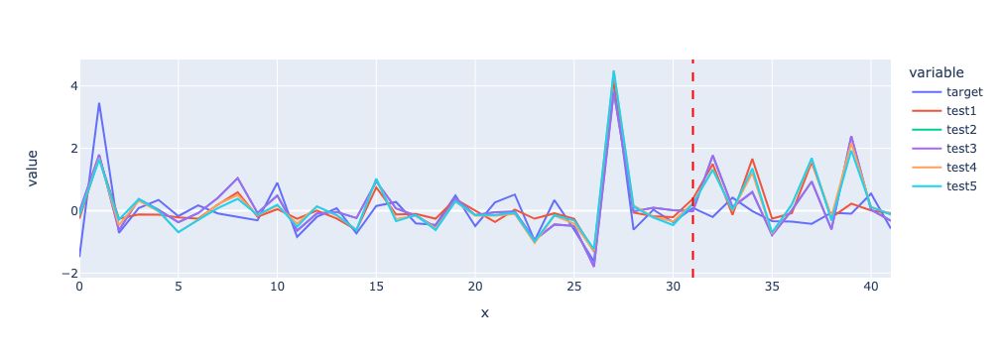

In [1601]:
# Creating a lineplot to compare the different models
fig = px.line(plot_df_2, x=plot_df_2.reset_index().index, y=plot_df_2.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

Feature Selection Best Tests 1 - 5

In [1602]:
X = final_df[to_plot[0]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1603]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1604]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df = pd.DataFrame(final_df['target'])
plot_df['test1'] = preds

In [1605]:
X = final_df[to_plot[1]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1606]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1607]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test2'] = preds

In [1608]:
X = final_df[to_plot[2]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1609]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1610]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test3'] = preds

In [1611]:
X = final_df[to_plot[3]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1612]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1613]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test4'] = preds

In [1614]:
X = final_df[to_plot[4]]
# Create the Target
y = final_df['target']
# Split into train and test
days_forecast = 10
y_train = y[:-days_forecast]
y_test = y[-days_forecast:]
X_train = X[:-days_forecast]
X_test = X[-days_forecast:]
# Create and train the model
model.fit(X_train, y_train)
# predict y for X_train and X_test
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test) 

# Visualize predictions vs close values 
temp = y_test.to_frame()
temp['Prediction'] = y_pred_test
temp['Residual'] = y_test - temp.Prediction

In [1615]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))

In [1616]:
preds = list(y_pred_train)
preds.extend(list(y_pred_test))
plot_df['test5'] = preds

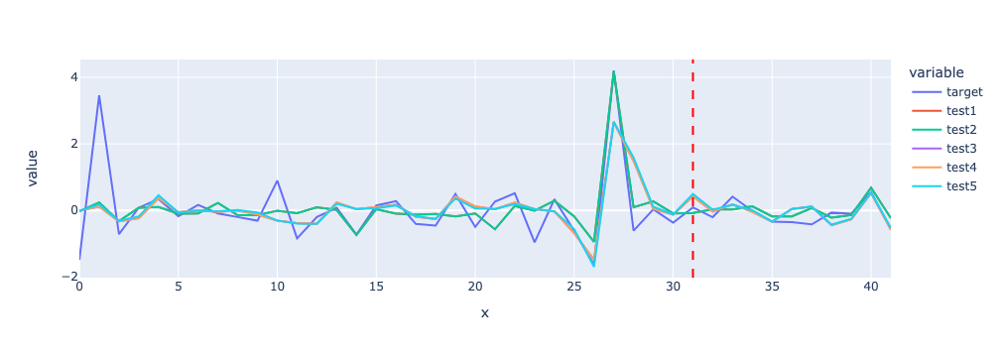

In [1617]:
# Creating a lineplot to compare the different models
fig = px.line(plot_df, x=plot_df.reset_index().index, y=plot_df.columns)
fig.add_shape(
            dict(type='line', x0=31, y0=0, x1=31, y1=1, xref='x', yref='paper',
                 line=dict(color='red', width=2, dash='dash'))
        )

fig.show()

<a class="anchor" id="5">

# Conclusion


    
## Product Specific Conclusions 
    
### Product 1

- Test 1 is the winning model since it catches all of momentum swings, is not overfitted on train and has lowest RMSE.

- The winning predictive multivariate model was the MLPRegressor, which is a feedforward neural network that can learn complex non-linear relationships in the data, whereas other multivariate time series models, such as ARIMA or VAR, rely on linear or autoregressive assumptions.

- The feature selection of the model was:
    - Average Interest Rates Percentage Change with a lag of 10
    - Production Index World: Machinery and Equipment n.e.c. Percentage Change with 1 month lag
    - Producer Prices Germany: Electrical Equipment Percentage Change.
    
### Product 3
    
- We pick Test 2 due to very solid results, more conservative peaks, aswell as no overfitting on train.

- The winning predictive multivariate model was the Stochastic Gradient Descent (SGD) which is an optimization algorithm used to train a wide range of machine learning models, including regression models. It is different from other multivariate time series models in that it updates the model parameters based on a single training instance at a time, as opposed to batch or mini-batch gradient descent which updates the parameters using the average gradient across multiple instances. 

- The feature selection of the model was:
    - United States Production Index Machinery & Electricals Percentage Change lag 1
    - Producer Prices United States: Electrical Equipment Percentage Change lag 4
    - Production Index Germany: Electrical Equipment Percentage Change lag 8
    - World: Price of Copper Percentage Change lag 9
    
Sales are forecasted to narrow down with swings that top at 15M and bottom at 13M
    
### Product 4
    
- Test 3 is the winning model since it had a better training prediction, as well as an okay prediction on test, given that all others didnt perform better.

- The winning predictive multivariate model was the AdaBoostRegressor is different from other multivariate time series models in that it uses an ensemble of weak learners that sequentially fit to the residuals of the previous learner, thus making it more robust against outliers and noise in the data.

- The feature selection of the model was:
    - India's Interest Rate Percentage Change lag 2
    - China's Manufacturing Business Confindence Percentage Change lag 11
    - Saudi Arabia's Consumer Price Index lag 7

Uptrend in spikes pre-Covid is not forecasted within the next 10 months, instead, we forecast a flat trend of swings between low 400k's and high 200k's
    
### Product 5

- Test 4 is the winning model, we're very happy with the forecasted results compared to the RMSE provided, test 3 is very similiar but has a big error on the test range, letting us infer that 'PI_DE_MEN_PC' is a determining feature (only difference between test 3 and 4). Overfitting will be something to avoid on the prediction.

- The winning predictive multivariate model was the DecisionTreeRegressor which is a non-linear regression model that captures complex interactions between features, but it does not inherently consider time dependencies between observations, making it less suitable for modeling time series data compared to other models that specifically account for time dependencies.

- The feature selection of the model was:
    - Europe Shipments Index Machinery & Electricals Percentage Change
    - Germany Shipments Index Machinery & Electricals Percentage Change
    - Production Index Germany: Machinery and Equipment n.e.c. Percentage Change
    - Germany Production Index Machinery & Electricals Percentage Change
    
No lags were picked by our algorithims for this product, making it the product with the highest sensibility to current events.

We forecast two swings, spiking at 13M in the first half of the 10 months, in the latter stage we predict a big spike in sale of 19M.
    
### Product 6
    
- Test 1 is the winning model since it caches all of momentum swings, is not overfitted on train and has lowest RMSE

- At a second iteration with other models, we pick model 2 which has a the highest RMSE, and solid performance overall, given the intrinsic hard pattern detection of the product 6 data.

- The winning predictive multivariate model was the PassiveAggressiveRegressor which is a linear regression model that updates its weights in an online fashion, meaning it can learn from data as it arrives and does not require retraining on the entire dataset, making it more suitable for real-time applications in this multivariate time series analysis.

- The feature selection of the model was:
    - Average Consumer Price Index Percentage Change lag2
    - Brazil Interaste Rates Percentage Change lag 4
    - Average Interaste Rates Percentage Change
    
We forecast an upkeep of the trend that has been historically set, with regular swings.
    
### Product 8
    
- We will go ahead with model 3 since it learned the uptrend and on test predicted a significant spike, early ranges are bad, but we did'nt train the model for it, so its fine

- The winning predictive multivariate model was the MLPRegressor, which was explained in Product's 1 winning model

- The feature selection of the model was:
    - Average Consumer Price Index Percentage Change lag 2
    - India's Business Confindence
    - Brazil's Interest Rate Percentage Change lag 4

Uptrend in spikes pre-Covid is not forecasted within the next 10 months, instead, we forecast a flat trend of swings between low 400k's and high 200k's
    
### Product 9

- Test 1 is the best one overall, cathing most of the momentum on all ranges.

- The winning predictive multivariate model was the KNeighborsRegressor which is different from all other multivariate time series models in that it is a non-parametric model that predicts the target value based on the average of the K-nearest neighbors, where the distance between the neighbors is calculated based on the Euclidean distance between the predictor variables, and it doesn't take into account the temporal relationship between the samples.

- The feature selection of the model was:
    - World: Price of Natural Gas index Percentage Change lag 2
    - Great Britain's Business Confindence Percentage Change
    
Since the KNeighborsRegressor needs a higher amount of training data in order to have solid results we upped the lags on the foracast. 

We forecast a continuation of the downtrend in spikes of sales post Covid, picking just under 15k, and flatiing out at the near median range of 5k.

### Product 11
    
- We pick test 3 due to marginal accurcy increase on the test data, more realistic spikes and momentum swings.

- The winning predictive multivariate model was the XGBRegressor which is an optimized implementation of gradient boosting that can handle complex datasets with high-dimensional features, making it particularly useful for multivariate time series problems with a large number of covariates.

- The feature selection of the model was:

    - Japan Shipments Index Machinery & Electricals Percentage Change lag 6
    - Japan Production Index Machinery & Electricals Percentage Change lag 6
    - Production Index World: Machinery and Equipment n.e.c. Percentage Change lag 6
    - Production Index World Electrical Equipment Percentage Change lag 6
    
Interesting to note that all features share the same lag, and are not specifically related to the EU.

We forecast an uptrend for the spikes, from 2.8M to 3.5M, and bottoms of 1M, 35k, and 670k through the 10 months.
    
### Product 12
    
- Test 5 looks like the best one to predict further, even tho the fit on train isn't the best, it was capable to predicting the swings on test

- The winning predictive multivariate model was the ExtraTreesRegressor which differs has it is a tree-based ensemble model that can capture complex non-linear relationships in multivariate time series data while avoiding overfitting, by randomly selecting subsets of features and samples during the training process.

- The feature selection of the model was:
    - Producer Prices United States: Electrical Equipment Percentage Change lag 1
    - Producer Prices China: Electrical Equipment Percentage Change lag 6

We forecast tight swings in the majority of the 10 months with 350k highs and 250k lows, with a spike downwards in the 9th month hitting a 230k bottom.
    
### Product 13
    
- Test 1 is the winner since it has the best prediction out of all, we will make sure to reduce the overfitting tendency of the model itself with the whole train set.

- The winning predictive multivariate model was the ExtraTreesRegressor, the same has product 12.

- The feature selection of the model was:
    - India's Interest Rate Percentage Change lag 3
    - Production Index United States: Electrical Equipment Percentage Change lag 5
    - Saudi Arabia's Consumer Price Index lag 8
    
We forecast sales that spike twice in different directions, with a upwards spike at 45.5k and a downwards spike at 12.5k
    
### Product 14
    
- We will try to clip the Covid spike and the x = 2. After changing the values of df['14'] the spikes on test are predicted sucessfully on most models.

- The winning model was test 3 which has tested really well.

- The winning predictive multivariate model was the LinearRegression which is different from all other multivariate time series models in that it assumes a linear relationship between the dependent variable and the independent variables.

- The feature selection of the model was:
    - Producer Prices Germany: Electrical Equipment Percentage Change lag 5
    - Production Index United States: Electrical Equipment Percentage Change lag 9
    - Producer Prices United States: Electrical Equipment Percentage Change lag 12
    - US's Interest Rates Percentage Change
    - Average Consumer Price Index lag 12
    
We don't forecast any spikes bigger than 40k, instead we forecasted swings in the 16 to 3k range.
    
### Product 16
    
- Test 5 was the closest to making a prediction, although we found this product set to be a hard one to predict correctly.

- The winning predictive multivariate model was the HuberRegressor a regression model that is less sensitive to anomalies than other linear regression models and can handle multivariate time series data, making it a robust choice for time series forecasting tasks. Making sense why it perfomed better in this setting.

- The feature selection of the model was:
    - Production Index Germany: Electrical Equipment Percentage Change lag 6
    - Producer Prices United Kingdom: Electrical Equipment Percentage Change
    - US's Manufacturing Business Confindence Percentage
    - Breat Britain's Manufacturing Business Confindence Percentage
    - Euro area (19 countries)'s Interest Rates Percentage Change lag 9
    
Sales of this product are forecatsed to go flat, in the 155 to 150k range.
    
### Product 20
    
- (Prior iteration) Test 2 is the winner, predicting the big spike at the start of test, something all the other models didnt do as well, we're not super happy the results, although we don't see another way of imporving withouth manipulating the data too much. 

- The winning predictive multivariate model was the LinearSVR which is a machine learning algorithm used for robust regression that can handle data with high level of noise and outliers.

- The feature selection of the model was:
    - Producer Prices Germany: Electrical Equipment Percentage Change lag 5
    - Producer Prices US: Electrical Equipment Percentage Change lag 12
    - United States Interest Rates Percentage Change 
    - Average Consumer Price Index lag 12

We forecast a slow down on big swings, most likely due to exogenous variables whch we're proven to provide good test results.
    
### Product 36
    
- Although most models seem to not predict well compared to the Test data, test3 was the one that predicted the direction swings the best, with the added benefit that it didnt overfit massively on the train data like the others did. On the other hand, we'll pick test 5 as the winning model as it only missed the massive dip on x = 30, which can be corrected by training the model with the whole data, and had an accurate long prediction accuracy.

- The winning predictive multivariate model was the GradientBoostingRegressor which is a supervised machine learning algorithm that uses an ensemble of decision trees to make predictions based on past data and other features, whereas other multivariate time series models are typically based on statistical methods that model the time series data itself, without considering other features.

- The feature selection of the model was:
    - World: Price of Metals & Minerals Percentage Change lag 9
    - World: Price of Copper Percentage Change lag 9
    - World: Price of Energy Percentage Change lag 4
    - World: Price of Base Metals Percentage Change lag 9
    - China Production Index Machinery & Electricals Percentage Change lag 6

Similiarly to the tests, our models have struggled to predict the spikes, in the same our forcast predicts small spikes in the range of 10 to 18k.

## Total Sales High Level Conclusions

Takeaways from the Total Sales best train and test combinations, for the train time range, the test forecast was predicted to have a swings with local tops of 1.7 and local bottoms in the -0.19 area, similiar behaviour, although enhitened, to the train set. In the termos of the feature combinations, we realize that a lot of the features were given by the Siemens team. With both points taken into account, they lead us to believe that those data points help us to forecast, with their respective lag, in normal market conditions. 

On the other hand, the test dataset proves to be a Post-Covid, Lockdown Reopenings, Supply Chain Shocks and Banking Liquidity Injections cocktail and a resulting Inflation hangover. Why?

- Macro datapoints that we loaded to the model proved to be much better indicators to forecast the last 10 months of Sales%Change.

- The regular swings forecasted by the best forecasting features in the train dataset disappeared.

- Inflation rises, Rate hikes, changes in manufacturing business confidence, we're the main top features.

For the intended 10 Month forecast, we don't believe market conditions have come back to normal so we assume that the same indicators that were important to foracast the last 10 months will be the same for the next.

Another lesson, for forecasting, is that we shouldn't be anectodal when selecting features and forecasting to the Smart Infrastructure departements. Hindsight will always be 2020 of course, but if a team relied on what previously worked at 2022-04 they would forecast wrong data that would put Siemens in further jeopordy (assuming COVID slowed down their operations). The key here is to forecast, not only with the important features of the past, but also having in mind what could be the important feature for the next months. In this case the Macros were important. 

# Presentation Metrics References

In [ ]:
# Calculate the mean absolute percentage error (MAPE) of three predicted variables compared to the actual values
# The three variables are P6, P4, and P13
# The MAPE is calculated using the formula (predicted - actual) / actual * 100
# The mean of the MAPE values is then calculated and returned
mape = ((((p6_pred.mean() - df['P6'][-10:].mean()) / df['P6'][-10:].mean()) * 100) +
        (((p4_pred.mean() - df['P4'][-10:].mean()) / df['P4'][-10:].mean()) * 100) +
        (((p13_pred.mean() - df['P13'][-10:].mean()) / df['P13'][-10:].mean()) * 100)) / 3
mape

In [ ]:
# Calculate the mean absolute percentage error (MAPE) of three predicted variables compared to the mean of their actual values
# The three variables are P6, P4, and P13
# The MAPE is calculated using the formula (predicted - actual_mean) / actual_mean * 100
# The mean of the MAPE values is then calculated and returned
mape1 = ((((p6_pred.mean() - df['P6'].mean()) / df['P6'].mean()) * 100) +
        (((p4_pred.mean() - df['P4'].mean()) / df['P4'].mean()) * 100) +
        (((p13_pred.mean() - df['P13'].mean()) / df['P13'].mean()) * 100)) / 3
mape1

In [ ]:
# Calculate the mean absolute percentage error (MAPE) of five predicted variables compared to their actual values
# The five variables are P1, P9, P14, P16, and P20
# The MAPE is calculated using the formula (predicted - actual) / actual * 100
# The mean of the MAPE values is then calculated and returned
pp1 = (((p1_pred.mean() - df['P1'][-10:].mean()) / df['P1'][-10:].mean()) * 100)
pp9 = (((p9_pred.mean() - df['P9'][-10:].mean()) / df['P9'][-10:].mean()) * 100)
pp14 = (((p14_pred.mean() - df['P14'][-10:].mean()) / df['P14'][-10:].mean()) * 100)
pp16 = (((p16_pred.mean() - df['P16'][-10:].mean()) / df['P16'][-10:].mean()) * 100)
pp20 = (((p20_pred.mean() - df['P20'][-10:].mean()) / df['P20'][-10:].mean()) * 100)
(pp1 + pp9 + pp14 + pp16 + pp20) / 5


In [ ]:
# Calculate the mean absolute percentage error (MAPE) of five predicted variables compared to the mean of their actual values
# The five variables are P1, P9, P14, P16, and P20
# The MAPE is calculated using the formula (predicted - actual_mean) / actual_mean * 100
# The mean of the MAPE values is then calculated and returned
pp1 = (((p1_pred.mean() - df['P1'].mean()) / df['P1'].mean()) * 100)
pp9 = (((p9_pred.mean() - df['P9'].mean()) / df['P9'].mean()) * 100)
pp14 = (((p14_pred.mean() - df['P14'].mean()) / df['P14'].mean()) * 100)
pp16 = (((p16_pred.mean() - df['P16'].mean()) / df['P16'].mean()) * 100)
pp20 = (((p20_pred.mean() - df['P20'].mean()) / df['P20'].mean()) * 10)
(pp1 + pp9 + pp14 + pp16 + pp20) / 5


In [ ]:
# Calculate the mean absolute percentage error (MAPE) of six predicted variables compared to their actual values
# The six variables are P3, P5, P8, P11, P12, and P36
# The MAPE is calculated using the formula (predicted - actual) / actual * 100
# The mean of the MAPE values is then calculated and returned
pp3 = (((p3_pred.mean() - df['P3'][-10:].mean()) / df['P3'][-10:].mean()) * 100)
pp5 = (((p5_pred.mean() - df['P5'][-10:].mean()) / df['P5'][-10:].mean()) * 100)
pp8 = (((p8_pred.mean() - df['P8'][-10:].mean()) / df['P8'][-10:].mean()) * 100)
pp11 = (((p11_pred.mean() - df['P11'][-10:].mean()) / df['P11'][-10:].mean()) * 100)
pp12 = (((p12_pred.mean() - df['P12'][-10:].mean()) / df['P12'][-10:].mean()) * 100)
pp36 = (((p36_pred.mean() - df['P36'][-10:].mean()) / df['P36'][-10:].mean()) * 100)
(pp3 + pp5 + pp8 + pp11 + pp12 + pp36) / 6


In [ ]:
# Calculate the mean absolute percentage error (MAPE) of six predicted variables compared to the mean of their actual values
# The six variables are P3, P5, P8, P11, P12, and P36
# The MAPE is calculated using the formula (predicted - actual_mean) / actual_mean * 100
# The mean of the MAPE values is then calculated and returned
pp3 = (((p3_pred.mean() - df['P3'].mean()) / df['P3'].mean()) * 100)
pp5 = (((p5_pred.mean() - df['P5'].mean()) / df['P5'].mean()) * 100)
pp8 = (((p8_pred.mean() - df['P8'].mean()) / df['P8'].mean()) * 100)
pp11 = (((p11_pred.mean() - df['P11'].mean()) / df['P11'].mean()) * 100)
pp12 = (((p12_pred.mean() - df['P12'].mean()) / df['P12'].mean()) * 100)
pp36 = (((p36_pred.mean() - df['P36'].mean()) / df['P36'].mean()) * 100)
mape = (pp3 + pp5 + pp8 + pp11 + pp12 + pp36) / 6
